# IMPORTS

In [1]:
import pandas as pd
import os
import matplotlib.pyplot as plt
import IPython.display as ipd
# % pylab inline
import os
import pandas as pd
import librosa
import glob 
import librosa.display
import random

from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from keras.utils.np_utils import to_categorical

import numpy as np
from keras.models import Sequential
from keras.layers import Dense, Dropout, Activation, Flatten
from keras.layers import Convolution2D, MaxPooling2D
from keras.optimizers import Adam
from keras.utils import np_utils
from sklearn import metrics 

from sklearn.datasets import make_regression
from sklearn.preprocessing import StandardScaler
from sklearn import metrics
from sklearn.model_selection import train_test_split, GridSearchCV

from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout 
from tensorflow.keras.wrappers.scikit_learn import KerasRegressor

from keras.callbacks import EarlyStopping
from keras import regularizers
from sklearn.preprocessing import LabelEncoder

from datetime import datetime

# DATA PROCESSING 
### (ONLT USING TRAINING FOLDER DATA FOR TRAIN, VALIDATE AND TEST)

In [2]:
# CHNAGE THE ABSOLUTE PATH TO THE ARCHIVED FOLDER LOCATION WHERE test-clean/ and train-clean-100/ exists
src_data_path = '<</home/linux2/Data>>'

In [56]:
# DATA DOWNLOADED FROM http://www.openslr.org/12/
main_test_path = os.path.join(src_data_path,'test-clean')
main_train_path = os.path.join(src_data_path,'train-clean-100')

In [7]:
with open(os.path.join(src_data_path, "SPEAKERS.TXT" ),'r') as f:
    data = f.read()
    f.close()

#### GET ALL THE SPEAKERS INFO

In [17]:
SPEAKER_DF = pd.DataFrame([d.split('|') for d in data.split('\n') if '|' in d][2:])

# COLS = [t.strip() for t in data.split('\n')[11].split("|")]
COLS = 'ID|SEX|SUBSET|MINUTES|NAME'.split("|")

# FORMATTING
SPEAKER_DF = SPEAKER_DF.loc[:,:4]

# FORMATTING COLUMNS
SPEAKER_DF.columns = COLS

# FORMATTING
SPEAKER_DF.SEX = SPEAKER_DF.SEX.apply(lambda x:x.strip())

# ENFORCING STRING FORMAT
SPEAKER_DF.ID = SPEAKER_DF.ID.apply(lambda x:str(x).strip())

# ENFORCING STRING FORMAT
SPEAKER_DF.SUBSET = SPEAKER_DF.SUBSET.apply(lambda x:str(x).strip())

In [71]:
# GET ALL FLAC FILES NAMES FOR TRAINING

In [72]:
sub_dirs = os.walk(main_train_path)

In [73]:
all_files = []
for _,_,p in sub_dirs:
    _p = [i for i in p if '.flac' in i]
    all_files+=_p

In [74]:
print(f"Total Files: {len(all_files)}")

28539

In [90]:
# GET ALL SPEAKER IDs
male_ids = SPEAKER_DF[(SPEAKER_DF.SEX=='M') & (SPEAKER_DF.SUBSET=='train-clean-100')].ID.tolist()
female_ids = SPEAKER_DF[(SPEAKER_DF.SEX=='F') & (SPEAKER_DF.SUBSET=='train-clean-100')].ID.tolist()

In [94]:
# df_male =pd.DataFrame([[f,1] for f in all_files if f.split('-')[0] in male_ids],columns=['file','label'])
# df_female =pd.DataFrame([[f,0] for f in all_files if f.split('-')[0] in female_ids],columns=['file','label'])
# len(df_male)
# len(df_female)

In [99]:
# CREATE DATAFRAME FILENAME | LABEL (MALE/FEMALE)
df = pd.DataFrame(all_files,columns=['file'])
df['label'] = df.file.apply(lambda x: 1 if x.split('-')[0] in male_ids else 0)
# SHUFFLE FOR 50/50 FEMALE MALE SPLIT
df = df.sample(frac=1).reset_index(drop=True)

# SPLITTING CRITERIA 
#### 70% TRAIN | 20% VALIDATE | 10% TEST

In [109]:
train_pts = int(len(df)*0.7)
validate_pts = int(len(df)*0.2)
test_pts = len(df)-train_pts-validate_pts

In [112]:
df_train = df[:train_pts]

df_train['label'].value_counts(normalize=True)

In [115]:
df_validation = df[train_pts:train_pts+validate_pts]

df_validation['label'].value_counts(normalize=True)

In [117]:
df_test = df[train_pts+validate_pts:]
df_test['label'].value_counts(normalize=True)

1    0.50718
0    0.49282
Name: label, dtype: float64

# Feature extraction

In [124]:
def extract_features(files):
    
    f = files.file
    uid,chp,_ = f.split('-')
    # Sets the name to be the path to where the file is in my computer
    file_name = os.path.join(main_train_path,uid,chp,f)

    # Loads the audio file as a floating point time series and assigns the default sample rate
    # Sample rate is set to 22050 by default
    X, sample_rate = librosa.load(file_name, res_type='kaiser_fast') 

    # Generate Mel-frequency cepstral coefficients (MFCCs) from a time series 
    mfccs = np.mean(librosa.feature.mfcc(y=X, sr=sample_rate, n_mfcc=40).T,axis=0)

    # Generates a Short-time Fourier transform (STFT) to use in the chroma_stft
    stft = np.abs(librosa.stft(X))

    # Computes a chromagram from a waveform or power spectrogram.
    chroma = np.mean(librosa.feature.chroma_stft(S=stft, sr=sample_rate).T,axis=0)

    # Computes a mel-scaled spectrogram.
    mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)

    # Computes spectral contrast
    contrast = np.mean(librosa.feature.spectral_contrast(S=stft, sr=sample_rate).T,axis=0)

    # Computes the tonal centroid features (tonnetz)
    tonnetz = np.mean(librosa.feature.tonnetz(y=librosa.effects.harmonic(X),
    sr=sample_rate).T,axis=0)
        
    
    # We add also the classes of each file as a label at the end
    label = files.label

    return mfccs, chroma, mel, contrast, tonnetz, label

In [125]:
# Code to start the timer to see how long it takes to extract the features
startTime = datetime.now()

# Applying the function to the train data by accessing each row of the dataframe
features_label = df.apply(extract_features, axis=1)

# Code to see how long it took
print(datetime.now() - startTime)

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.01016875  0.01161501  0.00902807 ... -0.00294907 -0.00225703
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00466884 -0.00519102 -0.00328713 ... -0.00090705 -0.00109238
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-2.7586202e-05 -3.2514366e-05 -3.3352135e-05 ...  3.7556812e-05
  9.3987755e-06 -2.7419662e-06] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWa

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.01774373 -0.02212831 -0.02042443 ... -0.01196724 -0.00989262
 -0.00376941] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00468813  0.00644483  0.00555801 ... -0.00805126 -0.00774855
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.00333451 0.00546218 0.00400918 ... 0.0167166  0.00574441 0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.0037684

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.0010274  -0.00140289 -0.00062508 ... -0.00024461 -0.00024108
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00108946 -0.001298   -0.00107895 ... -0.00109929 -0.00092553
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.00021255 0.00027352 0.00018865 ... 0.00470107 0.00400892 0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.0071764

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00083298 -0.00116467 -0.00103205 ... -0.00183278 -0.00156288
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00418803 -0.00460757 -0.00366264 ...  0.00273402  0.00264778
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-4.0132789e-05 -8.8076551e-05 -3.7884303e-05 ... -5.9321895e-04
 -8.7930035e-04  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWa

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00242562 -0.00312037 -0.00285339 ...  0.00114794  0.00193142
  0.0011841 ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.00058336 0.00058621 0.00034304 ... 0.00575406 0.00574398 0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.0078932   0.00683536  0.00228008 ...  0.00136506  0.00051011
 -0.00048579] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-3.1259383

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.00058398 0.00091952 0.00112773 ... 0.00061108 0.00053149 0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-2.1135160e-05 -9.7945358e-06 -1.5915806e-05 ... -1.4415626e-04
  6.2378473e-05  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00047088 -0.00056386 -0.00046498 ...  0.00411196  0.00429793
  0.00234216] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: 

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00330702 -0.00537103 -0.01223778 ...  0.01355843  0.01259578
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 1.5762036e-05  1.5078422e-04 -1.4508149e-04 ... -1.4924191e-02
 -1.3839488e-03  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00855642 -0.00986878 -0.00832136 ...  0.00154791  0.00095297
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWa

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 1.0482586e-04 -8.9842670e-06 -3.2424834e-04 ...  8.1602186e-05
  3.1793112e-05  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 2.3884767e-04  4.5648416e-05  2.7150756e-05 ... -2.4291810e-04
 -3.8362283e-04  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.00446289 0.00531575 0.00452525 ... 0.00252495 0.00249446 0.00154535] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/home/linux2/miniconda3/envs/python

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.00096062 0.00115837 0.00112721 ... 0.00129962 0.00099819 0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.0005338   0.00119583  0.00175361 ... -0.00095067 -0.00064544
 -0.00014756] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.0024968  0.00333777 0.00295807 ... 0.00382156 0.00419806 0.00267665] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.00143783 0.0015

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00033435  0.00097575  0.00102329 ...  0.00057425 -0.00092191
 -0.00081107] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00022541 -0.00027462 -0.00023529 ...  0.00023935  0.00018612
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00083493  0.00133369  0.00157837 ... -0.00033087 -0.00040061
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.00407743 0.00456757 0.00192478 ... 0.00302907 0.00307775 0.00141577] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-1.4219546e-03 -1.5020308e-03  3.2754807e-04 ...  5.2621335e-06
 -1.9118004e-06  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.0006616  -0.00062569 -0.00097507 ...  0.00018441  0.00015117
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: 

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00294733 -0.00400171 -0.00430446 ... -0.00103879 -0.00093513
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00047148 -0.00055875 -0.00065324 ...  0.00091045 -0.00038361
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.00526999 0.00769726 0.00227323 ... 0.00021528 0.00012356 0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.0015467

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00133433  0.00127908  0.0007237  ... -0.00148118 -0.00168085
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00082818  0.00026654  0.00113061 ...  0.00651782  0.00568703
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00093653 -0.00087748 -0.0005249  ...  0.00094683  0.0027902
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.00

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-5.1301495e-06 -2.4488947e-05 -1.6522838e-05 ...  6.7922256e-06
  2.0953583e-05  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 7.3475362e-06  2.5893933e-05  3.2661624e-06 ... -1.0547532e-05
 -2.6835829e-05  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00130478  0.00116917  0.00043294 ...  0.00047023 -0.00174016
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/5226526

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.0036846  0.00361996 0.00336044 ... 0.00400851 0.00451723 0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 1.7294459e-02  3.8939703e-03 -2.6528923e-02 ... -5.8516312e-06
  8.0256950e-06  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.01203645  0.00982524 -0.00051023 ...  0.0104884  -0.00958269
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: 

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00021831 -0.00026587 -0.00027876 ...  0.00204263  0.00195804
  0.00113674] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00594462 -0.00376264  0.00556102 ... -0.00348919 -0.00396143
 -0.00258237] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 1.4998786e-06 -4.7873955e-06  2.1549522e-05 ...  1.1687297e-03
  1.4753800e-03  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWa

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 1.2763777e-04 -4.8113125e-04 -1.6938898e-03 ...  1.0414786e-03
  5.6445296e-04  9.8420998e-05] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.00131655 0.00156677 0.00139954 ... 0.00209304 0.00186714 0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 3.1806423e-05  3.8303342e-04  7.1545341e-04 ... -5.1031020e-03
 -3.2300001e-03 -1.2959905e-03] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:2

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-1.76917776e-04 -1.07974454e-04  5.58437296e-06 ... -3.07727780e-04
 -3.20125400e-04  0.00000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00632637 -0.00676687 -0.00568251 ...  0.00670045  0.00597019
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00399297 -0.00298267 -0.00425136 ...  0.00032139  0.00046212
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: Fu

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.00242856 0.00297699 0.00242552 ... 0.00178465 0.00180698 0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00164935 -0.00199803 -0.00142506 ...  0.00040093  0.00063237
  0.0004106 ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-9.0859213e-04 -2.3538937e-04  1.0844473e-03 ... -9.8766643e-05
 -5.3255513e-05  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: 

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00010937  0.0003387   0.00037481 ... -0.00251129 -0.00204589
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-3.3802474e-03 -9.6952444e-04  1.9700790e-03 ...  3.6095451e-05
  5.4183682e-05  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00093645 -0.00109557 -0.00095172 ...  0.00062199  0.00060112
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWa

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00316281  0.003677    0.00301784 ... -0.00024446 -0.00025023
 -0.00015602] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00740278  0.00845623  0.00690762 ... -0.00285295 -0.00317083
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[1.6466834e-04 7.1384777e-05 4.4087345e-05 ... 1.3131928e-03 1.1737071e-03
 0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning:

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00116773  0.00127663  0.00092288 ... -0.00268934 -0.00319211
 -0.00221823] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00424247 -0.00503746 -0.00437874 ... -0.00420982 -0.00419383
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.00810986 0.00988322 0.00880158 ... 0.01022581 0.00790338 0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.0004358

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.00037728 0.00030405 0.00077664 ... 0.00039186 0.00073165 0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00063624 -0.00082175 -0.00072271 ...  0.00220582  0.00233123
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 6.0384016e-05 -3.0498975e-04 -5.1054871e-04 ...  3.8132325e-04
 -5.0587685e-05 -1.6898157e-04] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: 

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.0027432  -0.00228797 -0.00091133 ... -0.00194667 -0.00277254
 -0.00195179] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/home/linux2/miniconda3/envs/python/lib/python3.8/site-packages/librosa/util/decorators.py:88: UserWarning: n_fft=1024 is too small for input signal of length=917
  return f(*args, **kwargs)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 5.2683445e-05 -2.3886062e-04 -7.3212769e-04 ... -1.6173231e-04
 -6.0152973e-04  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.         0.         0.         ... 0.02315987 0.01484351 0.        ] as keyword args. From version 0.10 

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00219416  0.00288797  0.00263574 ... -0.01473562 -0.01125996
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-5.4679462e-05 -5.3555545e-05 -8.4842222e-06 ...  4.1783159e-04
  1.7987490e-04  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00131546  0.00238942  0.00193669 ... -0.00026022 -0.00021425
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWa

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 4.3923952e-05  4.0265553e-05  7.4225318e-05 ... -4.5340715e-04
 -5.6836964e-04  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00159745  0.00090349 -0.00093104 ... -0.00265304 -0.00187861
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00326098 -0.00380571 -0.00310161 ...  0.0018795   0.00193836
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWa

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00140143 -0.00176553 -0.00166586 ...  0.00370902  0.00378232
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.00088397 0.00128548 0.0009993  ... 0.0020247  0.00150367 0.00082974] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00036005  0.00034252  0.00047067 ... -0.00071967 -0.00061731
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.0017544

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00081048  0.00181729  0.0034591  ... -0.00294549 -0.00293496
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00303621 -0.00261083 -0.00153652 ...  0.00320461  0.00249963
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00318773 -0.00372574 -0.00245951 ...  0.00019649  0.00138419
  0.00120449] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.0

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00396802 -0.00328399 -0.00168402 ... -0.00041799 -0.00158099
 -0.00107888] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.0005411  0.00064666 0.00055707 ... 0.00059644 0.00066507 0.00043566] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00132657  0.0010745   0.00033097 ... -0.00265484 -0.002979
 -0.00192343] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00384066 

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00670951 -0.00869929 -0.00620348 ...  0.00159662 -0.0002363
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.0062475  0.00608328 0.00459951 ... 0.00232449 0.00195548 0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00134251 -0.0014885  -0.00101229 ... -0.00039277 -0.00046412
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-4.4472668e

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00408879 -0.00397195 -0.00182129 ... -0.00089726 -0.00086288
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[6.2582898e-05 6.6366349e-04 1.0578623e-03 ... 4.8014469e-04 8.9391011e-05
 0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00759548 -0.00336756  0.00501541 ... -0.00436419 -0.00387383
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning:

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-3.4272666e-06 -2.0502983e-05 -3.2886055e-05 ... -2.9818236e-03
 -3.0005823e-03  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.00012475 0.00040132 0.00032513 ... 0.0036766  0.00239975 0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00424756 -0.00504747 -0.00434066 ... -0.00517902 -0.00463451
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: 

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.23707213 -0.28321156 -0.24302281 ... -0.24751212 -0.27016634
 -0.17285137] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-2.6361491e-03 -2.9232528e-03 -5.8392185e-04 ... -5.1853676e-06
  3.3724816e-06 -1.8099395e-06] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-1.5344993e-02 -2.3836115e-02 -1.5298632e-02 ...  6.0294657e-05
  9.0926734e-04  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/5226526

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-3.4629706e-05 -1.8034241e-04 -7.8352612e-05 ...  1.9845965e-03
  1.7064564e-03  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-1.4383241e-03 -1.4343325e-03 -3.0937931e-04 ...  1.4367582e-03
 -3.1460604e-05 -6.7001017e-04] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.00160819 0.00194119 0.00169531 ... 0.0040748  0.00346168 0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:2

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 2.19041158e-05 -3.28598944e-05 -6.29927672e-05 ...  2.61786154e-05
  1.27640615e-05  0.00000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.00091436 0.00121833 0.0011542  ... 0.00146671 0.00113586 0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00498909  0.00470288  0.0034282  ... -0.00105687 -0.00117655
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWar

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.00139982 0.00206881 0.00224422 ... 0.00215133 0.0031155  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[1.7350406e-04 8.8159599e-05 3.8925672e-04 ... 7.4107367e-05 4.5741031e-06
 0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00387035 -0.00738389 -0.00978975 ...  0.00053279  0.00050266
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 9.7609841e-04  1.2544139e-04 -1.6443060e-04 ...  3.5319387e-04
 -3.7325790e-05  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.01157215 -0.01351592 -0.01145939 ... -0.01233419 -0.0131991
 -0.00844766] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 2.9390067e-05  1.6816350e-05 -2.3522109e-05 ...  1.8338314e-05
  1.5223404e-05  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/52265264

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-4.2331449e-04 -1.9006975e-04  1.2531594e-05 ... -9.4529823e-04
 -7.3229225e-04 -4.5753177e-04] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00485183  0.00364742 -0.00026129 ... -0.00148179 -0.00115842
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 1.0809889e-05 -3.2516549e-04 -3.2603755e-04 ...  2.3229828e-04
  6.6968158e-04  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/5226526

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 5.3201808e-04  3.2821106e-04 -6.2903942e-05 ... -3.3410954e-05
 -5.9982208e-06  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.00302672 0.00230208 0.00060221 ... 0.00038973 0.00057205 0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[9.5936505e-04 1.8702977e-03 2.1160366e-03 ... 5.8778352e-04 3.3307177e-05
 0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: Fut

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 3.2694668e-05 -7.7613298e-04 -1.7137772e-03 ...  8.3806424e-04
  1.1581804e-03  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.00015285 0.00044998 0.00056227 ... 0.006857   0.00767689 0.004443  ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.00153541 0.00170875 0.00121606 ... 0.00036221 0.0003115  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00227519 -0.00257078 -0.00010419 ...  0.00031957 -0.00034987
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00570718  0.00499952  0.00556952 ... -0.00032441 -0.00059423
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00284685  0.000558    0.00356035 ... -0.00238653 -0.00250566
 -0.00109798] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00031614 -0.00051847 -0.00242106 ...  0.00388306 -0.00080819
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00094351  0.00108282  0.00098425 ... -0.00165285 -0.00095956
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00129312 -0.001755   -0.0017567  ...  0.00177443  0.00163231
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.00251238 0.002653   0.00099384 ... 0.00110418 0.00211939 0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 1.1963745e-03  1.6837951e-03  1.5906133e-03 ... -8.9144516e-05
 -5.8953687e-05  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00416054 -0.00510049 -0.00451857 ...  0.00316633  0.00327334
  0.00199494] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: 

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 9.9180543e-05  9.9580837e-05  5.4405107e-05 ...  5.5728356e-06
  3.7433743e-05 -2.3660394e-05] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-2.3935158e-05 -1.4279296e-05  2.5942297e-06 ... -2.9200140e-05
 -7.8127541e-06  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[2.0516179e-04 3.5344341e-04 3.5239375e-04 ... 4.5052689e-04 2.4455367e-04
 4.6117202e-05] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_2

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.01137463 0.01348263 0.01166869 ... 0.01191241 0.00854855 0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.01694384 0.02003299 0.01634985 ... 0.01410532 0.01896914 0.01262215] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-1.9135068e-05 -8.2410825e-06 -1.1639066e-05 ...  2.1864133e-04
  3.5916906e-04  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00519904  0.00585917  0.00433427 ... -0.00126441 -0.00141948
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00029837 -0.00013768  0.00049143 ... -0.00369889 -0.00651589
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00031847 -0.00027015 -0.0001925  ...  0.0005361   0.00158776
  0.00129216] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.0

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00025424 -0.00034856 -0.00035514 ...  0.00029597  0.00015106
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00128693 -0.00172713 -0.00186214 ...  0.001204    0.00149721
  0.00108227] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.00688269 0.00825406 0.00698613 ... 0.00458899 0.00393847 0.00149998] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.0015912

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00277828 -0.00333911 -0.00336151 ... -0.00231109 -0.00217522
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00152485  0.00142584  0.00077235 ... -0.00291571 -0.00253622
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00010559  0.00031514  0.00081316 ... -0.00149278 -0.0012046
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.0

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00016711 -0.000181   -0.00014687 ... -0.00159573 -0.00088938
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.0049474   0.00083607 -0.00783424 ...  0.00808445  0.00061495
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.0054239  -0.00622341 -0.00516482 ... -0.00730989 -0.00590355
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00017702  0.00022933  0.00019031 ... -0.00376279 -0.0035316
 -0.00187436] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 1.6635988e-04  1.2303205e-04  2.5963468e-06 ...  8.5339874e-05
  1.3268382e-05 -4.6979440e-06] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.00109588 0.00113884 0.00078679 ... 0.00035307 0.00017585 0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/home/linux2/miniconda3/envs/python/lib/python3.8/site

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00017256 -0.00019734 -0.00019908 ... -0.00131205 -0.00100212
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-1.9934990e-03 -3.6034563e-03 -4.3204851e-03 ... -9.9239941e-04
  4.0126312e-07  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00333708  0.00449831  0.0044436  ... -0.0024744  -0.00182126
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWa

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 1.16201394e-04  1.12132977e-04  7.73949359e-05 ... -1.15301751e-04
 -1.02964812e-04  0.00000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00052227  0.00047705  0.00037057 ... -0.00105299 -0.00080281
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 1.5367507e-03  1.3284385e-03 -3.9963383e-04 ... -3.2206677e-04
 -9.0513291e-05  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/5

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.0000000e+00  0.0000000e+00  0.0000000e+00 ... -1.5688149e-05
 -2.0884696e-04  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00285572 -0.00105858  0.00142867 ... -0.00459974 -0.00320304
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00088992 -0.00112077 -0.00101668 ... -0.00033585 -0.00030274
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWa

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[8.2163385e-04 1.0684762e-03 6.7293813e-04 ... 1.9482078e-03 6.1893690e-05
 0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 2.0720621e-03 -5.5137603e-04 -3.8769222e-03 ... -5.7191606e-05
 -5.2905537e-04  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.0029023   0.00344175  0.00298216 ... -0.00144561 -0.00159181
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00164715 -0.00035335  0.00237509 ... -0.0001235   0.00036897
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-1.8415698e-03 -1.4661833e-03 -4.8070826e-04 ... -4.3259547e-04
 -2.8185322e-04 -4.3420594e-05] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.00026338 0.00028072 0.00019392 ... 0.00033545 0.00033598 0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: 

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.00159064 0.0016611  0.00067596 ... 0.00600488 0.00805929 0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 5.1265157e-05 -5.4772216e-04 -3.1947985e-03 ...  5.4579107e-03
  2.3600233e-03  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00098166 -0.00117217 -0.00081182 ... -0.00153427 -0.00135824
 -0.00069513] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: 

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-3.1443750e-03 -3.3791407e-03 -1.3085895e-03 ...  3.2513279e-03
  5.7230201e-05  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 1.6288805e-03 -2.3320657e-05  1.9760818e-04 ... -2.4505523e-03
 -5.3043794e-03 -5.1948982e-03] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.00175871 0.00192808 0.00155579 ... 0.00320773 0.00279796 0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:2

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.0011661  0.00127202 0.0009368  ... 0.0005889  0.00054918 0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 2.7163620e-03  2.8595878e-03  1.6633808e-03 ... -2.2846616e-04
 -8.2112319e-06  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00077349 -0.00031255  0.00058763 ...  0.00047676  0.00039603
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: 

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00101993  0.00128691  0.00145933 ... -0.00099751 -0.00053935
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00025341 -0.00075637 -0.00078891 ... -0.00383712 -0.00201586
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-1.0211122e-04 -3.8536587e-06 -4.0947783e-05 ...  4.9047067e-04
  5.1498727e-04  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWa

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00149656 -0.00212555 -0.00206955 ...  0.00205161  0.00241612
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[5.9404018e-05 1.0379450e-04 1.4772959e-04 ... 1.3491159e-04 8.5960986e-05
 0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 6.1066821e-05 -4.8856098e-05 -4.6171361e-04 ...  7.9127298e-05
  1.9042061e-04  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00149291 -0.001012    0.00053375 ... -0.00269447 -0.00208488
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00554761 -0.00731105 -0.0071893  ... -0.00263065 -0.00190879
 -0.00119194] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.02466683 0.02911818 0.02571297 ... 0.03225405 0.03030771 0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-3.6881240

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00092953 -0.00135846 -0.00102809 ... -0.00211865 -0.00087827
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/home/linux2/miniconda3/envs/python/lib/python3.8/site-packages/librosa/util/decorators.py:88: UserWarning: n_fft=1024 is too small for input signal of length=760
  return f(*args, **kwargs)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.0044956   0.00458563  0.00365548 ... -0.00219302 -0.00173467
 -0.00079851] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 1.3191885e-06 -6.0823720e-07 -2.5615363e-06 ...  3.8342492e-05
  3.0501022e-05  0.0000000e+00] as keyword args. From versio

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00037233  0.00040639  0.00045271 ... -0.00079238 -0.00059906
 -0.00027117] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00388574 -0.00318842  0.00025991 ...  0.00092215  0.00089693
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00180527 -0.00204677  0.00097931 ...  0.002724    0.00262595
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-7.5275886e-05 -1.6859147e-05  5.2686981e-05 ...  1.4523049e-03
  1.1154456e-03  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00138693 -0.00235638 -0.00102499 ...  0.00095473  0.00066159
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-1.2723947e-03 -1.0081249e-03 -3.3132761e-05 ... -3.6858037e-04
 -1.1309993e-03  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/5226526

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00036949 -0.00139807 -0.00184814 ...  0.00490186  0.00657704
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.02784683 0.03277147 0.02754875 ... 0.00405732 0.0035163  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-1.5480837e-03 -1.9061116e-03 -1.6788206e-03 ... -4.8596135e-05
  2.6446116e-05  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: 

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00086778 -0.00092372 -0.00071032 ... -0.00303444 -0.00326236
 -0.00199697] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00067031 -0.00080831 -0.00090249 ... -0.00042589 -0.00283876
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00062919  0.00069824  0.00046759 ... -0.00136437 -0.00098241
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-1.5069027e-06  9.7987106e-07  1.5766736e-06 ... -3.0251575e-05
 -5.7493024e-05  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-3.7913211e-04 -8.2668412e-05  1.2300829e-04 ...  5.6162075e-04
  1.3322313e-03  1.0532174e-03] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.01462702 0.01569379 0.0132233  ... 0.01242601 0.01165131 0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:2

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-8.4828476e-05 -2.2690296e-05 -3.7057275e-06 ... -2.9441781e-04
 -1.4079441e-04  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00146012 -0.00193317 -0.00183266 ... -0.0005211  -0.00028644
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00040786 -0.00014352 -0.0010442  ...  0.00063347  0.0017958
  0.00115118] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWar

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00149425 -0.00142288 -0.0006373  ... -0.01718934 -0.01268456
 -0.00415221] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-4.1562589e-04  3.0917302e-04  1.3418164e-03 ...  7.6616771e-04
  7.9402252e-04  3.9243001e-05] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.0025605   0.00308739  0.00255711 ... -0.01556346 -0.01247403
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWa

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-6.2375900e-04 -6.1858894e-04 -4.3839592e-04 ... -3.9790320e-04
 -1.2621995e-04 -3.2640422e-05] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00046593  0.00063527  0.0020888  ... -0.00050796 -0.00092796
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00032276 -0.00033089 -0.00022004 ... -0.00032572 -0.0002452
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWar

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00032342 -0.0001993  -0.0001103  ...  0.0008761   0.00125288
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00128424 -0.00042471 -0.00290004 ... -0.00035165 -0.00051944
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00046342  0.00153644  0.00280843 ... -0.00201675 -0.00111376
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.0

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-2.3760691e-05 -1.1893562e-05 -1.0942905e-06 ...  5.4399876e-05
  3.6494661e-05  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00045612 -0.00050778 -0.0003694  ...  0.00078279  0.00096057
  0.0006279 ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-3.3460978e-07  5.0922858e-07 -1.6805869e-10 ... -2.2049758e-06
  1.1321221e-06  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/5226526

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00098789  0.00322772  0.0053188  ... -0.00162969 -0.00169696
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00131301  0.00148335  0.00086631 ... -0.00261458 -0.00163559
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00513119  0.00619783  0.0056     ... -0.00229824 -0.00147905
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.0

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.0079151   0.0121513   0.01449618 ... -0.0009721  -0.00097609
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.0010559   0.00108892  0.00063338 ... -0.00045407 -0.0005492
 -0.00032617] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 2.1249281e-04  2.7489860e-04  1.8315692e-05 ... -8.1258658e-03
 -2.6182458e-03 -2.2762292e-03] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWar

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00023442 -0.00029382 -0.00026097 ...  0.00210719  0.00269812
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 4.7851229e-04  4.0726186e-04  5.3560991e-05 ... -9.1112408e-05
 -7.1761453e-05  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.01475425 -0.01746547 -0.0158519  ...  0.01025379  0.0102165
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWar

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.00450443 0.00507769 0.00435348 ... 0.00446615 0.00471483 0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00168263 -0.00260138 -0.00057037 ...  0.00254906  0.00395485
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[4.5699894e-04 4.8465322e-04 3.3144184e-04 ... 3.3267926e-05 3.0786308e-05
 0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.0010898  -0.00214736 -0.00353526 ... -0.00479516 -0.00410014
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00604044  0.00497759 -0.00097636 ... -0.00132237 -0.00459947
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.02165721 0.02530807 0.02175704 ... 0.0260222  0.02860827 0.01794357] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.0040943

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.00084904 0.00073294 0.0007757  ... 0.00112439 0.00042385 0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-4.4535496e-05 -1.3815943e-04  3.3589215e-05 ...  6.2873977e-04
  1.5280701e-03  1.1693436e-03] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 2.6011876e-06  1.8377392e-05  3.7717047e-05 ... -2.3751551e-05
 -3.4104394e-06  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:2

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00024463 -0.00025546 -0.0002559  ... -0.00261895 -0.00203523
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-1.6906550e-04 -1.5988403e-04 -1.0486825e-04 ...  3.3471602e-05
  3.1074342e-05  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00648345 -0.00660481 -0.00306586 ...  0.00398619  0.00402574
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWa

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00040941  0.00054326  0.00046808 ... -0.00209383 -0.00215635
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00025205 -0.00034923 -0.00014104 ...  0.00639654  0.00208524
 -0.00033526] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00497279 -0.00710268 -0.00502327 ...  0.00143103  0.00036297
 -0.00028751] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00132007 -0.00152518 -0.0013476  ...  0.00484624  0.0040181
  0.00185739] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00023567 -0.00029797 -0.00025189 ... -0.00525326 -0.00475263
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.00082194 0.0011589  0.00119561 ... 0.00215601 0.00181247 0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.00020067 

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00107566 -0.00127434 -0.0010673  ...  0.00035392  0.00016129
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-4.0294118e-03 -5.7569211e-03 -5.1067276e-03 ... -3.3194349e-06
 -2.0401168e-04  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 4.9762084e-04  3.3180646e-04 -5.4517008e-05 ... -4.2520054e-03
 -3.1650362e-03  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/5226526

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-1.5107663e-03 -1.7266232e-03 -1.3645708e-03 ... -2.6875154e-05
 -6.7740548e-05 -2.0896194e-05] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.00202358 0.00225289 0.00133477 ... 0.00296935 0.00281344 0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00025287  0.00033022  0.00030696 ... -0.00033837 -0.00024006
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: 

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00079271 -0.00051156 -0.00038295 ... -0.00336187 -0.0026915
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.03621015 -0.04303356 -0.03656222 ... -0.03247925 -0.035958
 -0.02280004] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-2.4819570e-05 -1.3609705e-05  4.7303306e-06 ...  3.8690990e-07
  2.2759750e-06  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarni

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.01162778  0.01105423  0.00597512 ... -0.00953375 -0.01102741
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.0004722   0.00114991  0.0015505  ... -0.0011532  -0.00091701
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00087887 -0.0014623  -0.00200618 ... -0.01235625 -0.01091557
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00304891  0.00563649  0.00987829 ... -0.00113054 -0.00178374
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00105608 -0.00129793 -0.00118006 ...  0.00454307  0.00633982
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 6.7369052e-04  3.6208425e-04 -8.9591733e-05 ... -5.3566386e-04
 -2.2803283e-04  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWa

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00153509 -0.00160309 -0.00156389 ...  0.00127101  0.00109332
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00262479  0.00296811  0.00231155 ... -0.00923716 -0.0079052
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 2.9557716e-04  4.0121442e-05 -3.1307430e-04 ... -2.9537423e-06
 -3.2149885e-05  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWar

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-2.4598987e-05  1.0176385e-05  3.8200047e-05 ... -3.4044791e-05
 -3.7412443e-05  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00293315 -0.00349921 -0.00305015 ...  0.00256498  0.00070509
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00013461 -0.00148757 -0.00301531 ... -0.00175648 -0.00174684
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWa

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-1.5882620e-06  1.7797670e-06  7.0335045e-07 ... -9.7450829e-05
 -1.3185834e-04  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.02048702 -0.00778284  0.01308839 ... -0.00497717 -0.00342246
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00144806 -0.00169906 -0.00153051 ... -0.00174195 -0.00199728
 -0.00129204] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWa

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 3.3327102e-04  2.3910085e-04  6.2976396e-05 ... -8.8144833e-04
 -7.0451538e-04  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00110261 -0.00098699 -0.00044914 ...  0.00263438  0.00067416
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00270121 -0.00595793 -0.00870813 ...  0.00012649  0.00029676
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWa

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.00060305 0.00139611 0.00093055 ... 0.00187661 0.00120631 0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.00119428 0.0013638  0.00099576 ... 0.00456254 0.00399409 0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.00573143 0.00580627 0.00485646 ... 0.00075001 0.00042846 0.00014997] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 5.2364110e-05  2.547274

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-1.2084226e-03 -1.6429785e-03 -8.4471749e-04 ... -9.4961601e-05
 -1.4710716e-03  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00190863 -0.00205828 -0.0060351  ... -0.0106124  -0.01434362
 -0.00925176] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00061911  0.00024109 -0.00054288 ... -0.00035643 -0.00026503
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWa

/home/linux2/miniconda3/envs/python/lib/python3.8/site-packages/librosa/util/decorators.py:88: UserWarning: n_fft=1024 is too small for input signal of length=745
  return f(*args, **kwargs)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.0012469   0.00076749 -0.00067919 ...  0.0038114  -0.00246587
 -0.00349956] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 6.0627099e-07 -1.2142401e-07 -1.0740492e-06 ... -2.7445846e-04
 -1.3533095e-04  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00249987  0.00128805 -0.00198229 ...  0.00088034  0.00147448
  0.00081683] as keyword args. From versio

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00016193 -0.0001619  -0.00012313 ...  0.00032968  0.00027281
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.0011088   0.00050626  0.00147709 ... -0.00134901 -0.001009
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[5.5323821e-05 6.9122259e-05 6.0329272e-05 ... 3.8779006e-04 5.0726969e-04
 3.6985448e-04] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: P

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.0032192   0.00553651  0.00642899 ... -0.00077522 -0.00098805
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.0033326  -0.00250162 -0.00176134 ...  0.00370632 -0.00090516
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/home/linux2/miniconda3/envs/python/lib/python3.8/site-packages/librosa/util/decorators.py:88: UserWarning: n_fft=1024 is too small for input signal of length=815
  return f(*args, **kwargs)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 1.3173079e-04 -9.0464557e-05 -4.5233700e-04 ...  6.8930961e-04
  6.6283107e-04  0.0000000e+00] as keyword args. From versio

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00066591 -0.00066613 -0.00036232 ...  0.00119282  0.00097599
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.0009029   0.00103929  0.00090424 ... -0.00656651  0.00226024
  0.00782276] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00643678  0.00506706 -0.0004143  ...  0.0026485   0.00270245
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 5.6979120e-06  1.4393114e-06 -2.1417649e-05 ... -8.9742701e-07
  6.2240547e-06  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-6.3195162e-06 -2.4438301e-05 -2.5543509e-04 ...  3.8208501e-04
  3.2616468e-04  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00331211 -0.00415267 -0.00406554 ...  0.00624043  0.00406133
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/5226526

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[7.5759664e-03 7.4976869e-03 3.8717517e-03 ... 1.8230178e-04 1.2889190e-04
 3.0623698e-05] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.0043522  -0.00344504 -0.0003875  ...  0.00239473  0.0015739
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00039805 -0.00033977  0.00032036 ...  0.00859704  0.00582841
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: 

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[5.6687008e-05 4.7362657e-05 2.0731602e-05 ... 7.2509254e-05 8.3242572e-05
 0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00374974  0.00571568  0.00508152 ... -0.00969311 -0.0095555
 -0.00429553] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00065304  0.00081815 -0.00013094 ... -0.00805749 -0.00697607
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: 

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.01003599  0.01145292  0.00918803 ... -0.02049775 -0.01734424
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 7.3365656e-05  3.4152364e-04  6.1414205e-04 ... -2.1512492e-03
 -1.9312724e-03  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[1.7019211e-04 1.9851243e-04 1.8830337e-04 ... 3.1139402e-04 8.1692444e-05
 0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00021334 -0.00033017 -0.00042142 ... -0.00127447 -0.00102428
 -0.00048688] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00118136 -0.00164244 -0.00141433 ...  0.00072117  0.00073523
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 5.9586630e-04  9.7387185e-04  9.7734039e-04 ...  2.7696366e-05
 -1.1209944e-05  5.1823907e-05] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWa

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00065198  0.00058048  0.00022335 ... -0.00038783 -0.00015876
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00057541  0.00054446  0.00034295 ... -0.00266089 -0.00394914
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00189343 -0.00178249 -0.00084501 ... -0.00422417 -0.00287195
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-2.

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-2.9460061e-04 -4.6281767e-04 -5.4025854e-04 ... -8.8102999e-05
 -5.8224286e-05  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00029665  0.00099476  0.00510195 ... -0.00300158 -0.00324924
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00631911 -0.00831682 -0.00711368 ...  0.00071322 -0.00190276
 -0.00136122] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWa

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 8.3521300e-05  4.5210090e-05 -5.3948123e-05 ...  6.3996617e-05
  6.7812158e-05  4.2945794e-05] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00246148 -0.0027195  -0.00180282 ...  0.00104011  0.00078646
  0.00041723] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.01694541 -0.01918581 -0.01668281 ... -0.0396365  -0.0363938
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWar

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 6.2999214e-05  5.2293617e-04  8.8694430e-04 ... -3.0489522e-04
 -3.1477332e-03 -2.4504806e-03] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00644075  0.00847439  0.00519017 ... -0.0047795  -0.00469936
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.00073311 0.00084264 0.00036774 ... 0.00166626 0.00178767 0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: 

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00122614 -0.00032873  0.00103244 ... -0.00129454 -0.00140724
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-5.2921911e-04 -5.4557563e-04  2.8123617e-05 ... -6.5862513e-03
  4.1491617e-04  3.1806063e-03] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.02089965 0.02570334 0.02283326 ... 0.03035697 0.03502767 0.02122613] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: 

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00074008  0.00068807  0.00027999 ... -0.00054703 -0.00021746
 -0.00012197] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00215602  0.00316726  0.00354731 ... -0.00119309 -0.00078011
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00082341  0.00186177  0.00251271 ... -0.00188959 -0.00179054
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[5.7

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00064869 -0.00032665  0.00015925 ... -0.00077557 -0.00061401
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00141134 -0.00232269 -0.00216686 ... -0.00146438 -0.00212599
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00018386 -0.00038603 -0.00055948 ...  0.00045063  0.00037009
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00142402 -0.00184534 -0.00158515 ... -0.00903289 -0.00894409
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00363112 -0.00438997 -0.00380901 ... -0.00389105 -0.00294068
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[3.9361428e-05 2.0294047e-03 1.7175950e-03 ... 4.2832926e-05 2.5814808e-05
 2.2466003e-05] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning:

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-4.6959119e-03 -4.5893542e-03 -2.0519570e-03 ...  5.7200763e-05
  4.2261272e-05  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-2.8491313e-05 -3.4847217e-05 -2.1182233e-05 ... -2.4269868e-03
 -2.2763663e-03 -1.1790325e-03] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00244031  0.00287239  0.0022575  ... -0.00228    -0.00413124
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/5226526

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 9.7369286e-04 -2.3790684e-03 -5.7628723e-03 ...  1.1512559e-04
  2.0720418e-05 -5.7174249e-05] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00430726  0.0019077  -0.00165766 ... -0.00507533 -0.00120646
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[4.1410423e-04 2.8112638e-04 2.5176810e-04 ... 8.8302069e-04 4.5912707e-04
 9.6681739e-05] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00143019  0.00174075  0.00176595 ... -0.00624176 -0.0053846
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[6.8744522e-04 7.7387731e-04 6.0508586e-04 ... 2.5809279e-05 5.5510853e-05
 4.6777252e-05] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00014215 -0.00027305 -0.00026873 ... -0.0006932  -0.00052636
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: 

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.00107671 0.00121407 0.00093826 ... 0.00125301 0.00072572 0.00014625] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00243415  0.00247956  0.00112905 ...  0.0004958  -0.00059335
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.         0.         0.         ... 0.00021203 0.00025844 0.00020433] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00045331  0.00

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00061092 -0.00039649 -0.00020282 ... -0.0002311  -0.00072084
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00152535 -0.00156473 -0.0005308  ...  0.00115404  0.00094864
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00297555  0.00182922 -0.00121764 ... -0.00323476 -0.00334873
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-3.

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00030964 -0.00048934 -0.00050517 ...  0.00065035  0.00027323
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00062486  0.00066807  0.00047419 ... -0.00052296 -0.00041822
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00046142  0.00064966  0.00065025 ... -0.00027085 -0.00045595
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-4.1162589e-04 -1.6070383e-04 -1.6612184e-04 ... -6.1651815e-05
 -1.0906708e-04 -9.0314054e-05] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.00084597 0.00098992 0.0009003  ... 0.0048534  0.00566828 0.00370056] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 2.7436663e-03  2.7521390e-03  1.4357080e-03 ... -8.5325286e-05
 -3.4472905e-04  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:2

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 3.4575613e-08 -2.8756951e-06  1.1213707e-05 ... -1.6534665e-05
 -4.9010018e-06  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-4.5305683e-04 -3.1372040e-04 -2.0974742e-04 ... -1.0496718e-04
 -7.2022835e-06  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-9.8350007e-05  8.2156366e-06  2.9965272e-04 ...  1.2979324e-03
  1.2641334e-03  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipyke

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.00948107 0.011278   0.00973361 ... 0.00047779 0.00046135 0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00488587 -0.00056947  0.00853083 ...  0.00105464  0.0037266
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00052704 -0.0011007  -0.0011085  ...  0.00013059  0.00021977
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.00110706 

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.0002459  -0.00060863 -0.00089196 ... -0.00025097  0.0020988
  0.00202523] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00030549  0.00048855  0.00041519 ... -0.00164783 -0.00249751
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00014561  0.00034273  0.00083053 ... -0.00175832 -0.00220692
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-2.4

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00411838 -0.00492846 -0.00375516 ...  0.00554226  0.00564
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-1.0055835e-04 -1.4028801e-05 -1.3172836e-05 ... -3.4858112e-04
 -4.5486672e-06  1.1163402e-04] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00019428  0.00023272  0.000238   ... -0.00024314 -0.00016443
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarni

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-2.4118046e-05 -1.3779057e-05  2.4162111e-06 ...  2.0446775e-03
  2.6766427e-03  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-1.0982024e-04 -9.1787617e-05 -4.3566644e-05 ... -2.3504066e-04
 -2.8238673e-04 -1.7192066e-04] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-1.3217889e-04 -1.4843301e-04 -1.2966902e-04 ... -2.0444154e-06
  3.7277189e-06 -2.6885814e-06] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipyke

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00166123 -0.00199714 -0.0015695  ... -0.00121758 -0.00071168
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.00032498 0.00075703 0.00166995 ... 0.         0.         0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.01012038 0.01225256 0.0107504  ... 0.01226754 0.01234875 0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-2.0601183e-04 -2

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-1.4254776e-03 -1.4078210e-03 -5.2682466e-05 ...  8.4507768e-04
  5.4108730e-04  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[2.8867598e-05 3.0550043e-05 3.9728606e-05 ... 3.8899900e-05 2.9402641e-05
 2.1748940e-05] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-8.6019681e-05 -9.0518128e-04 -1.8881087e-03 ... -1.6199595e-04
 -6.9630609e-05  1.2446204e-05] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_2

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-2.7239014e-04 -4.0018756e-05  1.2069036e-03 ... -2.3830140e-02
 -2.4274321e-02  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.01059555 0.01276675 0.01086561 ... 0.00291172 0.00246356 0.0012418 ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00107727 -0.00143297 -0.00144074 ...  0.00200215  0.00164034
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: 

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.00236052 0.00237301 0.001616   ... 0.00079743 0.00072728 0.00057423] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-1.0437388e-04  2.8284743e-05  2.1081194e-04 ... -1.7388724e-04
 -2.1054952e-04 -1.3169988e-04] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-7.4631251e-05 -1.9896573e-04 -3.6523459e-04 ... -2.8985328e-04
 -3.4852736e-04  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:2

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00145359  0.00171928  0.00161791 ... -0.00057119 -0.00060334
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00264117 -0.00296972 -0.00227384 ... -0.00571529 -0.00597757
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00101153 -0.00091924 -0.0005415  ... -0.0025978  -0.00278568
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00260493 -0.00031973  0.00329229 ... -0.00280486  0.00270183
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00133695  0.00169747  0.00165808 ... -0.00098295 -0.00050326
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00282279  0.00659003  0.00649311 ... -0.00057738 -0.000388
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.012

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00200534  0.001849    0.00031043 ... -0.00112228 -0.00106488
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-1.0384984e-04 -8.8103705e-05 -8.8977016e-05 ... -1.3689738e-07
  5.9252051e-07  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00057415 -0.00024549  0.00056907 ...  0.00625325  0.00738256
  0.00504714] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWa

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-1.3784571e-04  3.5344172e-04  7.4610289e-04 ...  3.9989660e-05
 -3.7457654e-04  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[2.2648419e-04 3.0082205e-04 2.5973641e-04 ... 2.6079098e-05 8.5831896e-05
 0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00334235  0.0043794   0.00356328 ... -0.00071347 -0.00100955
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00822847 -0.01214997 -0.01269996 ... -0.00215973 -0.0006711
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.01695968 -0.01981155 -0.01680116 ...  0.00352399  0.00303121
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 3.2538860e-04 -2.8360533e-04 -1.4137381e-04 ... -9.1111411e-05
  1.5369745e-04  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWar

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00289826  0.00380172  0.00370027 ... -0.00959914 -0.00830272
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00255181 -0.0028248  -0.00180568 ... -0.00027507 -0.00034416
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-6.0741633e-07  2.1029384e-06 -1.1303521e-06 ...  6.5586955e-04
  6.2358775e-04  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWa

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00120243  0.00218815  0.00263845 ... -0.00475977 -0.00457721
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00159769  0.00159765 -0.00136727 ... -0.00123096 -0.00089009
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00185161 -0.00244413 -0.00195612 ...  0.0004384   0.00065085
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00014392  0.00088582  0.00143196 ... -0.00056468 -0.00018654
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.00020746 0.00027905 0.00022586 ... 0.00258951 0.00208364 0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.00212413 0.002662   0.00135657 ... 0.00017691 0.00012805 0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00175178  0.00

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00199362 -0.00286872 -0.00356326 ... -0.00618623 -0.00246805
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/home/linux2/miniconda3/envs/python/lib/python3.8/site-packages/librosa/util/decorators.py:88: UserWarning: n_fft=1024 is too small for input signal of length=969
  return f(*args, **kwargs)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00026837 -0.00038633 -0.00106381 ...  0.00136445  0.00156179
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.24179624 -0.28958276 -0.2500944  ... -0.26724473 -0.23945685
  0.        ] as keyword args. From version 0.10 passing the

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00599457 -0.01458665  0.00461644 ...  0.00180258  0.00039237
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00430208 -0.00506708 -0.00420107 ...  0.0060183   0.00672734
  0.00442517] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00047852 -0.0008462  -0.00092235 ...  0.00262562  0.0027456
  0.00184901] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 9.1

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 9.1208631e-07  6.6720014e-07 -3.0040264e-06 ...  5.5795317e-05
  2.7676726e-05  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.00173759 0.00212469 0.00211287 ... 0.00053649 0.00040575 0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 2.3856255e-06  2.1923304e-05  3.3408131e-05 ... -2.0821558e-03
 -1.5891169e-03  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:2

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00470067 -0.00569499 -0.0051611  ... -0.00356702 -0.00407385
 -0.00249794] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00045257  0.00034788 -0.00026145 ...  0.00029442  0.00056434
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00540237  0.00490622  0.00179335 ... -0.00171892 -0.00679362
 -0.00663457] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00050058 -0.0024663  -0.00273861 ... -0.00182211 -0.00014067
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00038638  0.00015968 -0.00022189 ... -0.0019341  -0.00172978
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[5.5350701e-04 3.8469787e-04 3.8273374e-05 ... 2.3268940e-04 6.0868677e-04
 0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning:

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00393662  0.00492945  0.00385541 ... -0.00047423 -0.00123108
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00056257 -0.00059372 -0.00024338 ...  0.00318573  0.0029473
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.0004486   0.00059495  0.00048139 ... -0.00238885 -0.00388243
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.0

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-2.6192831e-05 -1.3547056e-05  6.6373755e-06 ... -1.5668248e-04
 -1.8947835e-04 -1.3141391e-04] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.00186719 0.00215015 0.00178471 ... 0.0017071  0.00224462 0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.0004017  -0.00049613 -0.00043738 ... -0.00061903 -0.00054963
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: 

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00053185 -0.00086472 -0.000999   ... -0.00208207 -0.00191434
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00308138  0.00078612 -0.00019599 ...  0.00061264  0.00015578
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.00069531 0.00054827 0.00048458 ... 0.00130307 0.00172806 0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.0006598

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00124312 -0.00133646 -0.0011664  ... -0.00082633 -0.00127672
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.00659368 0.00810566 0.00750257 ... 0.00917537 0.00968862 0.00604874] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00276825  0.00432234  0.002132   ... -0.00290344 -0.00105195
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-1.8906051

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-2.4719156e-06  4.8832200e-05  1.5533719e-06 ...  2.6707829e-05
 -3.4646982e-05  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.0065551   0.00806511  0.00739989 ... -0.01467807 -0.01198172
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00019732 -0.00026488 -0.00023449 ... -0.00217148 -0.00115112
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWa

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00106756  0.0013532   0.0014468  ... -0.00103855 -0.00141071
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 5.2909512e-05  4.6659359e-05  3.5753856e-05 ...  2.2829313e-06
 -4.7752869e-06  2.9261489e-06] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.00024995 0.00021611 0.00012229 ... 0.00015531 0.0001165  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: 

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00208715 -0.00139504 -0.00326464 ...  0.00050337  0.00057313
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 6.2134891e-04  6.7304436e-04  4.9548829e-04 ... -1.7774949e-04
 -5.3104348e-05  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00012224 -0.00020773 -0.00020676 ... -0.00343405 -0.00139178
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWa

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 5.1219191e-04  3.8704244e-04 -1.0434722e-04 ...  7.0468945e-05
  5.0993651e-05  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00026696  0.00033889  0.00023124 ... -0.00089193 -0.00104821
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.0008218  -0.00126642 -0.00122519 ... -0.00013098 -0.00023479
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWa

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-3.8845197e-04 -6.3931919e-04 -9.1808336e-04 ... -6.7739893e-05
 -2.1300431e-04  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00078585  0.00090632  0.00090097 ... -0.00054011 -0.00033794
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-1.7519224e-03  3.8773112e-04  3.4058907e-03 ... -9.4708463e-05
 -7.2969684e-05  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/5226526

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 1.9995989e-04  2.5585949e-04  2.6216579e-04 ...  8.1999286e-05
 -3.4536930e-05  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 1.0123466e-03  1.0450438e-03  6.7837362e-04 ... -1.9357710e-04
  2.2140848e-05  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00647175  0.0078374   0.00682938 ... -0.00927861 -0.00714763
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/5226526

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00032256 -0.0002994  -0.00011861 ...  0.00621547  0.00682786
  0.00432883] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.00353609 0.00607576 0.00811844 ... 0.00160666 0.00211676 0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-3.4124823e-05 -3.4444020e-05 -1.0166830e-05 ...  9.5018267e-04
  7.2311726e-04  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: 

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.0007483  -0.0004607   0.00011686 ...  0.00277702  0.00365834
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-8.3799241e-05 -2.9143644e-04 -3.0922084e-04 ... -2.1314190e-04
 -2.2086951e-04 -1.2711536e-04] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[2.4964474e-04 3.7972914e-04 5.0218921e-04 ... 8.1028636e-05 1.1070840e-04
 0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00190152  0.00259015  0.00259786 ... -0.00807309 -0.00804735
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00126191  0.00029125 -0.00051681 ... -0.00164835 -0.00146188
 -0.00074395] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-2.0547917e-04 -1.4148714e-04 -4.8652295e-05 ... -1.9943547e-03
 -2.1214471e-03  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWa

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00100847 -0.00125652 -0.00112176 ... -0.00261934 -0.0024129
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[9.2821851e-05 8.3738378e-05 2.8665727e-05 ... 1.6571924e-03 2.3839606e-03
 0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00252089  0.00337259  0.00343444 ... -0.0051781  -0.00414724
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: 

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00331584  0.00652477  0.0080189  ... -0.00019386 -0.0005706
 -0.00046967] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00021806  0.00029211  0.00019566 ... -0.00030125 -0.00026972
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00035579 -0.00060909 -0.00073395 ...  0.00072793 -0.00035326
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.00

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00056554  0.00064875  0.00059218 ... -0.00018231 -0.0002334
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00094001 -0.00053978  0.00046212 ...  0.00073332  0.00075382
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00243385 -0.00294223 -0.00250277 ... -0.00214651 -0.00071538
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.0

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00170435  0.00234932  0.00246645 ... -0.00094452 -0.00051937
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00537116 -0.00709433 -0.0064916  ... -0.00363649 -0.00345121
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00028492 -0.00035116 -0.00024394 ...  0.00033191 -0.00082041
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 7.9827594e-05 -1.5063226e-04 -6.2666443e-04 ...  4.0699574e-04
  3.0279602e-03  2.8320320e-03] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00244692 -0.00356386 -0.00336562 ... -0.00258127 -0.0072081
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[1.9786645e-04 2.9619920e-04 4.7022237e-05 ... 5.7941239e-04 1.3911001e-03
 0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:2

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00229807 -0.00305676 -0.00281392 ...  0.00488229  0.00423371
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-2.4462901e-03 -2.0213947e-03 -7.2537172e-03 ... -6.1745610e-05
 -5.2262090e-05  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 1.3212770e-07 -1.8722223e-07 -2.1181284e-08 ... -2.6950318e-05
 -5.9342506e-06  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/5226526

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00034827 -0.00031117 -0.00020009 ...  0.00302261 -0.00015824
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.00040804 0.00036788 0.00014406 ... 0.00101783 0.00145908 0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-5.8710191e-04 -4.7727721e-04 -8.0770908e-05 ... -3.2612376e-04
 -4.7206040e-04  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: 

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.0013543   0.00166099  0.00170496 ... -0.00151854 -0.00137569
 -0.00063154] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00026551 -0.00033898 -0.00023469 ... -0.0006618  -0.00079979
 -0.00053085] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 4.9291237e-04  3.9661248e-04  2.2500856e-06 ... -5.7996269e-05
  4.5985809e-05  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWa

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00518485  0.0012496  -0.00085702 ...  0.00186837  0.00213225
  0.00137585] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.0061391  -0.01366164 -0.01782686 ... -0.00206505 -0.00336017
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-1.1318386e-04 -8.3522667e-05 -7.3114446e-05 ...  2.4675601e-04
  5.7766150e-04  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWa

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00080528 -0.00096919 -0.00086066 ... -0.00019733 -0.00013486
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-3.0129985e-04 -4.5625764e-04 -3.0031815e-04 ... -1.0822804e-04
 -8.6719810e-05  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00433845 -0.0055362  -0.00467867 ...  0.00275377 -0.00614441
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWa

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00068564  0.00088426  0.00079978 ... -0.00229502 -0.00034685
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-5.0386373e-04 -6.5486780e-03 -1.3045928e-02 ... -6.0982002e-05
  2.6253611e-04  5.1449129e-05] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/home/linux2/miniconda3/envs/python/lib/python3.8/site-packages/librosa/util/decorators.py:88: UserWarning: n_fft=1024 is too small for input signal of length=814
  return f(*args, **kwargs)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00064724  0.00135554  0.001441   ... -0.00590895 -0.00455665
  0.        ] as keyword args. From versio

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00033391  0.00046597  0.00052076 ... -0.00141103 -0.00113438
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.00651936 0.00830916 0.00764477 ... 0.01022117 0.00870847 0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 8.44541228e-06 -7.11498215e-05 -1.19481505e-04 ...  6.38056197e-04
 -3.12005845e-03 -2.70975451e-03] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWar

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.01553477  0.016136    0.00285186 ... -0.01298074 -0.00130223
  0.00364868] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00185235 -0.00220429 -0.00182485 ...  0.00163553  0.00062324
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/home/linux2/miniconda3/envs/python/lib/python3.8/site-packages/librosa/util/decorators.py:88: UserWarning: n_fft=1024 is too small for input signal of length=726
  return f(*args, **kwargs)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00036807  0.00039619  0.00031161 ... -0.00026933 -0.00030512
  0.        ] as keyword args. From version 0.10 passing the

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.00052843 0.00084489 0.00094375 ... 0.00079306 0.00123494 0.00101683] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00085614 -0.0009761  -0.00078186 ...  0.00090826  0.00091341
  0.00043725] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00031201 -0.0001163   0.00026355 ... -0.00488914  0.001864
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00038917 

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.0005572  -0.00050568 -0.00030712 ... -0.00063814 -0.00058303
 -0.00034469] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.00317213 0.00358561 0.00318536 ... 0.00428404 0.00590097 0.00420272] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-7.3808653e-05 -4.1578236e-04 -6.2246388e-04 ...  2.8645925e-06
 -2.7968806e-06  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: 

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00141328 -0.00180603 -0.00146685 ...  0.00121346  0.00013792
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.0129608  -0.01081356 -0.00040875 ...  0.03099658  0.04495749
  0.02988879] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.00326196 0.00454759 0.00397912 ... 0.00096954 0.00028125 0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.0026593

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00015562 -0.00032208 -0.00050301 ... -0.00316571 -0.00416937
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.0030372  -0.00301842 -0.00210898 ... -0.00020259 -0.0002644
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 5.5443412e-05  1.3888870e-04  2.5698837e-04 ...  1.1889886e-03
 -5.1594974e-04  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWar

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 9.1708056e-04  1.6747654e-03  2.6452588e-03 ...  5.3152174e-04
 -2.1061463e-05  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00318378 -0.00047369 -0.00408044 ...  0.0002819   0.00031422
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.00105843 0.00123176 0.00104628 ... 0.00074734 0.00067303 0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: 

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-2.5691936e-04  1.3026595e-05 -1.1685172e-04 ... -2.7813864e-04
 -4.1353737e-04  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00147184 -0.00214934 -0.00241197 ...  0.00529096  0.00372091
  0.00120462] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 1.8290342e-04 -5.3569255e-04 -1.1866795e-03 ... -9.8337994e-05
 -1.0822718e-04  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/5226526

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00967346 -0.01117023 -0.00842937 ... -0.00112221 -0.00032666
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00161531 -0.00228892 -0.00248805 ... -0.00097994 -0.00128168
 -0.00097109] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00661845 -0.00678824 -0.00461714 ...  0.00507339  0.00467689
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-2.5284089e-04 -1.2007510e-04  8.0723723e-05 ... -2.1481485e-04
 -4.3697419e-04  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00092874 -0.00118437 -0.0010208  ... -0.0010339  -0.00080572
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-1.0754275e-03 -1.6587371e-03 -1.9960233e-03 ... -3.1085568e-07
  2.1181284e-08  1.8722223e-07] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/5226526

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00079427  0.00076246  0.00032242 ... -0.00057574 -0.00045154
 -0.00025397] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00165259  0.0013972  -0.00198894 ...  0.02242701  0.01788758
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00193646  0.00046875 -0.00179307 ... -0.00077907 -0.00082952
 -0.00012277] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.0

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00061079  0.00149418  0.00217582 ... -0.0009936  -0.00084757
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 1.1641815e-04  1.1469767e-04  6.7212786e-05 ...  3.5915871e-06
 -5.8079422e-05 -7.5540695e-05] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00123541 -0.00269203 -0.00300996 ...  0.0028482   0.00370029
  0.00276625] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWa

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.02429138 0.02898287 0.02521336 ... 0.03205689 0.03237819 0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-6.0885388e-04 -8.5165096e-04 -7.7460543e-04 ... -9.9158038e-05
 -3.3374788e-04 -3.0132596e-04] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00032991  0.00036167  0.0005425  ... -0.00358643 -0.00299755
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: 

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.00287642 0.00409568 0.00406767 ... 0.00121208 0.00098089 0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.0028097  0.01229564 0.01698394 ... 0.00263035 0.00286123 0.00180612] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00022185 -0.00023162 -0.00014677 ...  0.00080452  0.00059773
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.0045418  -0.00

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00026476 -0.00037137 -0.00035615 ...  0.00079909  0.0004708
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.00268143 0.00377466 0.00412356 ... 0.00314892 0.00400709 0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00576407 -0.00448283  0.00095756 ...  0.00027745  0.00042814
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-1.08556465

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00099569 -0.00121185 -0.00107593 ... -0.00023838 -0.00034326
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.00342892 0.005193   0.00410517 ... 0.00176132 0.00221883 0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00720286  0.00436694 -0.00220444 ... -0.00280252 -0.00223423
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.0011519

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00639679 -0.01323758 -0.01181616 ...  0.00329962  0.0006681
 -0.00016005] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[9.6634054e-04 6.9549959e-04 2.8451401e-05 ... 2.4081001e-03 2.4429020e-03
 0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 3.3273315e-04  5.3255167e-04  5.5251509e-04 ... -1.7091716e-05
  1.0926789e-04  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:2

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00093806  0.00155777  0.00173859 ... -0.00224449 -0.00291048
 -0.00195164] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.00150871 0.00176317 0.00145091 ... 0.00356342 0.00324283 0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.0004386  -0.00045688 -0.00046127 ... -0.00076711 -0.00068768
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.0008659

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00074243 -0.00086178 -0.00071593 ... -0.0007614  -0.00091788
 -0.00061898] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.01440138 0.0168372  0.01400409 ... 0.01919464 0.02184233 0.01436975] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.0016748   0.00402221  0.00768042 ...  0.00042057  0.00021766
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-1.4631024

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00172755  0.00225075  0.00184613 ...  0.00034869 -0.00068816
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 3.0692524e-04  1.2266875e-03  1.5878065e-03 ...  7.5434145e-06
 -2.5554586e-04  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00104259 -0.00061166  0.00038235 ...  0.00116197  0.00115386
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWa

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00103501 -0.00120286 -0.00084056 ...  0.0076033   0.00750491
  0.00432805] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-1.6587319e-05  6.9596768e-05 -1.2689029e-05 ...  2.5696012e-03
  6.7487417e-04  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-3.0225801e-05 -3.8412138e-05 -1.2449741e-05 ... -1.2494697e-06
  3.6875349e-06  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/5226526

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00619704 -0.00866452  0.00234015 ...  0.00030006  0.00027281
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-7.3864147e-05  5.7781584e-05  1.4206066e-04 ... -2.2917361e-06
 -9.8243661e-05  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.0009442  -0.00153434 -0.00078901 ...  0.00064085  0.00044291
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWa

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00120252 -0.00120932 -0.00057558 ... -0.00127589 -0.00034231
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 7.8318648e-05  2.4644611e-04  1.7628033e-04 ... -4.0753037e-04
  4.5276909e-05  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-1.6430906e-05  1.0258017e-05  7.9280690e-06 ... -5.4021477e-04
 -3.9753359e-04  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/5226526

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00141834 -0.00633244 -0.01158443 ... -0.00231316 -0.0016986
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00223605 -0.00762676 -0.01395356 ...  0.00597775  0.00567326
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00213972 -0.00280715 -0.00245691 ...  0.00099424  0.00090736
  0.00055479] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.0

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00124998 -0.00059449 -0.00052675 ... -0.00151566 -0.0007937
 -0.00043515] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00080546 -0.0010476  -0.00107299 ... -0.00043605 -0.00049141
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-5.77656392e-05 -6.92838585e-05 -4.88958249e-05 ...  2.52902519e-05
  1.16976435e-05  0.00000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: Fut

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00180056  0.00195465  0.00142995 ... -0.00904007 -0.01004673
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.01488348 -0.01808331 -0.01507766 ...  0.00907424  0.0075618
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00307811 -0.00686242 -0.00715508 ...  0.00031364  0.00079378
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 1.0

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00273472  0.00251705  0.00091159 ... -0.00011058  0.00035501
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.0042089  0.00533919 0.00443461 ... 0.00143584 0.00240088 0.0019389 ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00035638 -0.00041791 -0.00032638 ...  0.00011127 -0.00041274
 -0.00035467] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-1.0305340

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00169158 -0.00193792 -0.00230079 ... -0.00224655 -0.00203977
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 1.17578975e-05 -6.00334955e-04 -1.09877577e-03 ...  1.93123743e-02
  2.01811343e-02  0.00000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00078603 -0.00119851 -0.00114474 ...  0.00161633  0.00155089
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: Fu

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00376193 -0.00446678 -0.00408499 ... -0.00528377 -0.00404207
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00217209 -0.00194162 -0.0005384  ...  0.00215773  0.00163465
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00035419  0.00055103  0.00030388 ...  0.00076442 -0.00045267
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00013662 -0.00014702 -0.00012789 ...  0.00344223  0.00332783
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-6.2111495e-03 -7.8865113e-03 -5.4360372e-03 ... -2.6799066e-04
 -1.0218368e-05  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00193547 -0.00210833 -0.00203216 ... -0.0003287  -0.00022948
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWa

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00198501 -0.00245038 -0.00071192 ... -0.001689   -0.00039415
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-2.5268455e-06  1.3587678e-06  2.7738665e-06 ... -3.3863889e-05
 -1.2795418e-05  2.6833043e-06] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.01099619  0.01384537  0.00592786 ... -0.00258363 -0.00224244
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWa

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00203147 -0.00254651 -0.00241506 ... -0.00032821 -0.00023545
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00106475 -0.0014385  -0.00136646 ... -0.0003412  -0.00055128
 -0.00040163] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.00213578 0.00206328 0.00060993 ... 0.00178973 0.00319881 0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.0031986

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.01040692 0.01259424 0.01072843 ... 0.00715865 0.00644485 0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00510139  0.00595568  0.00462488 ... -0.01373132 -0.01043536
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00266972  0.00231353 -0.000727   ... -0.00035855 -0.00067222
 -0.00043378] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 1.8583631

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 4.7512367e-05  2.0173255e-05 -2.0737527e-04 ...  1.8353610e-03
  4.1302573e-03  3.0832824e-03] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-1.7228429e-04 -1.5404448e-04  1.2773430e-04 ... -1.4328039e-05
 -1.4285797e-04  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 2.8194077e-04  3.1798851e-04  2.9378229e-05 ... -1.0954217e-04
 -9.6186093e-05  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipyke

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 2.1194796e-06 -1.2321991e-06 -2.2900560e-06 ... -1.0592971e-03
  9.9592598e-04  1.3082231e-03] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-4.2117471e-03 -4.6753171e-03 -1.1378385e-03 ... -3.2940930e-05
 -1.3869605e-05  3.2275227e-06] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.0118793  0.01503411 0.01754261 ... 0.03418611 0.02635473 0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/home/linux2/miniconda3/envs/python

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.00840921 0.00995949 0.00875286 ... 0.00768145 0.01031551 0.0075642 ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00129712 -0.00202848 -0.00162886 ... -0.00036426 -0.00045114
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.0015652  -0.00186928 -0.00162683 ...  0.00117526  0.00120635
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/home/linux2/miniconda3/envs/python/lib/python3.8/site-packages/librosa

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-5.1307761e-05 -1.8435894e-05 -8.8096804e-06 ... -3.3604672e-05
 -3.7901980e-05  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00048828  0.00065528  0.00239063 ... -0.00013073  0.00021935
  0.00027746] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00131532 -0.0016446  -0.0014354  ... -0.0009649  -0.00055382
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWa

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.00998519 0.0123098  0.01090318 ... 0.01511888 0.01367461 0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/home/linux2/miniconda3/envs/python/lib/python3.8/site-packages/librosa/util/decorators.py:88: UserWarning: n_fft=1024 is too small for input signal of length=858
  return f(*args, **kwargs)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00055348 -0.00061166 -0.00055567 ... -0.00221602 -0.00184393
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-5.3807333e-05 -2.0229118e-05 -1.8142105e-06 ...  4.1972718e-05
  2.9680195e-05  1.9649811e-05] as keyword args. From version 0.10 

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00057449  0.00098131  0.00075797 ... -0.00122965 -0.00093326
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00071583  0.00132545  0.00158909 ...  0.00050573 -0.00066384
 -0.00082793] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.00019613 0.00028603 0.00028072 ... 0.00023752 0.00021392 0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.0014609

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-1.6301530e-04 -7.3619769e-05  3.2068921e-05 ... -3.5169642e-04
 -2.7235178e-04  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00118984 -0.00142714 -0.00125664 ... -0.00303075 -0.00175817
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 3.2705204e-03  3.2121043e-03  1.8341037e-03 ... -7.5602118e-05
 -4.0474909e-04  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/5226526

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-9.1064983e-05  3.1051946e-05  1.5421743e-04 ...  2.3027012e-04
  1.7758060e-04  1.3855884e-04] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 9.1973219e-05  1.2743959e-04  9.4894531e-05 ... -3.0127569e-05
 -3.4905621e-05  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00470334 -0.00561214 -0.00485037 ...  0.00252583  0.00190524
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/5226526

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[3.6508911e-05 6.4397689e-05 2.7969836e-05 ... 6.6013352e-05 1.8733701e-04
 0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 5.4654322e-04 -7.1590603e-04 -1.0211433e-03 ...  4.3353131e-05
  1.6734550e-04  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00079009 -0.00112759 -0.00125465 ...  0.001631    0.00119586
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00048022 -0.00069735 -0.00079603 ...  0.00084082  0.00065233
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-6.1322804e-05 -7.1588882e-05 -2.9880162e-05 ... -2.8167764e-05
 -3.3443022e-05  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[7.3043484e-04 2.5384999e-03 5.2399114e-03 ... 9.0091041e-04 2.1274528e-04
 7.0317433e-06] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00179019 -0.0021266  -0.00180756 ... -0.00093588 -0.00068294
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00596349 -0.0026306   0.00206465 ... -0.00857721 -0.00971819
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00106163 -0.00148626 -0.00156072 ...  0.00174606  0.0012456
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.0

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00440607 -0.00675408 -0.0034961  ...  0.00596362  0.00858879
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00012124 -0.00013744 -0.00018149 ... -0.00060349 -0.00083862
 -0.0005237 ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00076722  0.00058014  0.00012567 ... -0.00306151 -0.00241828
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.0

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00022345 -0.00037355 -0.0005322  ...  0.00286089  0.00199221
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00029546 -0.00031536 -0.00033874 ... -0.00066611 -0.0004377
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-1.1004684e-05 -2.6332107e-04 -2.2294129e-04 ...  1.1893893e-05
  2.1316731e-04  1.8117603e-04] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWar

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[2.4641890e-03 2.0377971e-03 7.5729738e-04 ... 5.2163843e-04 9.0355272e-05
 0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-9.0192865e-05 -1.1671566e-04 -1.3942095e-04 ... -3.1252715e-05
 -6.2585532e-05  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00102784 -0.00373967 -0.00525392 ... -0.00058206 -0.00061059
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-3.2271777e-04 -3.9984012e-04 -1.9365693e-04 ... -6.1563222e-04
 -3.1709144e-04  8.9475419e-05] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00071414 -0.00081921 -0.00062208 ...  0.00111722  0.00072438
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 1.5030447e-03  1.5155923e-03  7.0991291e-04 ... -6.4511760e-04
  2.5850846e-05  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/5226526

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.0015547  -0.0002149   0.00326588 ... -0.00080036  0.00015906
  0.0005346 ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-6.2520972e-05 -6.9996102e-05 -3.7404072e-05 ... -3.8660676e-04
 -2.6052864e-04  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00439387 -0.00514958 -0.00393594 ...  0.00526561  0.00572874
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWa

/home/linux2/miniconda3/envs/python/lib/python3.8/site-packages/librosa/util/decorators.py:88: UserWarning: n_fft=1024 is too small for input signal of length=793
  return f(*args, **kwargs)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.01048975  0.01007908  0.0041473  ... -0.00246772 -0.00476161
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[3.2751097e-05 3.0600007e-05 3.0566061e-05 ... 4.3515285e-04 8.8825234e-04
 8.0707169e-04] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-1.2851249e-04 -6.9163376e-05  4.5683199e-05 ... -5.0546735e-04
 -1.6476748e-04  0.0000000e+00] as keyword args.

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-7.5658703e-05  5.3454209e-03  2.7682004e-03 ...  2.8246938e-04
  9.3677962e-05  1.2200010e-04] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00100307 -0.00130979 -0.00119613 ... -0.00428694 -0.00369787
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-1.4608266e-04 -1.5096170e-04 -2.1000564e-04 ...  1.2114376e-05
  1.2329451e-04  1.2506763e-04] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/5226526

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.0010817  0.00131344 0.00116921 ... 0.00032559 0.00035108 0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.00157852 0.00211133 0.00244267 ... 0.0018628  0.00199701 0.00128126] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.0103592   0.01240112  0.01088203 ... -0.00985965 -0.00892415
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00743377 -0.00

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00189379 -0.00259466 -0.00254542 ...  0.00203588  0.00210187
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00044409 -0.0006664  -0.00065314 ...  0.00168058  0.00123902
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00227983  0.00487897  0.00634597 ... -0.00205323 -0.00476707
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.0

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-3.9802669e-03 -3.0663342e-03  5.8394147e-05 ...  2.7119042e-03
 -5.3996471e-04  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.00139146 0.0014913  0.00132538 ... 0.00371454 0.0031307  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00233892 -0.00298435 -0.00176331 ...  0.00041013 -0.00080551
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: 

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00015256  0.00019725  0.00013535 ... -0.00098353 -0.0009831
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.00037176 0.00041067 0.00035579 ... 0.00113892 0.00123447 0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00146351 -0.00176824 -0.00154108 ... -0.00051511 -0.00062386
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.0000000e

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.0002888  -0.00036323 -0.00031703 ...  0.00017447  0.00010321
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00387221 -0.00507156 -0.00484212 ... -0.00277655 -0.00260889
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.00029929 0.00083905 0.00142859 ... 0.00244859 0.00274757 0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.0019129

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.00131859 0.00215306 0.00259405 ... 0.00032593 0.00016598 0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.00029454 0.00023743 0.00020267 ... 0.00156105 0.00136143 0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.03268909 -0.03890927 -0.03323236 ... -0.02102016 -0.01972466
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.02973484 -0.02

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00014538 -0.00017667 -0.00033668 ...  0.00030698  0.00037165
  0.00015122] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00082443 -0.00088684 -0.00048983 ... -0.00015881 -0.00019021
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00289835 -0.00515381 -0.00911666 ... -0.01102292 -0.01358841
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00100097 -0.00118083 -0.00106038 ... -0.00305632 -0.00204226
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00079233 -0.00103558 -0.00092693 ...  0.00136673  0.00051017
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00062221  0.00026564 -0.00040607 ... -0.00245235 -0.00219713
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.0

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00011573 -0.00018706 -0.00025448 ... -0.00103005 -0.00095449
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00324868 -0.00551737 -0.00038231 ... -0.0004286  -0.00126682
 -0.00101527] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00184894 -0.00218586 -0.00165656 ...  0.00279066  0.00307388
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/home/linux2/miniconda3/envs/python/lib/python3.8/site-packages/

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.00059321 0.0012855  0.00165539 ... 0.00047609 0.00056818 0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00116192  0.00034269  0.00251502 ...  0.00048831  0.00113052
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-2.7692804e-05 -1.4253923e-05  2.3609606e-05 ... -2.9497748e-04
 -2.9159681e-04  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: 

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.00355755 0.00373116 0.00253687 ... 0.00304818 0.00313207 0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-6.3902968e-05 -5.2156363e-05  1.6044702e-05 ... -6.8517838e-05
 -5.3731659e-05  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.00067601 0.00102314 0.00128841 ... 0.00036767 0.00116664 0.00092498] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-7.7987916e-04 -7.5123867e-04 -3.9970115e-04 ...  4.8828355e-05
  1.9739929e-05  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 5.4608365e-05 -2.2863975e-04 -4.5699868e-04 ... -1.0916343e-03
 -1.1625262e-03  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 1.8608982e-04  2.3763836e-05 -3.0447484e-04 ... -5.1432577e-05
 -6.7996829e-05  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipyke

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.00258409 0.003843   0.00440993 ... 0.00293192 0.00038095 0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00296259 -0.00362992 -0.00406545 ...  0.00015779  0.0005003
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.0083885   0.00939972  0.00732502 ... -0.00493972 -0.00346646
 -0.00163192] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-8.41854271

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 7.8412704e-05  7.4334428e-05  8.6055530e-05 ... -4.8509368e-04
 -3.1650328e-04  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 7.9447876e-05  5.1797124e-05  3.4736811e-05 ... -2.5409335e-04
 -1.7509298e-04  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 8.3048457e-05  4.9753431e-05  4.2552365e-05 ... -3.0819431e-03
 -3.6451139e-03  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipyke

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.00106801 0.00091916 0.00029663 ... 0.00066592 0.00067359 0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 6.7246298e-04  1.5654186e-03  1.9013472e-03 ...  4.1084593e-05
 -4.1749845e-05 -2.0888790e-04] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.00124645 0.00123903 0.00078726 ... 0.00019268 0.00082164 0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00016922  0.00018357  0.00012794 ... -0.00294953 -0.00222759
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.0016916   0.00053287 -0.00164619 ... -0.00126429 -0.00050243
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00053481 -0.00055629 -0.00042965 ...  0.00091867  0.00108844
  0.00072641] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.0

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 7.9819409e-05 -2.7395447e-04 -7.9157809e-04 ... -1.7791728e-03
 -2.7460342e-03 -2.1543307e-03] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00896563 -0.01067645 -0.00928826 ... -0.00229897 -0.00259011
 -0.00156332] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00018417 -0.00039555 -0.0006005  ... -0.00369639 -0.00604411
 -0.00458873] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWa

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00244434 -0.00302707 -0.00254984 ...  0.00165039  0.00073617
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.00073473 0.00070864 0.00069112 ... 0.00117401 0.00152217 0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00095739  0.00105927  0.0008863  ... -0.00253276 -0.00550872
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.000603 

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[4.5078853e-04 4.9371982e-04 4.2074930e-04 ... 7.4043346e-05 2.5497025e-05
 0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00248139 -0.00529575 -0.00499373 ...  0.00118007  0.00199807
  0.00133869] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00291732 -0.00320921 -0.00132999 ...  0.00190564 -0.00349435
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning:

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-5.4298532e-03 -8.8742049e-03 -1.1300998e-02 ... -1.3706003e-05
 -2.9158464e-05  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00029035 -0.00052374 -0.0004388  ...  0.00190768  0.00145907
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.00191907 0.00191387 0.00083513 ... 0.00182159 0.00207397 0.00011484] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: 

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00303332  0.00231925  0.00040985 ... -0.00328046 -0.00254846
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00105864  0.00094754  0.00052942 ... -0.00082197 -0.00082322
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.00136782 0.00101192 0.00036899 ... 0.0025608  0.00202664 0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.0012867

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.004778    0.00557762  0.00400506 ... -0.01017339 -0.01069102
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00196232 -0.00211361 -0.00181169 ... -0.0120466  -0.00925534
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.01136334 -0.00230855  0.01034705 ...  0.00059904  0.00094946
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[3.7

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00097406  0.00190632  0.00384746 ...  0.01196761  0.00863764
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 4.8790500e-04  6.5355888e-04  6.4230297e-04 ... -1.2450926e-04
 -7.9018224e-05  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00027809  0.00025044  0.0001585  ... -0.00069418 -0.00056776
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWa

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-2.5672483e-04  7.4035879e-06  3.0218982e-04 ... -2.8653958e-04
 -1.3083027e-04 -2.9047431e-05] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00288449  0.00298184 -0.00045719 ... -0.00632879 -0.00515744
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00158084 -0.00182097 -0.00153692 ...  0.00391473  0.00302902
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWa

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00431864 -0.00483398 -0.0034256  ...  0.00190987  0.00227516
  0.00120282] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.00431158 0.00469826 0.00392244 ... 0.06556812 0.05092343 0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00395194 -0.00137998  0.00201358 ... -0.00180876 -0.00424114
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.0012539

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.0000000e+00 0.0000000e+00 0.0000000e+00 ... 6.6435488e-05 6.3602754e-05
 0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00057248  0.00087057  0.00111039 ... -0.00173319 -0.00151552
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00349145 -0.00412914 -0.00373292 ... -0.00594481 -0.00631775
 -0.00401951] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning:

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 7.0014183e-04 -1.4885833e-03 -3.4048806e-03 ... -7.3091098e-05
 -4.1201082e-04  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00013978 -0.00017966 -0.00011908 ...  0.00103672  0.00070365
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.00349711 0.00397317 0.00304738 ... 0.00140703 0.00126674 0.00102399] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: 

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00608663 -0.00688635 -0.00604255 ...  0.00266275  0.00246016
  0.00131154] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00436353 -0.00280343  0.00029355 ... -0.00348363 -0.0008149
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00273932  0.00245443 -0.00033232 ... -0.00022194 -0.00018532
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.0

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00098805 -0.00102115 -0.0006112  ... -0.0005945  -0.0005488
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00051894 -0.00065336 -0.00209547 ... -0.00078516 -0.001406
 -0.00102982] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-2.5667372e-05  3.4910245e-05  5.9883550e-05 ... -2.2229411e-05
  8.2745530e-05  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarni

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 4.6216178e-04  2.9855908e-04 -8.8614019e-05 ...  8.9375017e-04
  1.2628292e-03  9.0078259e-04] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00208374 -0.00288981 -0.00275215 ...  0.00121771  0.00179177
  0.00101141] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.01110024 -0.01210481 -0.00946488 ... -0.0215511  -0.02119138
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWa

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-2.6196250e-05 -1.3814400e-05  6.9851394e-06 ... -2.7951473e-05
 -7.3635692e-06  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00149844 -0.0019815  -0.00185901 ...  0.00139431  0.00087108
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 2.5530258e-05  1.3839014e-05 -4.9065625e-06 ...  3.9287625e-06
 -6.3078946e-06  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/5226526

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00034169 -0.000338   -0.00035392 ... -0.00021844 -0.00122485
 -0.00092929] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.0093676   0.00324378 -0.0051386  ...  0.00198125  0.00201842
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00631675 -0.00654859 -0.00364976 ... -0.00505464 -0.00453161
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-2.

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-5.7508983e-04 -6.4005126e-04 -6.0884061e-04 ... -1.1405722e-06
  2.2920206e-06  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00076808 -0.00041875  0.00018038 ...  0.0004763   0.00152453
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00012127  0.0001664   0.00047386 ... -0.00013481 -0.00010191
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWa

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.0028075  -0.00415003 -0.00440596 ... -0.00065357 -0.00049907
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 2.6954904e-06 -1.4094043e-07 -5.3896783e-06 ... -1.4386117e-07
  3.5994617e-07  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.00019751 0.00015226 0.00028838 ... 0.00104759 0.00136354 0.00102449] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: 

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00099861  0.00150925  0.0017385  ... -0.00489223 -0.0043307
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[8.3332211e-03 1.0469259e-02 8.2774460e-03 ... 4.8474516e-04 4.2909704e-04
 1.0608036e-05] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00357816 -0.00490001 -0.00583525 ... -0.00436935 -0.00372451
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: 

/home/linux2/miniconda3/envs/python/lib/python3.8/site-packages/librosa/util/decorators.py:88: UserWarning: n_fft=1024 is too small for input signal of length=993
  return f(*args, **kwargs)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-3.5458595e-06 -1.7863882e-06  1.6784612e-05 ...  9.0825744e-03
  8.4404312e-03  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00462537  0.00618659  0.00408279 ... -0.00953635 -0.01040172
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00125672 -0.00180282 -0.00172268 ... -0.00204235 -0.00229095
  0.        ] as keyword args. From versio

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00038005  0.00048892  0.00042633 ... -0.00076019 -0.00068816
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 3.9020434e-03  3.6756571e-03  9.8963901e-05 ... -7.2524388e-04
  2.9619571e-03  2.8609992e-03] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00120322  0.00133197  0.00095072 ... -0.00010153  0.00014577
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWa

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00456647 -0.00513945 -0.00364889 ...  0.00108762  0.00171815
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00749561  0.0017416  -0.00712535 ...  0.00707044  0.01078381
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00076633  0.00104213  0.00094095 ... -0.00023992 -0.00034682
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-4.7988083e-06  5.8585279e-06  1.0401428e-04 ... -1.4599222e-02
 -9.8199947e-03  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/home/linux2/miniconda3/envs/python/lib/python3.8/site-packages/librosa/util/decorators.py:88: UserWarning: n_fft=1024 is too small for input signal of length=1022
  return f(*args, **kwargs)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-5.0870900e-04 -3.3001482e-04 -6.7453361e-06 ... -1.0373750e-03
 -6.5237290e-04 -2.1622698e-04] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.00109831 0.00174931 0.00176973 ... 0.00015813 0.00055283 0.00047379] as keyword args.

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.03507154 0.03761028 0.02457533 ... 0.02673664 0.02699351 0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 5.9214362e-04  3.1968419e-05 -7.9817930e-04 ... -4.9450359e-04
 -2.6004386e-04  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.00458229 0.00476713 0.00355205 ... 0.00298155 0.0035849  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.00220554 0.00250898 0.00147172 ... 0.00111128 0.00064983 0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-1.9869788e-04 -7.4380841e-05  1.9237696e-05 ... -4.5119994e-04
 -4.1103709e-04 -1.5767032e-04] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.0005557  -0.00025297 -0.00072837 ... -0.00438026 -0.00382719
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: 

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-4.3505029e-06 -2.2127548e-05 -2.1441629e-05 ... -1.9580990e-05
 -2.7365788e-05  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.00238413 0.0026546  0.00206459 ... 0.00503281 0.0050268  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00179674  0.0016117   0.00150771 ... -0.00052791 -0.0010971
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: P

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 1.0651911e-03  8.7167061e-04  3.9132126e-05 ... -4.6782792e-03
 -2.7700611e-03  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-1.2931892e-03 -2.1315059e-03 -2.0614432e-03 ...  3.0320525e-05
  9.8554534e-04  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.00270209 0.00435449 0.00402643 ... 0.00274108 0.00728543 0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:2

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00071267  0.00084487  0.00074157 ... -0.00017247 -0.00013144
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.0005099   0.00076209  0.00096396 ... -0.00276395 -0.00321068
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00476663 -0.00725388 -0.00457562 ...  0.00060995 -0.00035024
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.0

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.0003201  -0.00069555 -0.00066031 ...  0.00102496 -0.00258257
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00300773 -0.00170954 -0.00628762 ...  0.00749683  0.00324378
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-1.7508894e-03 -1.6572156e-03 -9.4278908e-04 ... -4.1798141e-04
  9.5423267e-05  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWa

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00048983  0.0006413   0.00049722 ... -0.00186613 -0.00155564
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.00224564 0.00214496 0.00181253 ... 0.00358525 0.00403932 0.00157304] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00090744 -0.00092143 -0.00073534 ...  0.00044379  0.00024253
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.0006843

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.00019406 0.00044214 0.0003264  ... 0.00023731 0.00019587 0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[5.7366880e-04 6.6752691e-04 4.9558701e-04 ... 4.0882271e-05 2.7350925e-05
 2.3067585e-05] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-2.8556545e-04 -4.8585061e-04 -4.6933914e-04 ...  8.9172136e-05
 -1.2468567e-04  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: Fut

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.00209431 0.00291945 0.00263392 ... 0.00173276 0.00163265 0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.0049899   0.00612275  0.00526752 ... -0.00450888 -0.0051302
 -0.0034032 ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 5.2534608e-04  9.0002938e-04  1.0942876e-03 ... -3.9390084e-06
  5.3037006e-06  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: P

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.00692642 0.00730127 0.00153199 ... 0.00149056 0.00081802 0.00010484] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.00291788 0.00259698 0.00118585 ... 0.00851765 0.01354526 0.00985022] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00166241 -0.00190145 -0.00198755 ...  0.00076005  0.00060159
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[3.2472552e-05 5.1

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00151296  0.00183722  0.00166579 ... -0.0022691  -0.00348243
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.0029936   0.004589    0.0041188  ...  0.00202034 -0.00066022
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-4.2022737e-03 -5.5418406e-03 -4.9775834e-03 ...  1.9217150e-05
  4.7564739e-04  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWa

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-3.05071822e-04 -2.85010348e-04 -3.78560304e-04 ... -1.13455346e-04
  5.64904913e-05  8.78466308e-05] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.01887975 0.02328904 0.02037921 ... 0.01846065 0.01065215 0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00489387 -0.00219377 -0.00877596 ... -0.01037033 -0.0108988
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarn

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00133687 -0.00159293 -0.00118119 ... -0.00045165 -0.00069386
 -0.00060097] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 2.9121384e-05 -1.2784698e-05 -5.2001669e-05 ...  5.4014705e-05
 -1.0513422e-05 -4.8843067e-05] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.00145407 0.0017879  0.00143278 ... 0.00199101 0.0014972  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: 

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 9.9512597e-04  9.9152711e-04  1.2843409e-03 ... -2.2374779e-05
  3.9098904e-05  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00067449 -0.00036264  0.00026442 ... -0.00090182 -0.00132596
 -0.00092199] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.00058532 0.00073956 0.00058182 ... 0.00055352 0.00074617 0.00051588] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: 

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-2.0917710e-03 -2.6411221e-03 -2.4852643e-03 ...  4.7056456e-04
  1.4269176e-05  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00364716  0.00420704  0.00333485 ... -0.00482264 -0.0056951
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-4.6889321e-04  8.6102373e-05  9.8570948e-04 ...  6.9469046e-05
 -5.2422984e-04 -6.4172421e-04] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/52265264

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.0003074   0.00015889  0.00058115 ... -0.00017885 -0.00012536
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 3.0509431e-03  2.1650121e-03 -8.9936584e-05 ... -5.8092037e-04
 -2.4900080e-03  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00067347 -0.00083488 -0.0007798  ... -0.00153954 -0.00140102
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/home/linux2/miniconda3/envs/python/lib/python

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.00076688 0.00083572 0.00074556 ... 0.00510467 0.00556013 0.00348742] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-1.0979973e-06  5.1602279e-07  1.1954786e-06 ...  2.7086689e-05
 -1.5538166e-05  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-5.8923538e-06 -2.2808012e-05 -1.8138740e-05 ... -7.7818382e-05
 -1.1259432e-04 -6.3587358e-05] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:2

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 3.4328128e-04 -1.6704320e-05 -3.8381721e-04 ...  8.4265979e-05
  8.5922053e-05  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00049188 -0.00032446  0.00029011 ...  0.00026612  0.00038451
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00020756 -0.00041237 -0.00034562 ... -0.00079093 -0.00015323
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWa

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-5.5291248e-04 -1.2836610e-03 -1.8379943e-03 ...  1.1997388e-04
  1.2664950e-05  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00296655  0.00318168  0.00189204 ... -0.00197955 -0.00149489
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.00011173 0.00012911 0.00014569 ... 0.00012078 0.00016037 0.00010898] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: 

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.02715716 -0.03282151 -0.02851444 ...  0.00114409  0.00106315
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00028354 -0.00029752 -0.00020566 ... -0.00037374 -0.00033165
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-3.2282402e-04 -4.6098570e-04 -4.5051728e-04 ... -2.1468291e-05
 -3.0597894e-06  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWa

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.00154626 0.00133178 0.00125866 ... 0.00169283 0.00151858 0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 2.9387647e-05  1.5360418e-05 -2.2148824e-05 ... -1.1792863e-04
 -1.0578357e-04  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.0012119  0.0024217  0.00317387 ... 0.00352797 0.00407047 0.00228959] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00031054 -0.00095273 -0.00139232 ... -0.00012279  0.00140727
  0.00181054] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 1.9736260e-06  2.5205802e-06 -1.5394720e-05 ... -2.4919778e-03
 -2.4883596e-03  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00393771  0.00737558  0.00866172 ... -0.00575548 -0.00554577
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWa

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 8.0517239e-05 -2.2878274e-05 -1.5974538e-04 ... -4.1155997e-04
 -3.7849412e-04  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00360049 -0.00270151 -0.00045903 ... -0.00035874 -0.0040023
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00184152  0.00173488  0.00062622 ... -0.01260066 -0.00980528
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWar

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[3.9752558e-06 2.6519916e-05 9.9881790e-06 ... 3.7158818e-05 2.4556994e-05
 0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 5.7780943e-03  6.7475354e-03  4.2914804e-03 ... -2.8105565e-06
  3.0662547e-06 -1.7600634e-06] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00570599  0.00640712  0.00513198 ... -0.00232182 -0.00232921
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00017631 -0.00093699 -0.00183345 ... -0.00318709 -0.00250413
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00164751  0.00164697  0.00100082 ... -0.06058436 -0.05038454
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.02736241 0.03079872 0.02575689 ... 0.03523828 0.03238516 0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.0081054

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.00086637 0.00113074 0.00100703 ... 0.00063305 0.00047372 0.00019672] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00505956 -0.00517204 -0.00329931 ... -0.00522433 -0.00389887
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00554613 -0.00633121 -0.00522723 ... -0.01259656 -0.00967876
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.0019108

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.02198077 0.0239233  0.0181817  ... 0.00493419 0.00433404 0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00019404 -0.00021602 -0.00017807 ... -0.00028064 -0.00021047
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.00706685 0.00951134 0.0074296  ... 0.00061265 0.00061734 0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00251148  0.00

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 1.14638264e-04  2.85965711e-04  2.08683181e-04 ... -3.58068100e-05
 -1.61004148e-03 -2.16196897e-03] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00039265  0.00022013 -0.00021473 ...  0.00020628  0.00055645
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00496185 -0.00437069  0.0050142  ... -0.00161864 -0.0002005
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: Fut

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.0005946   0.00073883  0.000659   ... -0.00100767 -0.00076646
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00887458 -0.01191888 -0.01210848 ... -0.00987379 -0.00702348
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00207457 -0.0028069  -0.00293092 ...  0.00456729  0.00441295
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[1.0

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-3.94547569e-05  3.82942635e-05  1.02144564e-04 ...  1.32475019e-04
  4.78166512e-05  0.00000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00088412 -0.00100327 -0.00050393 ...  0.0002756   0.00035539
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00747148 -0.01098374 -0.01125844 ... -0.02959713 -0.02488868
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/home/linux2/miniconda3/envs/python/lib/

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-2.4076906e-05 -4.3717228e-04 -9.0556021e-04 ... -4.9547275e-04
 -5.0537259e-04 -2.5598897e-04] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.00014923 0.00046455 0.00020281 ... 0.0002576  0.00058809 0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00020791 -0.00031822 -0.00041963 ... -0.00208528 -0.00058651
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: 

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[5.4886192e-04 7.8812614e-04 8.5618423e-04 ... 6.4218475e-05 2.5406998e-04
 0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00012771  0.00025016  0.00098225 ... -0.00393276 -0.001944
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00019866  0.00025924  0.00025402 ... -0.00019738 -0.00033124
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: P

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00011406 -0.00014083 -0.0001045  ...  0.0002951   0.00050351
  0.00035487] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[4.3602282e-05 3.2006032e-04 4.7034759e-04 ... 5.2286795e-04 4.1345943e-04
 0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00023949  0.000503    0.00043232 ... -0.00073983 -0.00046976
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning:

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00043886  0.00021713  0.003066   ... -0.00022541 -0.00175728
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-1.2035355e-06 -2.6985676e-06  1.2974383e-05 ... -1.3576588e-03
 -9.5628545e-04  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[5.9366249e-04 6.8633637e-04 6.1857823e-04 ... 4.2147589e-05 4.9939652e-05
 0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00524114 -0.00739099 -0.00770266 ... -0.00704537 -0.00689586
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-3.2467909e-05 -3.7911115e-05 -7.9368436e-07 ... -6.7324603e-05
 -6.4938162e-05  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[5.9261078e-05 6.6591660e-05 4.8469748e-05 ... 8.4367457e-06 1.5097012e-05
 0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00521628 -0.00071125 -0.00535386 ... -0.00145842 -0.00151586
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-5.6952551e-05 -4.8623500e-05 -1.0467815e-05 ...  1.3068557e-04
  1.7447870e-04  1.3319415e-04] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00047443  0.00021759 -0.00051803 ...  0.00138476  0.00140197
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWa

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 2.0014145e-03 -3.0175963e-04 -4.1009854e-03 ...  6.2934618e-05
  5.3225980e-05  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00228963 -0.00454472 -0.00366886 ...  0.00108777  0.00113497
  0.00073998] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00081697  0.00159412  0.00177333 ...  0.000333   -0.00038396
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWa

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00256184 -0.00302015 -0.00167485 ... -0.01623959 -0.01524543
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.00094465 0.00110537 0.00090539 ... 0.00078608 0.00082108 0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00316537 -0.00396415 -0.00327174 ... -0.00213366 -0.00238504
 -0.00157656] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 2.3961898

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-3.0378866e-05 -3.4339413e-05 -1.8540370e-05 ...  3.5133868e-05
  3.3016098e-05  2.0239017e-05] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.01187658  0.01389758  0.01201172 ... -0.00419181 -0.00618926
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00017733  0.0001781   0.00023403 ... -0.00103119 -0.00072031
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWa

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-4.9920339e-04 -5.5079866e-04 -4.0995440e-04 ... -1.8796352e-04
 -5.5192133e-05  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-1.0535201e-03 -8.5943338e-04  9.6291209e-05 ...  4.0015939e-04
  3.9669467e-04  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00321968 -0.00357277 -0.00270314 ...  0.00520854  0.00544732
  0.00354312] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/5226526

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00221095 -0.00270271 -0.00275985 ... -0.00203158 -0.00666503
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.00154242 0.00188662 0.00162507 ... 0.00061914 0.00073979 0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-2.6495124e-03 -4.0350194e-04  4.0990617e-03 ...  1.6253493e-05
 -2.4305807e-06  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: 

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.00016419 0.00018101 0.00015994 ... 0.00053908 0.00044774 0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 5.6118647e-06  6.2333434e-05  1.3185310e-04 ... -3.2159413e-04
  2.9928397e-04  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00025471  0.00018213 -0.00028224 ... -0.00077078 -0.00029464
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: 

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-5.4687567e-05 -2.1090455e-04 -1.3097926e-04 ...  5.0476864e-03
  4.8550679e-03  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-2.4772864e-05 -3.7432856e-05 -3.1647844e-05 ... -8.1525926e-05
 -4.5752709e-05  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00053889  0.00073209  0.00072499 ...  0.00329457 -0.00561274
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/5226526

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-1.4172378e-04 -2.1140235e-04 -2.4163909e-04 ...  1.1403109e-04
  9.9199897e-05  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00034141  0.00040925  0.00035151 ... -0.00068806 -0.00070663
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 2.5853133e-03  3.2307522e-03  6.2689191e-04 ... -2.7358544e-03
 -2.2914950e-05  1.0405866e-03] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/5226526

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00446766 -0.00508155 -0.00374503 ... -0.00110279 -0.00084325
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00491832 -0.00608442 -0.00653011 ... -0.00328914 -0.00281995
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00302601 -0.00365247 -0.00316816 ...  0.00319127  0.00245915
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 8.

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00411719 -0.00460189 -0.00376474 ...  0.00244563  0.00123039
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 1.1158115e-03  2.6616652e-04 -1.0241029e-03 ... -3.4484421e-04
 -1.2504411e-04  2.8016735e-05] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00037492 -0.0007668  -0.00043162 ... -0.00014484 -0.00012372
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWa

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.00072298 0.00036615 0.00021926 ... 0.00388582 0.00654217 0.00640254] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00102458 -0.00094463 -0.00012212 ...  0.00023484  0.00015981
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00278247 -0.00308367 -0.00271824 ... -0.00215675 -0.00262113
 -0.00177027] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.00565042

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00030184 -0.02245713 -0.02425819 ...  0.01771739 -0.00804037
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.00396248 0.00427751 0.00329952 ... 0.00870988 0.01001704 0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-2.2598759e-04 -1.3591500e-06  3.9408282e-05 ... -8.5014013e-05
  2.1685618e-04  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: 

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00022613  0.00013917  0.00032017 ... -0.00178149 -0.00224928
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.00152013 0.00191832 0.00171555 ... 0.00109512 0.00082857 0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-2.2940992e-03 -4.7033222e-04  2.4990386e-03 ... -4.9727148e-04
  1.5141396e-04 -1.0095457e-05] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: 

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00226757 -0.00294089 -0.00244531 ... -0.00473138 -0.0035579
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-2.5583588e-04 -2.1074231e-04  2.0744869e-06 ...  0.0000000e+00
  0.0000000e+00  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00173353 -0.0022241  -0.0020329  ...  0.00365093 -0.00306032
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWar

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 9.8337950e-03  1.2237436e-02  1.0719611e-02 ... -4.3019052e-05
  1.4303584e-04  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.00181034 0.00203557 0.00131792 ... 0.00131711 0.00069488 0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.0001314  0.00090018 0.00169271 ... 0.00633126 0.00775324 0.00497287] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.00975532 0.01151879 0.00968383 ... 0.01519428 0.01425947 0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00289586 -0.00302738 -0.00256652 ... -0.00318712 -0.00248875
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 3.8952989e-04  6.0413755e-04  8.3287602e-04 ...  5.5077297e-05
 -3.8263807e-04 -2.7226857e-04] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: 

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00037893 -0.00086421 -0.00145594 ... -0.00105696 -0.00079621
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.          0.          0.         ... -0.00276566 -0.00261197
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00792979  0.00934937  0.00806014 ... -0.00341423 -0.00251998
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 2.

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.04748616 -0.05703232 -0.04929298 ... -0.05176856 -0.04662522
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00629169 -0.00715174 -0.00545458 ...  0.0025871   0.00168903
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 1.16566014e-04  4.53889115e-05 -4.40951517e-05 ... -2.92087643e-04
 -3.30750598e-04 -1.93605345e-04] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: Fu

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-4.8576514e-04  1.7604675e-03  4.1363821e-03 ... -3.4990819e-04
 -1.0667247e-05  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00098825  0.00028251 -0.00085042 ... -0.00486913 -0.00673947
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-1.9806737e-05 -2.4515871e-04 -3.8833066e-04 ...  1.8538127e-03
  1.9344280e-03  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/5226526

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00088022  0.00099512  0.00077845 ... -0.00111727 -0.00097543
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 7.3432630e-06  2.1800495e-05  1.5095532e-05 ... -1.9109972e-03
 -1.5617192e-03  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 2.03417112e-05 -5.07987970e-05 -1.08793654e-04 ... -6.33211384e-05
 -4.24729478e-05  3.27468733e-05] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/5

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00063981  0.00096436  0.00109958 ... -0.00030655 -0.00015669
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00027572  0.00213587  0.00411259 ...  0.00104666  0.00035888
 -0.00016079] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00011673  0.00018069  0.00018819 ... -0.00015418 -0.00013886
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 3.

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.00253206 0.00294736 0.00254305 ... 0.00826329 0.00951913 0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-5.20664325e-04 -9.59440018e-04 -1.60235667e-03 ...  4.71603329e-07
  1.05245555e-04  0.00000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00766839 -0.00797561 -0.00505865 ... -0.0055861  -0.00070118
  0.00070456] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWar

/home/linux2/miniconda3/envs/python/lib/python3.8/site-packages/librosa/util/decorators.py:88: UserWarning: n_fft=1024 is too small for input signal of length=1019
  return f(*args, **kwargs)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.0079819  -0.0096321  -0.00809299 ... -0.01002948 -0.00876714
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00036679 -0.00034382 -0.00014491 ...  0.00019438  0.00014911
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00254078 -0.00253354 -0.00064359 ...  0.00057317  0.00135709
  0.00112492] as keyword args. From version 0.10 passing th

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 1.4883199e-03  2.5413401e-04 -1.0957264e-03 ...  7.7063618e-05
  8.8845823e-05  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00091383  0.00066442 -0.00012097 ... -0.0002114  -0.00026355
 -0.00017428] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00096356 -0.00036615 -0.00510071 ...  0.00878647  0.00604623
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWa

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00072171 -0.00084649 -0.00073623 ...  0.00405484  0.00404205
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.0221407  0.02593097 0.02322631 ... 0.04613984 0.03521559 0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00247681 -0.00202317 -0.00055415 ...  0.00805908  0.01782006
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.0006138 

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00698988  0.00850558  0.00750165 ... -0.00235006 -0.00215147
 -0.00122994] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00068429 -0.00829852 -0.00626551 ... -0.00064606 -0.00112845
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-5.7119873e-05 -1.2873541e-04 -1.9234819e-04 ...  3.0769512e-05
  3.3697626e-05  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWa

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[1.3548577e-03 2.1840364e-03 1.6721860e-03 ... 1.3725406e-04 9.2637783e-05
 0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.00468511 0.00599102 0.00558837 ... 0.00831892 0.00732405 0.00457562] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 3.2812840e-04  2.2817253e-04 -3.2840013e-05 ... -1.3073238e-03
 -3.4392189e-04  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: Fut

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 2.3630874e-04 -2.0011007e-04  3.1411456e-04 ... -2.2527932e-04
  3.4772253e-05 -1.8008923e-05] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00259199 -0.00144987  0.00090691 ...  0.00654682  0.00611731
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.00261127 0.00349245 0.0034354  ... 0.00346059 0.00354142 0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: 

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00273954  0.00228493  0.00154812 ... -0.00457056 -0.00510909
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.00167597 0.00215118 0.00167204 ... 0.00055005 0.00015381 0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.00042538 0.00042414 0.00028424 ... 0.00154019 0.00345795 0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00023546 -0.00

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00248555 -0.00223064 -0.0020586  ...  0.00284557  0.00156419
  0.000254  ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.00023504 0.00172617 0.00300331 ... 0.00322456 0.00362055 0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00037792 -0.00053502 -0.00046621 ... -0.00380862 -0.00385086
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.0020192

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00062308  0.00063564  0.0003331  ... -0.00010472 -0.00013473
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.00898289 0.01034557 0.00881976 ... 0.0075739  0.0046047  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.00968875 0.0115327  0.0098669  ... 0.0057088  0.00442043 0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.0007992  0.0007

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00022201  0.000567    0.00077581 ...  0.00044143  0.00035403
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.00034488 0.00050915 0.00056971 ... 0.00124886 0.00127965 0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.00899388 0.01116229 0.00956568 ... 0.01136508 0.01109878 0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[6.4825501e-05 7.3

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-7.4219119e-05  2.3754095e-04  1.3776135e-03 ...  2.6348148e-02
  1.9020868e-02  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-1.2199492e-04 -1.1824040e-04 -1.3822611e-04 ... -1.2326091e-05
  2.0162239e-05  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-1.3454674e-06 -2.1453179e-05 -3.6342553e-05 ...  7.7368331e-04
  6.0889148e-04  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipyke

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00015878 -0.0002038  -0.00029099 ... -0.00202773  0.00013085
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00416183  0.00312997 -0.00203857 ... -0.00820738 -0.01085576
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00231088 -0.00278233 -0.00237461 ... -0.00032076 -0.00031967
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 5.3109725e-05  1.5853728e-05  2.3864539e-05 ...  4.2313157e-05
 -3.1457988e-05  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.00258789 0.00297952 0.00220861 ... 0.0014048  0.00099897 0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.0024102   0.00550892  0.00772329 ... -0.00266957 -0.00275325
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: 

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00197593  0.00052445 -0.00237798 ...  0.00032285  0.00019576
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.0017366  -0.00494114 -0.01118684 ...  0.00017765  0.00589553
  0.00434478] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-5.2704676e-05 -4.5343515e-04 -9.5612014e-04 ... -2.6969184e-04
 -6.2896183e-04  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWa

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00086795 -0.00101732 -0.00063932 ...  0.00082888  0.00102387
  0.00064557] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.0010107  0.00127765 0.00115148 ... 0.00141512 0.00200566 0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 6.6903571e-04  7.6986506e-04  7.1977812e-04 ...  7.3147967e-05
 -2.1568394e-05 -4.9996783e-05] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: 

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00036045 -0.00145643 -0.00417106 ... -0.00037649 -0.00053777
 -0.00049937] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00412976  0.00506533  0.00449073 ... -0.0027574  -0.00369314
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.         0.         0.         ... 0.00014593 0.0001707  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.01207032

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00021615 -0.00020977 -0.00013417 ... -0.00037027 -0.00039349
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.01304249 -0.01650706 -0.0149719  ...  0.00262728  0.00300367
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00191841 -0.00227374 -0.00195982 ... -0.00143574 -0.00118345
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00022198 -0.00031564 -0.00033484 ...  0.00085329  0.00087008
  0.00053914] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 1.2406388e-04  4.5090892e-05 -2.9581890e-04 ...  4.8286124e-04
  5.2207697e-04  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.0017328  0.0020726  0.00215868 ... 0.00119605 0.00123329 0.00080596] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: 

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 1.07254265e-04  3.86060798e-04 -2.37627955e-06 ... -3.89901252e-04
 -3.41057254e-04  0.00000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.0035038  0.00404504 0.0034626  ... 0.00433702 0.00355767 0.00167245] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00058077 -0.00017521  0.00075235 ... -0.00171413 -0.00092828
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWar

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00142021  0.0018949   0.00198743 ... -0.00162069 -0.00202001
 -0.0013254 ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00544448  0.0035663   0.00999381 ... -0.00077527 -0.00092813
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00519871  0.00082668 -0.00230666 ... -0.00548721 -0.00538503
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-4.

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[4.3305356e-04 5.0400681e-04 7.3842316e-10 ... 1.8190923e-04 1.8956162e-04
 0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00124247 -0.00129771 -0.00058764 ...  0.00163468  0.00162037
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.0007254   0.00307764  0.00439031 ...  0.00099072 -0.00180165
 -0.0019813 ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning:

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00017836 -0.00042434 -0.0005606  ...  0.00100555  0.00146998
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-8.8455919e-05 -1.3908179e-04 -1.8679953e-04 ... -2.8343475e-04
 -2.6217857e-04 -1.5027866e-04] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.0141466  -0.01688568 -0.01448916 ... -0.01913959 -0.02022382
 -0.01341351] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWa

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 3.7865746e-06  9.9746205e-07 -1.6681159e-05 ...  3.6570735e-03
 -1.1073607e-02  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00034329 -0.00047249 -0.00054519 ...  0.00194787  0.00300387
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-2.62071099e-03  1.21230085e-04  4.99161286e-03 ... -6.78827055e-05
 -5.56273480e-05  0.00000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/5

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.00385864 0.00458536 0.00299177 ... 0.00163674 0.00147482 0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00534495 -0.00646557 -0.00551322 ... -0.00436904 -0.00384944
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 3.467804e-04  5.209549e-04  5.196751e-04 ... -8.514493e-07 -6.413830e-07
  9.989624e-07] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[5.4397413e-05 6.3135623e-05 7.7172197e-05 ... 6.9814560e-05 1.8908671e-04
 0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.0011031  -0.00115859 -0.00063644 ... -0.00043371 -0.00078036
 -0.00065812] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[8.3534676e-04 6.4638734e-04 6.0762986e-06 ... 2.1218116e-04 1.8717104e-04
 0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: Fu

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[7.2573139e-03 8.5417023e-03 7.2145360e-03 ... 5.7403726e-04 3.8653842e-04
 1.6172524e-05] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 1.0545364e-03  1.6885480e-03  1.4998756e-03 ...  2.1037484e-05
 -9.2077798e-06  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00037497  0.00054625  0.00069186 ... -0.0011087   0.00025196
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-2.3394222e-04 -1.3498164e-04  2.6384690e-05 ...  1.9490268e-03
  1.2281337e-03  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.0079687   0.00477452 -0.00941568 ... -0.00258033 -0.00240601
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.0012048   0.0004     -0.00154795 ... -0.00691473 -0.00415448
  0.00337351] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWa

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.02583084 -0.03333716 -0.03243605 ... -0.03456951 -0.037881
 -0.02397834] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-1.2412288e-03 -1.5449466e-03 -1.1338422e-03 ...  1.7854874e-03
  7.1962905e-04 -4.1768017e-06] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.00939025 0.01124594 0.00967946 ... 0.00913687 0.00813631 0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pa

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00022452  0.0002842   0.00031877 ... -0.00194592 -0.00076889
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 2.7567555e-06  2.3793405e-05  2.2507887e-05 ... -3.9788822e-05
 -2.5461317e-05  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.01807323 0.02214264 0.0196278  ... 0.00745069 0.00650853 0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: 

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00185656 -0.00230074 -0.00175186 ...  0.00420252  0.00380699
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00201473 -0.00214869 -0.00221952 ... -0.0072555  -0.00724975
 -0.00467831] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00246898 -0.00328567 -0.00080222 ... -0.00191535 -0.00196031
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00808863  0.00940443  0.00814333 ... -0.00494523 -0.00362727
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.0120557  -0.01538633 -0.01413781 ... -0.01330964 -0.01218744
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00270983  0.00213279 -0.00036918 ... -0.00043411  0.00063571
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.0

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00036889 -0.00029129 -0.00033568 ... -0.00108505 -0.00169012
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 6.4558280e-06 -2.7226051e-03  1.7340648e-03 ...  1.0383176e-03
  2.0078674e-03  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.04292541 -0.04794076 -0.03505332 ...  0.02265509  0.02412065
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWa

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.02546349 0.02930797 0.02348161 ... 0.02565544 0.02881767 0.01855508] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00464432 -0.00597417 -0.00550139 ... -0.00362334 -0.00411478
 -0.00269411] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.0012188  -0.00192803 -0.00382178 ... -0.00159818  0.00022454
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-1.1206015

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 1.2969235e-03  1.6095622e-03  1.2473485e-03 ... -6.9118098e-05
 -1.9113009e-04  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.01237735 -0.01507723 -0.01310138 ... -0.03016712 -0.0290859
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00059237 -0.00125366 -0.00176564 ... -0.00024429 -0.00046754
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWar

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 3.9527577e-04 -6.1398128e-04 -1.0777082e-03 ... -1.7232751e-05
  5.8852299e-04  8.1080804e-04] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[2.8668094e-04 3.4111616e-04 2.8102301e-04 ... 6.2471474e-05 1.3134503e-04
 0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.00218988 0.00269801 0.00243914 ... 0.0022057  0.00214099 0.0012078 ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: Fut

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 8.4363355e-06  3.1918848e-05 -2.1377424e-05 ... -6.7057517e-05
 -2.6318094e-05  5.1237424e-05] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00183974 -0.00247244 -0.00308934 ...  0.00102969 -0.00015283
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[8.8081491e-04 6.2985631e-04 7.3873052e-05 ... 1.3570941e-05 2.9253284e-05
 0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 2.7436766e-04  3.4533060e-04  2.0020065e-04 ... -4.1718813e-05
 -1.4029711e-04  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00165024 -0.00238022 -0.00234616 ... -0.00125446 -0.00132325
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.0011355   0.00135918  0.00119691 ... -0.00265523 -0.00189791
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWa

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 4.4979030e-04  9.3721770e-05 -4.4139120e-04 ...  6.7019271e-04
  1.0569086e-03  8.2788256e-04] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-5.7035628e-05 -9.2758106e-05 -8.5051739e-05 ... -4.8955646e-04
 -4.0304399e-04  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00506219 -0.00601612 -0.0051412  ...  0.0030358   0.00234072
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/5226526

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.00291657 0.00404225 0.00390247 ... 0.00993197 0.00644553 0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00765818 -0.00861962 -0.00727172 ...  0.00049546  0.00127819
  0.00108676] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.00098731 0.00083043 0.00030542 ... 0.00173394 0.00160899 0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.02237681 -0.02

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00062458 -0.00077025 -0.00049841 ...  0.00048817  0.0005627
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00658717  0.00243243 -0.0097841  ...  0.00288523  0.00312903
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-1.6206043e-06  8.5390366e-07  1.9179379e-06 ... -5.4882057e-05
 -5.5948472e-05 -1.7396618e-05] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWar

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00192735  0.00317421  0.00118944 ...  0.00834314 -0.00760777
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 2.6506868e-05  1.2299145e-05 -4.8900097e-06 ... -2.2703553e-05
 -3.7607922e-05 -2.3213788e-05] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00099995 -0.00163726 -0.00175917 ...  0.00073208  0.00056118
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWa

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00051629  0.00055572  0.00052896 ... -0.00098384 -0.0007967
 -0.00033689] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00105912  0.00103119  0.00095975 ... -0.00015948 -0.00015703
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.00152463 0.00280983 0.00405546 ... 0.00099039 0.00065903 0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00028407

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00024546 -0.00028711 -0.00036595 ...  0.00476123 -0.0018357
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 2.8194385e-04  2.5604002e-04  1.2274075e-04 ... -9.6551696e-05
 -8.2487124e-05 -3.9154060e-05] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 4.89770059e-07  2.61091577e-06 -1.18218995e-05 ...  3.18548555e-05
  7.02134503e-06  0.00000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/52

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.01059261 -0.01243703 -0.01056401 ... -0.01249255 -0.0128765
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00044129 -0.00073562 -0.00151993 ... -0.0110399  -0.00818296
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00158226 -0.00194862 -0.00147467 ...  0.00315111  0.00172082
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.0

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 1.3331673e-04  6.7721085e-05 -3.5749518e-04 ...  3.1091347e-02
  2.3515053e-02  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 4.0807584e-04 -6.4490720e-05  2.1138713e-04 ... -2.3236549e-03
 -1.6508506e-03 -9.2115940e-04] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-3.5957746e-05 -3.1954685e-05 -1.7091590e-05 ... -2.2696115e-05
 -1.2225789e-06  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipyke

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00130621 -0.0010352  -0.00012715 ...  0.00158993  0.00166742
  0.00098593] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00171505 -0.00282491 -0.00263744 ...  0.00273691  0.00301163
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00070139 -0.00081165 -0.00076127 ... -0.0009867  -0.00113088
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.00135142 0.00160221 0.00139641 ... 0.00205449 0.00277129 0.00181182] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.00070487 0.00108593 0.00109493 ... 0.00010647 0.00026638 0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 1.3638019e-04  1.0922311e-04  2.9672152e-05 ... -1.4086915e-03
 -1.4546113e-03  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00119409  0.00093719  0.00040251 ... -0.00089071 -0.00067576
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00085747 -0.00132746 -0.00094389 ... -0.00236889 -0.00255389
 -0.00172947] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00050336 -0.00047153 -0.00022882 ...  0.00037541  0.00032071
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00150743  0.00192604  0.00173617 ... -0.00468994 -0.00426314
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-3.2182180e-03 -2.4980511e-05  5.6017134e-03 ...  2.5681315e-03
  3.0050965e-03  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-1.1475750e-04 -9.4390460e-05 -2.4133966e-05 ... -5.8045913e-05
 -1.2992648e-04  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/5226526

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-1.6549753e-04 -2.2802189e-04 -2.2283998e-04 ... -3.4092620e-04
 -6.7444831e-05  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00234545 -0.00256748 -0.0016029  ... -0.00204679 -0.00211157
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 8.0839694e-05  7.0860369e-05 -1.5737867e-05 ... -6.4229785e-04
 -4.0894406e-04  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/5226526

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-9.9297415e-04 -1.3071008e-03 -1.3337708e-03 ... -2.5747573e-05
 -8.6192071e-04  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 1.1612321e-05  5.7545309e-05 -7.8412459e-06 ...  9.3242608e-04
  9.8671904e-04  6.0018938e-04] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00280081 -0.00439897 -0.00487075 ... -0.00164316  0.0010405
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/52265264

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.00024629 0.00034391 0.00079461 ... 0.00077512 0.00075292 0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00046401  0.00061468  0.00063651 ... -0.00050785 -0.00023354
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00502267 -0.00441672 -0.00039543 ...  0.00050657  0.00084931
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-7.9937978

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-1.1649775e-04 -1.5285565e-04 -1.7113151e-04 ... -6.2948187e-05
 -4.1063220e-05  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-6.7536620e-04 -8.4007176e-04 -1.2034294e-03 ...  2.0484570e-04
 -4.2201016e-05  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 2.7021191e-03  1.8845849e-03 -3.2464429e-04 ... -6.2920003e-06
  2.1214842e-06  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipyke

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-3.9214210e-04 -5.2569050e-04 -3.7300927e-04 ...  9.2844391e-05
  1.7891094e-04  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 3.3299756e-04  1.8003154e-04  2.5832682e-04 ... -1.5219431e-03
 -1.7987852e-06  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00093819 -0.00500455 -0.00935847 ...  0.00042812  0.00188812
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/5226526

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.05124517 -0.06065055 -0.05208838 ...  0.028245    0.03102295
  0.01974027] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00053507 -0.00048984 -0.00020166 ... -0.00046778 -0.00021579
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00611743 -0.00907102 -0.01122229 ... -0.01026181 -0.00723622
 -0.00303739] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.

/home/linux2/miniconda3/envs/python/lib/python3.8/site-packages/librosa/util/decorators.py:88: UserWarning: n_fft=1024 is too small for input signal of length=903
  return f(*args, **kwargs)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00012807 -0.0007042  -0.00080161 ... -0.00130714 -0.0009654
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00102231 -0.00100043 -0.00078563 ... -0.00073695 -0.00072909
 -0.00039193] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00086758 -0.00117633 -0.00109565 ... -0.0059603  -0.00494823
  0.        ] as keyword args. From version 0.10 passing thes

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.00300462 0.00419815 0.00334873 ... 0.00778324 0.00802385 0.00481559] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.00084686 0.00087156 0.00089793 ... 0.00190761 0.0022397  0.00128908] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-2.5723670e-05 -1.6849082e-05  1.6628819e-05 ... -3.4194334e-05
 -3.2128264e-05  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-5.6523695e-05  9.3981958e-05  1.6790803e-04 ... -6.3093053e-04
 -5.0545717e-04  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00071609 -0.00156264 -0.00255442 ... -0.00361264 -0.00347892
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00117572 -0.0014557  -0.00131303 ... -0.00014292 -0.0001269
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWar

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00041154 -0.00088971 -0.00119585 ...  0.00152036  0.00095842
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00627979 -0.00694386 -0.00536505 ... -0.00142426 -0.00113572
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00480358  0.00510661  0.00360553 ... -0.003169   -0.00296345
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.0

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.00882429 0.01046885 0.00897714 ... 0.01140855 0.01129015 0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-7.3257623e-05  1.1479320e-03  1.5776079e-03 ...  1.4824227e-03
  1.3275044e-03  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00402387 -0.00477326 -0.00373927 ... -0.00832815 -0.00908199
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: 

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00160664  0.00601418  0.00797469 ...  0.00067426  0.00049764
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 6.0325168e-04  2.4337951e-05 -8.5530622e-04 ... -2.5022370e-04
 -1.8132108e-04  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/home/linux2/miniconda3/envs/python/lib/python3.8/site-packages/librosa/util/decorators.py:88: UserWarning: n_fft=1024 is too small for input signal of length=1003
  return f(*args, **kwargs)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00410624  0.0005082  -0.00479823 ...  0.00243138  0.00173586
  0.        ] as keyword args. From versi

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 7.8028481e-04  6.6436717e-04  3.9328130e-05 ... -5.7109265e-04
 -6.6337996e-04 -4.6832123e-04] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.0089188   0.0083358  -0.000298   ...  0.00139652  0.0009337
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00139084 -0.00131147 -0.00093412 ...  0.00086117  0.00081531
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWar

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00249265 -0.00282292 -0.00230113 ...  0.00013873  0.00036568
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-1.8095197e-04 -4.5294163e-04 -5.3642812e-04 ...  1.5507270e-04
  7.1316506e-05  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00079725 -0.00094116 -0.00073158 ... -0.00129548 -0.00128584
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWa

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00445805 -0.00446347 -0.00249856 ...  0.00245018 -0.00494483
 -0.00450302] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[7.1351383e-06 1.9800163e-05 1.9214584e-05 ... 0.0000000e+00 0.0000000e+00
 0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00045336  0.00036574  0.00039182 ... -0.0005813  -0.00029633
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning:

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00173099  0.00669233  0.01302031 ... -0.0088094   0.00083566
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-5.1885872e-04 -4.2537815e-04 -2.4591951e-04 ...  6.4473727e-04
  2.5089210e-05  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-1.7832458e-03 -7.1559468e-04  4.9297675e-04 ...  1.4898731e-04
  9.7337266e-05  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/5226526

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00997068  0.01002329 -0.00011114 ...  0.00139784  0.01125462
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.0061094  0.00706097 0.00601284 ... 0.00224572 0.0015839  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00219477  0.00247651  0.00180392 ... -0.00101285 -0.00076048
 -0.00055215] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.0015505

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00092793 -0.00048836  0.0004721  ... -0.00058766 -0.00087869
 -0.0006661 ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00237189 -0.00256448 -0.00182481 ...  0.00023531  0.00041376
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[5.7809353e-03 6.5398100e-03 5.1228846e-03 ... 2.0001802e-05 1.6510556e-04
 1.4612416e-04] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning:

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00043031 -0.00046665 -0.00035059 ...  0.00035936  0.00029352
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00401755 -0.00518116 -0.00506576 ... -0.00832347 -0.00747526
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.0011548  -0.00073532  0.00025052 ... -0.0114715  -0.00571637
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.0

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00848586 -0.0080421  -0.00420914 ... -0.00907927 -0.00631464
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 4.0020395e-06 -2.1252895e-06 -4.2799361e-06 ...  1.0141755e-05
 -6.5142349e-06 -1.2586163e-07] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 4.8263595e-03  5.4391231e-03  3.8697475e-03 ... -3.3230349e-06
 -1.1054034e-04  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/5226526

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.00917567 0.01053605 0.00881389 ... 0.00744561 0.00718947 0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00047466  0.00038201 -0.00013925 ...  0.00083322  0.00052744
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[4.0769379e-04 3.9661501e-04 2.2254921e-04 ... 3.9356973e-04 7.1847571e-05
 0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.00712068 0.01251177 0.01708983 ... 0.0079412  0.00718432 0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.00035633 0.0008443  0.00133449 ... 0.00054282 0.00080821 0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.0024504   0.00337657  0.00308598 ... -0.00049723 -0.00056134
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-1.3198317e-03 -1

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00224404  0.00572155  0.00741245 ... -0.01348618 -0.00874633
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.00406907 0.0038463  0.00071813 ... 0.00028177 0.00030233 0.00020967] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.00073368 0.00115177 0.00127918 ... 0.00033107 0.00043691 0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00272025 -0.00

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-5.8692731e-05 -8.6720313e-05 -1.0474996e-04 ...  6.6209264e-05
  5.1175186e-04  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00123764 -0.0012483  -0.00070165 ... -0.00361367 -0.00258357
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-3.5290429e-04 -5.6946796e-05  3.6693006e-04 ... -1.1819345e-03
 -1.4307932e-03 -8.0081006e-04] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/5226526

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.000715   -0.0005582  -0.00038639 ...  0.00330232  0.00136008
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.01229677 0.01477927 0.01313856 ... 0.0102642  0.01185303 0.00798257] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.00080854 0.00124932 0.00130966 ... 0.00363016 0.00342135 0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00033425 -0.00

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 1.01357175e-04 -5.51753283e-06 -3.75622913e-05 ... -9.85620572e-05
 -3.30053648e-04  0.00000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00502513 -0.00994387 -0.00878373 ...  0.00096585  0.00091405
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00022103 -0.00022329 -0.00019235 ...  0.0024195   0.0021547
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: Fut

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00310599 -0.00283959 -0.00098958 ...  0.00082572  0.00177747
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00027018 -0.00044598 -0.00072456 ... -0.00036315 -0.00030868
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00126453  0.00157191  0.0006803  ... -0.00159417 -0.00288923
 -0.00210403] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[1.2

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00176883 -0.00231778 -0.00209756 ... -0.02669914 -0.02503605
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00187903 -0.00297115 -0.0028095  ... -0.00091993 -0.00316429
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00025965  0.00163762  0.00334629 ... -0.00042456  0.00077758
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-4.2397060e-04 -8.1222235e-05  7.8554521e-04 ...  1.0153584e-02
  8.7077944e-03  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00226682  0.00265438  0.00174533 ... -0.0009962  -0.00076863
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00272902  0.00329781  0.00265639 ... -0.0032402  -0.00188885
 -0.00033275] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWa

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00140594 -0.00201245 -0.00200501 ...  0.00139762  0.00153744
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00129923 -0.0011414  -0.00027807 ... -0.0027415  -0.00277666
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-3.8964464e-03  6.2086976e-05  5.5673420e-03 ... -8.0044316e-05
 -2.1297948e-05  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWa

/home/linux2/miniconda3/envs/python/lib/python3.8/site-packages/librosa/util/decorators.py:88: UserWarning: n_fft=1024 is too small for input signal of length=755
  return f(*args, **kwargs)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.00602456 0.00717005 0.00609658 ... 0.01257942 0.01223307 0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.00099529 0.00106018 0.00079091 ... 0.00198743 0.00174565 0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.03229481 -0.03879337 -0.03346018 ... -0.0399685  -0.0310618
  0.        ] as keyword args. From version 0.10 passing these as positiona

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.01329203 0.01428257 0.01166212 ... 0.01550839 0.0130754  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00031521 -0.00034466 -0.00018957 ...  0.00179303  0.00179488
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.01921655 0.01762055 0.00291543 ... 0.00721984 0.0085715  0.00497652] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.00200356 0.0024

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00263794 -0.0029996  -0.00181427 ... -0.00141018 -0.00102301
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00132676 -0.00031822  0.00182255 ... -0.00189262 -0.00241582
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00099525  0.00117367  0.00108433 ... -0.00209172 -0.00148248
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00348298 -0.00106214  0.00211871 ...  0.00474759 -0.00067408
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00043754 -0.00051517 -0.00039166 ... -0.00018033 -0.00020671
 -0.00013171] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00705415 -0.00739072 -0.00526416 ...  0.00341047  0.00322799
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 4.

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-8.9402136e-05 -1.4445122e-04 -1.5831440e-04 ...  2.9720669e-04
  1.9303562e-04  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-4.8990132e-05 -7.0400194e-05 -1.8668974e-04 ...  1.5244535e-04
  1.5425823e-04  8.3409104e-05] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 1.3739547e-04 -7.4464653e-05 -3.2600603e-04 ...  1.5464712e-04
 -1.3646288e-04 -3.0719565e-04] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipyke

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 1.1620898e-06 -1.2581147e-06 -8.1709260e-07 ... -3.7854823e-04
 -3.4462113e-04 -1.9015318e-04] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00284205  0.00080346  0.00069845 ... -0.01018225 -0.00224243
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00061495 -0.00290266 -0.00371868 ...  0.01124171  0.00774351
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWa

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00152128 -0.0017551  -0.00134654 ... -0.00427825 -0.00419545
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.0004505  -0.00010535 -0.00102055 ... -0.00108831 -0.00070701
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00288254 -0.00331979 -0.00261063 ...  0.00697017  0.00473487
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-6.

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00024107 -0.0002511  -0.00034469 ...  0.00146488  0.00097935
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.00135068 0.00167373 0.00142872 ... 0.0005682  0.00045664 0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00028056  0.00033115  0.00033475 ... -0.00034988 -0.00031891
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-3.132737e

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[7.1506167e-04 6.8708247e-04 5.7600842e-05 ... 9.4438792e-04 5.7074969e-04
 0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.000425   0.00066618 0.0003271  ... 0.00058747 0.00166361 0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[2.6561102e-04 4.8477048e-04 5.4684788e-04 ... 2.4943471e-05 7.1940349e-06
 0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWar

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00516172  0.00613559  0.00640738 ... -0.00136088  0.00214921
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00090198  0.00069609  0.00036692 ... -0.00317486 -0.00510034
 -0.00369803] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00039561 -0.00080667 -0.0011149  ... -0.00102464 -0.00090492
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00165085 -0.00208807 -0.00187798 ...  0.01015814  0.00793043
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-5.5164134e-04 -1.2863566e-04  1.6607670e-05 ...  1.1647393e-03
  7.8526058e-04  3.9041071e-04] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.0006332   0.00089734  0.00091775 ... -0.00271073 -0.00209155
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWa

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00113174  0.00176073  0.00135875 ... -0.00728045 -0.00950407
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00074599 -0.00079641 -0.00030961 ...  0.00185977  0.001692
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00016032  0.00078139  0.00133854 ... -0.00086778 -0.00106127
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 3.64

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.01053604 0.01277805 0.01122635 ... 0.01052621 0.00496237 0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00112767 -0.00079612 -0.00042918 ... -0.00043441 -0.00040289
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 1.9598324e-03  2.2834856e-03  1.9183037e-03 ... -7.0805814e-05
 -2.8845450e-04  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: 

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00066918  0.00069    -0.00012911 ... -0.00496418 -0.01009406
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00080239 -0.00106298 -0.00069257 ...  0.00064872  0.00051768
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00091828 -0.00354793 -0.005218   ... -0.00061173 -0.0003183
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.0

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-2.50225858e-05 -1.27036865e-05  1.90493995e-06 ... -8.45194445e-05
 -7.99393310e-05  0.00000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00605545 -0.00793534 -0.00722967 ...  0.00124616  0.00157945
  0.00115392] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-4.6144097e-04 -7.8483004e-05 -1.5818098e-04 ...  2.8894190e-03
  2.5695006e-03  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/5

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00898665 -0.01124046 -0.0114148  ...  0.00101894  0.00038385
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 3.9803667e-04 -8.1867795e-05 -4.9447542e-04 ... -8.1890990e-05
 -6.3521999e-05 -1.2595634e-04] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.00560634 0.00657504 0.00543331 ... 0.00761462 0.00760197 0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: 

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00138959 -0.00123039 -0.00386591 ...  0.00390357  0.00351884
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00949636 -0.00547096  0.00464592 ... -0.03796207 -0.03457236
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00041312 -0.00080076 -0.00102213 ...  0.00339874  0.00292327
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.00122875 0.00125735 0.00081722 ... 0.00148067 0.0018815  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00634928 -0.00505897 -0.00194983 ... -0.00277502  0.00010416
  0.00093444] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-3.9286926e-04 -4.8113803e-04 -6.8647350e-04 ... -3.6753781e-04
  8.7503249e-05  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: 

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.00073759 0.00072617 0.00085117 ... 0.00053761 0.00071145 0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-6.3342006e-05 -8.2141072e-05  7.3919585e-07 ... -1.5078351e-04
  6.6612492e-06  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.0014748  -0.00171468 -0.00141442 ... -0.0147263  -0.0023708
  0.00276544] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: P

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00479673 -0.0064807  -0.00504631 ... -0.00188966 -0.00207489
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00076859 -0.00087885 -0.00071119 ...  0.00067613  0.00067506
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.         0.         0.         ... 0.00228785 0.00139882 0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.0044903

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 1.5533159e-03  1.7939160e-03  1.0321252e-03 ...  1.0648306e-03
 -5.4432021e-05 -4.9340050e-04] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-9.3672155e-05 -5.2373081e-05 -4.3047621e-06 ...  2.0647055e-04
  1.9742716e-04  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00096004 -0.00091891 -0.00073731 ...  0.00105846  0.00091879
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/5226526

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00263244 -0.00346589 -0.00300038 ...  0.00189459  0.00141564
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00398944  0.00308699 -0.00014744 ... -0.00168958 -0.00126488
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-3.62668834e-05 -9.81455596e-05 -9.88887972e-04 ... -1.28137162e-02
 -1.08837895e-02  0.00000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: Fu

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00044173  0.00093019  0.00075326 ... -0.00012356 -0.00011404
 -0.00047143] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-1.7082228e-05  2.6846716e-05 -5.3875781e-05 ...  2.4658375e-04
  2.5563288e-04  1.4873096e-04] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 2.5676436e-05  1.4042146e-04  1.4436907e-04 ... -1.8381873e-03
 -1.3174670e-03  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/5226526

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 1.1253087e-03  8.8609214e-04  6.8284868e-04 ... -9.2251730e-06
 -3.5022382e-05  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 2.5223135e-06  2.3393526e-05  3.1770051e-05 ...  3.5687484e-05
 -1.4212866e-03  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00030055  0.00022278  0.0009537  ... -0.00228923 -0.00194533
 -0.00099405] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/5226526

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00127922 -0.00265463 -0.0026786  ... -0.00194521 -0.00307016
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00019171  0.00053065  0.00085351 ... -0.00034331 -0.00040148
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.01163858 0.01374304 0.0116077  ... 0.01335349 0.01012893 0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.0020225

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-1.5478658e-03 -1.8869860e-03 -1.9342736e-03 ... -2.5867999e-05
 -7.7066088e-06  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[2.5431907e-05 3.1250624e-05 4.6600024e-05 ... 4.3878415e-05 5.8917012e-05
 0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-1.54791924e-04 -3.31645715e-04 -1.38899675e-04 ... -1.06408035e-04
  9.24655469e-05  0.00000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipyke

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00041294  0.00065198  0.00072793 ... -0.00103967 -0.00069683
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-1.7703420e-03 -1.5016734e-03 -6.4043445e-05 ...  4.8607239e-04
  2.2858507e-03  2.5057851e-03] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00093777 -0.00097175 -0.00070093 ... -0.0003077  -0.00047903
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWa

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00183215 -0.00181893 -0.00079685 ... -0.00050562 -0.0035592
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 1.4188384e-04  1.3274423e-04  5.3114443e-05 ... -2.3623911e-06
 -1.8856371e-06  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-2.22188639e-04 -2.02671596e-04 -3.07285700e-05 ... -1.45397877e-04
 -1.17118776e-04  0.00000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/52

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 5.5083144e-04  1.7231723e-04 -3.0855823e-05 ...  2.0636776e-03
  1.9150884e-03  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.00013484 0.00037021 0.0005231  ... 0.00061889 0.00067346 0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-3.5037898e-04 -4.6082956e-04 -3.7083455e-04 ...  8.8326771e-05
  2.1101177e-05  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:2

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-7.0829316e-05 -8.9422014e-05 -6.5713088e-05 ... -6.1158380e-03
 -4.9238452e-03  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.01760836 -0.0186282  -0.01159619 ...  0.04184731  0.03824982
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.00348998 0.00367321 0.00188235 ... 0.00378365 0.00338434 0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: 

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-2.05027682e-05  1.22116335e-05  1.26565828e-05 ...  1.03868023e-02
  7.96662550e-03  0.00000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00136824  0.00236566  0.00220044 ... -0.00020845 -0.00032883
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/home/linux2/miniconda3/envs/python/lib/python3.8/site-packages/librosa/util/decorators.py:88: UserWarning: n_fft=1024 is too small for input signal of length=850
  return f(*args, **kwargs)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.0005762  -0.00091068 -0.00067145 ... -0.00031589 -0.0004822
  0.        ] as keyword args. From v

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00061446 -0.00258588 -0.00243526 ... -0.00056331 -0.00124415
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00067017 -0.00072268 -0.00060953 ... -0.00080006 -0.00059832
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.0006765   0.00102215  0.00130893 ... -0.00637752 -0.00485441
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-3.2730535e-05 -6.1019247e-05 -3.7408015e-05 ... -3.9187205e-05
 -3.2212964e-05  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00479926  0.0051154   0.00415852 ... -0.0007492  -0.00132333
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00055776 -0.00072965 -0.00048344 ... -0.0009626  -0.00073734
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWa

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00795991 -0.00951451 -0.00582788 ...  0.00025411 -0.00017162
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00367674 -0.01433913 -0.018041   ... -0.00218201 -0.00196467
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-1.7208621e-04 -1.9628835e-05  3.7507049e-04 ... -1.0999081e-03
 -3.4629070e-04  5.9734230e-05] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWa

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00085626  0.00104125  0.00291848 ... -0.00129092 -0.00094981
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00025081  0.00028476  0.00024363 ... -0.00112096 -0.0010164
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.00062337 0.00067183 0.0003835  ... 0.00016748 0.00021669 0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 5.6561483e

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00102444 -0.00119866 -0.00100642 ... -0.00170612 -0.00146028
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00098273 -0.00132965 -0.00131377 ...  0.00089783  0.00010694
 -0.00026636] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 9.2870969e-04  8.8990084e-04 -5.3600404e-05 ... -8.3432306e-04
 -6.2789669e-04  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWa

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[2.3702288e-04 2.0854860e-04 2.9911569e-05 ... 9.6542196e-04 1.1318796e-03
 0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[4.7672715e-04 5.3306611e-04 4.4655043e-04 ... 8.5329339e-05 1.2889979e-04
 8.7097018e-05] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 3.2607900e-07  9.2034504e-08 -6.2910431e-07 ...  4.9940281e-05
  6.3686086e-05  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/5

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00018461 -0.00036489 -0.00064356 ... -0.00025617 -0.00029648
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 4.1430262e-06  2.4220317e-05  1.9706333e-05 ...  2.0075762e-05
 -1.7847469e-06  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00346378  0.00396967  0.00325166 ...  0.00039536 -0.00012273
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWa

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[4.4664637e-05 2.4339583e-05 1.4559496e-05 ... 1.5423021e-03 1.1318076e-03
 0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.00342277 0.00387408 0.00319204 ... 0.01067956 0.01170993 0.00756956] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.00134772 0.00177244 0.00169256 ... 0.0007173  0.00186295 0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.00637977 0.00758676 0.00673439 ... 0.01152672 0.01025893 0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00021061  0.0005333   0.00125603 ... -0.00150041 -0.00172721
 -0.00111289] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.00013354 0.00021958 0.00023949 ... 0.00127934 0.00104247 0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.0037992  0.0045

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.00028345 0.00153962 0.00202853 ... 0.00026361 0.0001814  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.00069339 0.00076095 0.00052871 ... 0.01492139 0.00620839 0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-6.7497772e-04  1.6396532e-05  5.6269509e-04 ... -1.0395114e-04
 -8.5366642e-05  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.00011259 0.00015172 0.00018723 ... 0.00204518 0.00119565 0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 1.1487460e-03  1.2857711e-03  7.0598867e-04 ... -7.9537662e-05
 -1.5533195e-04 -1.6588878e-04] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00020563 -0.00023438 -0.00020261 ...  0.00029411  0.00052408
  0.00038273] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: 

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[1.2734305e-04 1.6074991e-04 1.7458949e-06 ... 1.4646366e-04 6.6800287e-04
 5.3326035e-04] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 6.6260446e-04  3.8248810e-04 -3.6308045e-06 ...  3.2262874e-04
  6.6211697e-04  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00192125  0.00114641 -0.00106866 ...  0.00068986  0.00167946
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00142324 -0.00169267 -0.00135774 ... -0.00121074 -0.00111204
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-4.6839141e-06 -2.5523888e-05 -1.6476461e-05 ... -3.5979766e-10
  1.0968051e-09  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00144486  0.0007765   0.00227331 ...  0.00441429  0.002111
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarn

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00036354 -0.00043273 -0.00069633 ... -0.01115812 -0.01055959
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00818316 -0.00985958 -0.00782824 ... -0.00389793 -0.00368731
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 5.5816523e-05  1.0179217e-03  3.5639708e-03 ... -4.1596419e-03
 -5.2461158e-03 -2.7443089e-03] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWa

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.00451727 0.00545134 0.00474083 ... 0.00334271 0.00380797 0.0024924 ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-2.5857094e-04 -6.4883214e-05  1.8168399e-04 ...  1.1723978e-03
  3.6083101e-04 -6.0364997e-05] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.00131576 0.00136012 0.00117194 ... 0.00113466 0.00048842 0.00016732] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00085555 -0.00100119 -0.0005435  ...  0.00019328  0.00050837
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.00590944 0.00663795 0.00510767 ... 0.0055345  0.00569351 0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00200785 -0.00249742 -0.0022024  ... -0.00433082 -0.00445133
 -0.0026844 ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.0102842

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.01263847 -0.01210372 -0.00618506 ... -0.02634901 -0.03811908
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.          0.          0.         ... -0.00029119 -0.00026019
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00038934 -0.0005588  -0.00072679 ...  0.00142409  0.00223255
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.0

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00200533 -0.0009698  -0.00392042 ... -0.00038363 -0.0003283
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.00193348 0.00267162 0.0024419  ... 0.00086402 0.00029127 0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.00723662 0.00874    0.00780312 ... 0.00468161 0.0037013  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.01933854 -0.022

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-1.7117281e-03 -1.9104847e-03 -1.6185745e-03 ...  6.1211671e-05
  1.3062535e-03  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00025324 -0.00041918 -0.00044921 ...  0.00048671  0.00039821
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 4.9997660e-05 -1.0150653e-04 -2.5947564e-04 ... -2.7691594e-03
  1.0228552e-03  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/5226526

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-3.0719987e-04  3.0067051e-06  5.6698534e-04 ... -9.7719149e-04
 -1.1417945e-03  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 5.4231794e-05  4.4112872e-05  3.0077146e-05 ... -7.1868744e-05
 -5.5841214e-05  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00054014 -0.00287654 -0.00517741 ... -0.00286177 -0.00212239
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/5226526

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.0003957   0.00013316  0.00094297 ...  0.00042914  0.00046441
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 8.8464003e-04  1.7045070e-03  1.1202809e-06 ... -1.7003580e-03
 -7.7495183e-04  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 8.2843711e-05  2.4475379e-05 -1.0562598e-04 ...  6.1114720e-04
  2.2244705e-03  2.0294194e-03] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/5226526

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.01090331 -0.00153389 -0.02065005 ...  0.00074802  0.00074222
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-2.2018290e-04 -1.4068370e-04 -1.3201851e-06 ...  5.0684868e-04
  7.0701452e-04  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.00012074 0.00015973 0.0002571  ... 0.00030114 0.00026655 0.0001175 ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: 

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.0076121  -0.00859314 -0.00453407 ...  0.00020444 -0.00193011
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00570251  0.00385884 -0.00235073 ... -0.00268477 -0.00372229
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.01097444 0.01263986 0.01013393 ... 0.01133938 0.01048016 0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 4.8535783

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00424738 -0.00549968 -0.00467188 ...  0.00133594  0.00180621
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.01290311  0.01374219  0.00067027 ... -0.00023918  0.00050555
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-4.35297703e-03 -4.08680877e-03 -9.50950838e-04 ... -2.69855344e-04
 -1.21379075e-04 -7.08385851e-05] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: Fu

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-7.0349529e-06 -4.5846162e-05 -5.2363419e-05 ...  3.2113525e-07
 -1.7935871e-06  9.6210090e-07] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 4.7636661e-04  9.4601339e-05 -5.9496291e-04 ...  3.6277208e-03
  4.6537328e-03  3.0671470e-03] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-5.9130503e-04 -4.1717541e-04 -3.2085365e-05 ...  2.7872003e-03
  3.2746878e-03  2.1243440e-03] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipyke

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00121131 -0.00160152 -0.00163779 ... -0.00077711 -0.00048495
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00320707  0.00489892  0.00485307 ... -0.00814702 -0.00991047
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/home/linux2/miniconda3/envs/python/lib/python3.8/site-packages/librosa/util/decorators.py:88: UserWarning: n_fft=1024 is too small for input signal of length=851
  return f(*args, **kwargs)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-9.9255669e-07 -2.4566922e-05 -2.5551255e-05 ...  1.5122625e-06
  3.7744285e-06  0.0000000e+00] as keyword args. From versio

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00281152  0.00065755  0.0004993  ... -0.00084378 -0.00092287
 -0.00057937] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 7.5951699e-05  3.7494010e-05 -9.8839928e-06 ...  2.6759689e-04
  2.0019352e-04  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.00095814 0.00087092 0.00025112 ... 0.00123971 0.00134318 0.00084901] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: 

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00076855  0.00105762  0.00102126 ...  0.00252783 -0.00095986
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00625811 -0.00802917 -0.00606749 ...  0.00088787  0.00020125
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 5.2840740e-04  3.7562524e-04 -1.2835360e-03 ... -6.5417313e-05
 -5.0576411e-05  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWa

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00468119  0.00560991  0.00483594 ... -0.00265032 -0.00176436
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-3.0069970e-05  4.0935432e-05  5.0612522e-05 ...  4.5176358e-03
 -4.8501119e-03  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00289952  0.00183603 -0.00111251 ... -0.00137129  0.00127838
  0.00143261] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWa

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00257174 -0.00366977 -0.00390772 ... -0.0016232  -0.00119951
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.00161297 0.00193186 0.00159562 ... 0.00297788 0.00392927 0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 8.1882701e-04  5.3625420e-04 -5.0866482e-04 ... -3.3568489e-05
 -3.3289518e-05 -2.0918416e-05] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: 

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-4.1013060e-04  1.6171524e-04  8.4472168e-04 ... -1.7486569e-04
 -1.3026392e-05  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00034236  0.000532    0.00049633 ... -0.00039079 -0.00080186
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.0000000e+00 0.0000000e+00 0.0000000e+00 ... 3.1317504e-05 1.9952620e-05
 0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.03253886 -0.0388706  -0.03373308 ... -0.0387135  -0.04000699
 -0.0246108 ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00142683 -0.00205915 -0.00167394 ...  0.00189742  0.00190337
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.01162758 0.01634175 0.0133003  ... 0.00208086 0.00376333 0.00293698] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.0019877

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00704603  0.01036566  0.00791504 ... -0.00021519 -0.00023774
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.05435774 -0.06562619 -0.05721726 ...  0.03498286  0.03155611
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00091451 -0.00054212 -0.00011479 ... -0.00327368 -0.00359389
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[8.0

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00108175  0.00173633  0.00169209 ... -0.00024041 -0.0001587
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-2.1705091e-05 -3.2070773e-05 -5.9982827e-05 ... -1.0160240e-03
 -4.9990835e-04  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 5.2656396e-05  2.3808116e-05 -8.4593303e-06 ... -8.8057865e-04
 -2.1505165e-03  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/52265264

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.00859668 0.01040369 0.0089098  ... 0.01188552 0.01067633 0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00066035 -0.00060489 -0.00044884 ... -0.00021002 -0.0003159
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.03372403 -0.03979796 -0.03396128 ... -0.03367299 -0.03650221
 -0.02331052] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-1.7298650e

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00064253 -0.00054715 -0.00028763 ...  0.00032988  0.00061117
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00181993 -0.00211038 -0.00182168 ... -0.00889179 -0.00171567
  0.00082497] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-7.1619238e-06 -2.6435026e-05 -3.0289452e-06 ...  7.4613499e-06
 -4.4727360e-05  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWa

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00435979  0.00517002  0.00438027 ... -0.0001325  -0.00019598
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00069192 -0.00125412 -0.00175654 ...  0.00133615  0.00114842
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00016081  0.00020137  0.00021636 ... -0.00037045 -0.00040792
 -0.00026314] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.0

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.01323679 0.0155328  0.01258366 ... 0.00873738 0.00632361 0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.00083022 0.00106196 0.00134647 ... 0.00333647 0.00280524 0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00078595 -0.0008706  -0.00031416 ... -0.00701861 -0.00855965
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.00419948 0.0077

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-1.5417387e-06  1.1599270e-06  8.8096012e-06 ...  2.8530941e-03
  2.6250822e-03  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[2.4643482e-03 4.1959053e-03 1.7072159e-03 ... 4.6298493e-07 1.0721074e-05
 0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.00031709 0.00033732 0.00020377 ... 0.0004935  0.0002956  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: Fut

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.00257437 0.00555904 0.00679363 ... 0.00084681 0.00060866 0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00143237 -0.00141105 -0.00089831 ... -0.00053803 -0.00042062
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-3.6782997e-03 -1.2281995e-03  3.5372621e-03 ... -3.9156708e-05
 -2.5204633e-04  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: 

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00036427 -0.00017788  0.00036309 ...  0.00180575  0.00170821
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00372946 -0.00514741 -0.00524606 ...  0.00177523  0.00122186
  0.00024251] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.0019483  -0.00228114 -0.00126077 ... -0.00529895 -0.00704421
 -0.00353705] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 1.

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00070392 -0.00068598 -0.00016512 ... -0.00027928 -0.00026537
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00036588 -0.001053   -0.0013888  ...  0.00221834  0.00266974
  0.00178269] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00034511  0.00051564  0.00066284 ... -0.00035029 -0.00036301
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00978646 -0.01196549 -0.00662369 ...  0.00165584  0.0005971
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00062744 -0.0013147  -0.00145081 ... -0.00077716 -0.0004917
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00097639  0.0002709   0.00114527 ... -0.00061488 -0.00073856
 -0.00051601] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.000

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00095681  0.00112731  0.00090603 ... -0.00017719 -0.00016382
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00999237 -0.01207938 -0.0105542  ...  0.01791627  0.02440859
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00071804 -0.00072599 -0.00070655 ... -0.00019026 -0.00051298
 -0.00040828] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[1.1

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00218408 -0.00255666 -0.00215414 ... -0.00152178 -0.00035994
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.03946164 0.04068914 0.02801852 ... 0.07418525 0.04927857 0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00275926 -0.00360481 -0.003172   ...  0.00078386  0.00062954
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-5.7053483

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.01145945 -0.01384347 -0.00372985 ... -0.00885075 -0.00623928
 -0.00271587] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-7.3729095e-04  2.3708184e-04 -4.1592866e-03 ...  6.5935215e-05
  1.3846622e-04  1.4813613e-04] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00178599  0.0020975   0.00181243 ... -0.00043608 -0.00032014
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWa

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00040052 -0.00058382 -0.00061354 ...  0.00108866  0.000935
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00627099 -0.00740464 -0.00970494 ... -0.00429204 -0.00024295
 -0.00024924] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00083134 -0.00097128 -0.00069718 ...  0.00217739  0.00242151
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 1.19

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00131367 -0.00170514 -0.00140013 ...  0.00084375  0.00082574
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00293947 -0.00349593  0.00248567 ...  0.00058714  0.00065662
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00040944  0.00091559  0.00110471 ... -0.00109225  0.00058839
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-2.

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-1.3311179e-03 -1.4854796e-03 -1.0666532e-03 ...  1.0301303e-06
 -1.7235182e-06  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.0073594  -0.01009055 -0.00797449 ... -0.01482756 -0.01359178
 -0.00710512] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 2.0643582e-03  1.9030389e-03 -1.5860394e-03 ...  5.2510063e-06
 -2.2108725e-04 -1.5932112e-04] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/5226526

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.00074599 0.00080258 0.00054238 ... 0.0016812  0.00124122 0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00074028 -0.00093377 -0.00072681 ... -0.00096163 -0.00101974
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.00465511 0.00569855 0.00503679 ... 0.0075278  0.00381652 0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-5.0392468e-06 -6

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00010985 -0.00013608 -0.00013346 ...  0.00014514  0.00014396
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.00237969 0.00228883 0.00136774 ... 0.0079926  0.00858529 0.00541193] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-3.9156704e-04 -1.6228892e-04  5.3969441e-05 ... -5.2799410e-03
 -6.4018499e-03  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: 

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00383624 -0.00401013 -0.00308708 ... -0.00010833 -0.00031992
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-5.2432087e-04 -1.8401816e-04  7.4643103e-05 ... -1.7900603e-04
  4.5524270e-04  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00384442 -0.00732908 -0.00867571 ... -0.00101327 -0.00123573
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWa

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.00117282 0.00284205 0.00392007 ... 0.00212345 0.00185419 0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00340894 -0.00398837 -0.00343866 ... -0.00156102 -0.00216572
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00133919  0.00161572  0.00142996 ... -0.00462421 -0.00511452
 -0.00329836] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.0050549

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.023734   0.03030999 0.02861858 ... 0.01794197 0.01550582 0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00171856 -0.00205538 -0.00199961 ...  0.00367965  0.00227502
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00134534 -0.002082   -0.00190083 ...  0.00044334  0.00037462
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.0010589

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00184344  0.0021655   0.00164617 ... -0.00661362 -0.00842387
 -0.00548604] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 7.6074277e-05  1.2331401e-04  2.7149744e-04 ... -1.3649195e-05
  3.1282084e-06  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.00217297 0.00218283 0.00191871 ... 0.00420764 0.00367043 0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: 

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00020319 -0.00040165 -0.00042828 ...  0.00106845  0.00084415
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00119508 -0.00210591 -0.00520805 ... -0.00122427 -0.00116
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.0014114  -0.00097785  0.00048442 ... -0.00011581 -0.00015481
 -0.00011655] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.000

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00013368 -0.00020653 -0.00016416 ...  0.00021224 -0.00012123
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00195456 -0.00297177 -0.0035837  ... -0.0005332  -0.00040041
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-1.1084163e-04 -1.1227472e-04 -9.6484466e-05 ...  8.2079123e-04
  5.8490009e-04  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWa

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.00278529 0.00334302 0.00298887 ... 0.00386488 0.00320961 0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00052949 -0.00037264 -0.0001918  ... -0.00114745 -0.00100887
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-5.6050867e-05 -6.6144472e-05 -7.0628252e-05 ...  1.2658002e-03
  7.9070946e-04  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: 

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 2.1069114e-05 -8.9768009e-06 -2.5486032e-05 ... -8.9198130e-07
  1.6283648e-06  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 9.5418177e-04  1.5177518e-04 -3.3430220e-04 ...  1.7050123e-04
 -4.1187155e-05  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.0029034  -0.00409108 -0.00376737 ... -0.00482259 -0.00388144
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/5226526

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.0004594  -0.00029078 -0.00107155 ... -0.00138832 -0.00151962
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-4.5553263e-04 -3.5877404e-04 -7.5152006e-05 ...  5.6199497e-04
  3.3440080e-04  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.00701713 0.0092085  0.00779816 ... 0.00265657 0.0019972  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: 

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.00402826 0.00434042 0.00165808 ... 0.00027449 0.00131702 0.00112143] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.00111278 0.00126413 0.0013418  ... 0.00201332 0.00177417 0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00043327 -0.00040811 -0.00052194 ... -0.00022442 -0.00013617
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.00092542 0.0011

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[1.1380116e-04 9.6946220e-05 2.1119915e-05 ... 2.8477906e-04 5.8083725e-04
 0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 3.8687675e-03  3.8322113e-03  5.9509859e-03 ... -6.1494342e-05
 -1.1267866e-05  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00039784 -0.00037722 -0.00017483 ...  0.00112887  0.00105429
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00412567 -0.00296674 -0.00083912 ... -0.00423878 -0.0037697
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 2.5680098e-05  1.5222006e-05 -1.4975828e-05 ... -5.3154788e-04
 -3.1247927e-04  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.0028039  -0.00206653 -0.00029519 ...  0.00056525  0.00065122
  0.00042131] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWar

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00446514  0.00479943  0.0031286  ... -0.00207715 -0.00237156
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00167778 -0.00192307 -0.00183102 ... -0.00524066 -0.00508916
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00176166 -0.00211352 -0.00180166 ...  0.00016396  0.00015562
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.0

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 2.9599769e-05  3.3493008e-05  2.9091090e-05 ... -5.1555666e-04
 -4.4354907e-04  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.0007991  -0.00092491 -0.00078052 ...  0.0008431   0.00084866
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00192498 -0.00231533 -0.00202897 ...  0.00141897  0.00113626
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWa

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-3.0641382e-05 -1.7910567e-04 -3.2586840e-04 ...  2.7147238e-04
  3.1065356e-04  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 9.26086141e-05  7.93780855e-05  3.15104480e-05 ... -8.01610513e-05
 -1.16580355e-04  0.00000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00277019 -0.00294071 -0.00034872 ... -0.00177004 -0.00182259
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/5

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00165298 -0.00076645  0.00012431 ... -0.00082165 -0.00438887
 -0.00356916] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.00154068 0.00151684 0.00172079 ... 0.00154361 0.00306467 0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 5.6051296e-05  2.9005332e-05 -3.7269499e-05 ...  3.0156245e-04
  2.0731775e-04  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: 

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00110812 -0.00133432 -0.00115205 ... -0.01604805 -0.01582209
 -0.00932708] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00110884  0.00113927  0.00016398 ... -0.00042242  0.00087846
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 2.7253320e-03  2.4007298e-03  8.5410581e-04 ...  1.2260221e-04
 -1.4654650e-05 -5.5386954e-05] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWa

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.04049762 0.05024835 0.04548363 ... 0.04654002 0.0498729  0.03157238] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 3.5762230e-05  1.3325763e-05 -3.8996710e-05 ... -1.8363662e-05
  1.5743512e-06  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00146403  0.00060472 -0.00093774 ...  0.00030255  0.00090939
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: 

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.0002334  -0.00048391 -0.00075369 ...  0.00091759  0.00071416
  0.00032006] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.0091905  -0.00932119 -0.0031707  ... -0.00135997 -0.00082352
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 1.4347125e-04  5.2984473e-05 -1.3177213e-04 ... -8.6081505e-04
 -9.9402026e-04 -6.6279335e-04] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWa

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.00849294 0.01071002 0.00934249 ... 0.00467651 0.00518622 0.00325702] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00106567  0.00151868  0.00160067 ... -0.00075193 -0.00085576
 -0.00054602] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-1.3971293e-03  6.4976644e-05  2.1992500e-03 ...  2.5800194e-03
  2.8484489e-03  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: 

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-9.1638285e-05 -1.2044943e-04 -1.1858841e-04 ...  1.0135601e-04
  1.2249185e-04  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-1.5503440e-04  1.7464068e-05  3.7722403e-04 ... -2.4855119e-04
 -5.4602318e-05  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.0022904   0.00274844  0.00222085 ... -0.00045983 -0.00028369
  0.00020478] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/5226526

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00084443 -0.0032815  -0.00620853 ... -0.00017947 -0.00019251
 -0.00010183] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.00063503 0.00276438 0.00188549 ... 0.00569325 0.00562088 0.00339182] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-7.3999945e-05 -4.7617792e-05 -1.9420526e-04 ...  2.3754707e-03
  4.1025802e-03  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: 

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00514414  0.00556683  0.00308827 ... -0.00163041 -0.00108282
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-1.9715269e-04 -1.7000306e-04 -9.9537181e-05 ...  2.6898706e-04
  3.3916982e-05  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.10910078 -0.13001603 -0.11135627 ... -0.13141747 -0.11789915
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWa

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00050556 -0.00104703 -0.00178507 ...  0.00078474  0.00145058
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-3.3906370e-04 -3.6435074e-04 -2.9117841e-04 ... -9.5565323e-05
 -9.6130869e-05  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00088399 -0.00049511  0.00026329 ... -0.00298028 -0.0047962
 -0.00353673] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWar

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-2.1315577e-06 -3.7192658e-06  1.7084465e-05 ...  0.0000000e+00
  0.0000000e+00  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00144905 -0.00217731 -0.00247558 ... -0.00074043 -0.00049788
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00102672 -0.00121992 -0.00072182 ...  0.00062829  0.00170645
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWa

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00269817  0.00232835 -0.00044837 ...  0.00118062  0.00074921
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 6.5508904e-04  8.9413702e-04  6.4546213e-04 ...  4.3050008e-05
 -3.5268578e-05  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00097437 -0.00188645 -0.00316593 ...  0.00427044  0.00325659
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWa

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.02035186 -0.0245424  -0.02147519 ... -0.01082557 -0.01288695
 -0.00866803] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.03526774 -0.04288224 -0.03820367 ...  0.00068678  0.00070726
  0.00043113] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 4.2677435e-05 -6.1664917e-04 -1.3945363e-03 ... -5.6460709e-04
  6.2062137e-04  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWa

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 2.5852562e-05  3.7622583e-05  3.0053141e-05 ... -9.5859796e-06
  2.4793379e-05  2.5052470e-05] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.01341818  0.00445434 -0.00775032 ...  0.00853526  0.00324156
  0.00074061] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-8.9300651e-05 -1.0898633e-04 -5.0354949e-05 ...  0.0000000e+00
  0.0000000e+00  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/5226526

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00209334  0.00271455  0.00256585 ... -0.00083843 -0.00224741
 -0.00177248] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.0002738   0.00035379  0.00040661 ... -0.00034422 -0.00043369
 -0.00030959] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00110293  0.00095036 -0.00082738 ...  0.00020373  0.00366119
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.0

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.000552   -0.00071884 -0.00062665 ... -0.00038243 -0.00031303
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00109962 -0.00120349 -0.00059538 ...  0.00048754  0.00080058
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.00617663 0.00725989 0.00634113 ... 0.01016495 0.01051913 0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.00113378

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 2.9945013e-04  9.9759614e-05 -5.3590530e-04 ... -1.3949523e-03
 -1.4587871e-03 -7.6577446e-04] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00064993  0.00079862  0.0007979  ... -0.00234844 -0.00471622
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00097508 -0.0010873  -0.00100347 ...  0.00047848  0.00062417
  0.00017429] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWa

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 5.9225352e-04  6.9546246e-04  5.7724904e-04 ...  2.2517428e-04
  1.0829885e-04 -4.2252002e-05] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 2.0406794e-04  2.7215044e-06 -1.2540867e-04 ...  1.2544737e-03
  1.3798464e-03  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00180172 -0.00212785 -0.00176735 ...  0.00080698  0.00063088
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/5226526

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.0001876  -0.00017456 -0.00062828 ... -0.00387598 -0.00424412
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.0008169   0.00104352  0.00105851 ... -0.00255422 -0.00157889
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.0003442  -0.000454   -0.00041989 ... -0.00110671 -0.00099836
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.00079846 0.00077151 0.00052851 ... 0.00122116 0.00083934 0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00628577  0.00818043  0.00878967 ... -0.00101157 -0.0022273
 -0.00219558] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 2.0049009e-04  2.0464964e-04  8.6811000e-05 ... -1.9453229e-04
 -2.2043356e-04 -1.5358721e-04] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: P

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00074529 -0.00121979 -0.00151211 ...  0.00025698  0.00017093
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00260954 -0.00271962  0.0022172  ... -0.00388575 -0.00784548
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.01111519 0.01398149 0.01252967 ... 0.01055053 0.01012308 0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 7.4090225

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00650056 -0.00367514 -0.01313539 ... -0.02029347 -0.02718918
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.00267247 0.00276771 0.00216684 ... 0.00376696 0.00086479 0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00409111 -0.0063772  -0.00348139 ...  0.00226071  0.00199265
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.       

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00014431 -0.00023521 -0.00025931 ... -0.00224216 -0.00153627
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-3.4775705e-06 -2.7895310e-05 -1.5086797e-05 ... -6.5903045e-04
 -6.4273708e-04  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-2.6658160e-04 -3.5480535e-04 -5.4563663e-04 ... -3.8307513e-05
  6.6598725e-05  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/5226526

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00427191 -0.00455026 -0.00324433 ... -0.00540837 -0.00388246
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00188485 -0.00291216 -0.00177486 ... -0.00124889  0.00137899
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.0130756  -0.01838052 -0.01702121 ... -0.01199732 -0.01297152
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[3.0423775e-05 1.1713998e-04 1.9066302e-04 ... 5.5710669e-04 5.6549911e-06
 0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 1.4088866e-05  1.0619389e-04  3.8000254e-04 ...  6.1076418e-05
 -9.0125184e-05  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00576035 -0.0064713  -0.00346901 ... -0.00567804 -0.00306054
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00367775 -0.00435198 -0.00366606 ...  0.00028991  0.00025014
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00029452 -0.00034355 -0.00024323 ... -0.0017906  -0.00172737
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00587172  0.00540457  0.00560213 ... -0.01874907 -0.01385735
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-1.3175828e-03 -2.0789404e-03 -2.3460062e-03 ... -3.2501586e-05
 -1.1082161e-03  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00181079 -0.00197479 -0.00161658 ... -0.00050257 -0.00030159
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00063827 -0.00327146 -0.00390165 ... -0.0161661  -0.03055035
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWa

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-3.7172984e-03 -4.3133204e-03 -3.4796926e-03 ... -2.9391013e-05
 -1.9723708e-04  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00446231 -0.00117309  0.00501433 ...  0.00364394  0.00333257
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00152093  0.00018673 -0.00161067 ...  0.00024498  0.00018917
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWa

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.0012112   0.00131768  0.00101358 ... -0.00042335 -0.00043222
 -0.00015388] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.00042014 0.00070972 0.00067697 ... 0.00061782 0.00083802 0.00057614] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00984629 -0.01178866 -0.01012029 ...  0.00889842  0.00692605
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.0001848

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 5.97067119e-05  7.04752892e-05  4.43521167e-05 ... -1.01939055e-04
 -1.25145234e-04  0.00000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00361328 -0.00536744 -0.00684647 ...  0.01953286  0.01502671
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00393181  0.00304165 -0.00045898 ...  0.00719373  0.00509368
  0.00177589] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: Fu

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00205923 -0.00235215 -0.00135329 ... -0.00301456  0.00832328
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-5.5615665e-06 -2.0841399e-05 -1.4437766e-04 ... -2.3270952e-05
 -3.8458340e-05 -2.4048921e-05] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.01785595 -0.0208576  -0.01760197 ... -0.0034306  -0.00267514
 -0.00102618] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWa

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00133125 -0.00057289 -0.00831513 ... -0.00533618 -0.00630391
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.00024161 0.00058918 0.00069643 ... 0.00164682 0.00170367 0.00104704] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00039142  0.00316056  0.00373286 ... -0.00277436 -0.00439001
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.0054984

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-2.1438036e-05 -4.4098484e-05 -1.3191787e-04 ... -1.7847079e-03
 -1.8944292e-03  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-1.0899842e-05 -3.3185366e-04 -6.9489749e-04 ... -1.9234461e-04
 -4.0661602e-04  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 2.7432367e-03  3.3570777e-03  3.1446780e-03 ...  5.7880065e-05
 -3.3686651e-05  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipyke

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00055882 -0.00051129 -0.00028391 ... -0.00031047 -0.00037241
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.00125877 0.00114701 0.00061956 ... 0.00094602 0.00098913 0.00049268] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00042462  0.00062     0.00074836 ... -0.00025485 -0.00025927
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.0036242

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.         0.         0.         ... 0.00214106 0.00192252 0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.00250827 0.0028429  0.00227283 ... 0.00109682 0.00115244 0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 1.6165469e-03  1.8533018e-03  1.5216360e-03 ... -4.1427923e-04
 -3.8854196e-05  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-4.9877592e-05 -2.7452412e-03 -3.6780406e-03 ... -9.7929290e-04
 -8.2758103e-05  2.7324431e-04] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.00053988 0.0005917  0.00039824 ... 0.00022756 0.0001906  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.0001111  -0.00013477 -0.0001385  ...  0.00064168  0.00057505
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: 

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00037653  0.00024701 -0.0002522  ... -0.00024223 -0.00029698
 -0.00019766] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00759701 -0.00884903 -0.00730092 ...  0.00073065  0.00091704
  0.00052796] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00098028 -0.0008184  -0.00029872 ...  0.0026127   0.00285283
  0.00152057] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00184504 -0.00106436  0.00047154 ...  0.00184153  0.00199915
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00057478 -0.00077529 -0.00059417 ...  0.00058222  0.00035926
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00164801 -0.00202896 -0.00191387 ... -0.00049658 -0.00056675
 -0.00037078] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.0

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.000214   -0.0004747  -0.00039374 ...  0.00033569  0.0004261
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00394183 -0.00479344 -0.00413289 ... -0.0041426  -0.00394242
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00113339 -0.00097027 -0.00165937 ... -0.00575611 -0.00584934
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-7.2

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-3.1358693e-05 -5.6601232e-07  1.0155221e-04 ...  2.1827540e-04
  3.5584701e-04  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-3.8569027e-03 -1.0201364e-02 -8.2299514e-03 ... -6.1464300e-05
  1.3751737e-04  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-1.7182544e-04 -8.1832736e-04 -1.7264857e-03 ...  4.5467965e-05
 -2.9175873e-05  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipyke

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00150297 -0.0017908  -0.00148242 ... -0.00219602 -0.00195468
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 4.8291065e-05  2.1438349e-05 -2.1938814e-04 ... -1.6293144e-04
 -5.5195356e-04  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.00089639 0.0011113  0.00103924 ... 0.00137262 0.00137024 0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: 

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00240657 -0.00267399 -0.0024086  ...  0.00072433  0.00144248
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.00224506 0.00304425 0.00221934 ... 0.00029016 0.00026888 0.00012988] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00393701 -0.00428302 -0.00029299 ...  0.00016119 -0.00039649
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 5.1123730

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.00015262 0.00046454 0.0006636  ... 0.00082281 0.00075161 0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 1.6551812e-03  1.7511360e-03  1.3966820e-03 ...  4.7231041e-04
  1.6192166e-04 -2.9061923e-05] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00319998 -0.00254736 -0.00037206 ... -0.00076363 -0.00119817
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: 

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-2.9453029e-05 -5.3358955e-05 -7.6891658e-05 ...  7.4890231e-06
  1.7000475e-05  2.1876751e-05] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-8.9204340e-04 -5.2691379e-04 -2.5125246e-05 ...  3.5977811e-03
  4.0353714e-03  2.6663144e-03] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00106283 -0.0024145  -0.00297276 ... -0.00028376 -0.00019552
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/5226526

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00276026 -0.00327134 -0.0028361  ...  0.00019865  0.00027933
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00036228 -0.00045559 -0.00023096 ... -0.00061811 -0.00077707
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-9.6055111e-05  5.8641448e-04  1.5873330e-03 ... -1.7176225e-03
 -1.6647535e-03  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWa

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.00265882 0.0030097  0.00232065 ... 0.00435082 0.00353362 0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 4.6060424e-05  2.5008072e-04  2.5407909e-04 ... -2.3081184e-03
 -1.5430201e-03  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.00396741 0.0066346  0.00442744 ... 0.00155168 0.00100928 0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.01884281 0.02274689 0.01961462 ... 0.02609663 0.01972628 0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00293171 -0.00347458 -0.00099456 ...  0.00982805  0.0113832
  0.00788039] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.00026933 0.00305063 0.00452797 ... 0.0021105  0.00205805 0.00121389] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00795806 -0.008

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.00194015 0.00316697 0.00360278 ... 0.00152824 0.00022367 0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.00110396 0.0019952  0.00299949 ... 0.01444027 0.01141525 0.00523433] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[1.4033682e-04 1.2125270e-04 9.6979682e-05 ... 4.9562869e-04 3.7545932e-04
 0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.001

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00091708  0.00184128  0.00253301 ... -0.00211201 -0.00166687
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00124312  0.00126352 -0.00013193 ...  0.00480613  0.00414063
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00093978 -0.00025382  0.00088621 ...  0.00143076  0.00144767
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.0

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-1.8611530e-04 -2.7980201e-04 -3.4110274e-04 ...  2.6420543e-05
  1.8562365e-05 -3.4094498e-06] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00011974  0.00022378  0.00026231 ... -0.00013584 -0.00011637
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 1.0825220e-03  4.2497707e-03  3.8306804e-03 ... -8.4541179e-04
 -2.2582301e-05  2.8726750e-05] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/5226526

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00074436 -0.0008336  -0.00076924 ...  0.00174293  0.00154689
  0.00045351] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00253085 -0.00295619 -0.00263885 ... -0.00079592 -0.00079865
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.01253028 0.01422381 0.01007886 ... 0.00929454 0.00738856 0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.0015866

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00012986 -0.00065092 -0.00086898 ... -0.00069182 -0.00058495
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.00778018 0.00906431 0.00782948 ... 0.00038134 0.00021393 0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00025346 -0.00071078 -0.00100126 ...  0.00140695  0.00166598
  0.00133357] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.01537371

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 5.2653431e-05  1.1091260e-04  1.4351853e-04 ... -3.4510533e-04
 -2.0494928e-04  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 2.5960770e-05  1.1575527e-05 -3.3252204e-06 ... -1.8898911e-04
 -7.9622077e-05  1.1240938e-05] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00106171  0.00141375  0.00156446 ... -0.00037468 -0.00068972
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/5226526

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00259753  0.00334628  0.00779524 ...  0.00569995  0.00476548
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00256518 -0.0030473  -0.00272582 ...  0.03507509  0.03529645
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-5.5260682e-03 -3.6599394e-03 -4.9330349e-05 ... -2.3800000e-03
 -3.7250556e-03  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWa

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 2.7680251e-05  3.3653923e-05  3.0918309e-05 ... -8.6173747e-04
 -1.4060604e-03 -9.4620889e-04] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 1.9154953e-05  8.1631269e-06  3.0145389e-05 ... -3.6633416e-04
 -2.0731804e-04  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00065473 -0.00075429 -0.00053262 ... -0.00385906 -0.00270048
 -0.00073437] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/5226526

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00043978 -0.00078928 -0.00107354 ...  0.01827545  0.02035044
  0.01304267] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-2.5946427e-05 -9.9609148e-05 -1.6697598e-04 ...  1.5179024e-03
  1.4821831e-03  8.1920996e-04] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00238944 -0.00270163 -0.0013865  ... -0.00142638 -0.00123689
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWa

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.00101201 0.0011887  0.00099325 ... 0.00037708 0.00049097 0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00109198 -0.00129663 -0.00138699 ...  0.00061839  0.00071374
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.0083082  0.0098577  0.00843578 ... 0.01330591 0.01035418 0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 3.2977714e-06  2

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00018209  0.00029402  0.00036977 ... -0.00104137 -0.00189153
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00023125 -0.0003737  -0.00046289 ...  0.00031711  0.00034577
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00484667 -0.00949279 -0.01121291 ...  0.00072602  0.00230437
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-3.

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00128672 -0.00148139 -0.001128   ... -0.00306251 -0.00277719
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.00369429 0.00368779 0.00274383 ... 0.00061016 0.00027785 0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.00884158 0.00740505 0.00150139 ... 0.00133229 0.00108511 0.00052912] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00523486 -0.00

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00377512 -0.00126875 -0.00329076 ...  0.0045816   0.00482419
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00058433 -0.00110909 -0.00132715 ... -0.00287344 -0.00242574
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00051948 -0.0004392  -0.00025577 ...  0.00016772 -0.00024816
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00045782  0.00061133  0.00069697 ... -0.00122173 -0.00136364
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-5.02046132e-05 -4.45021396e-05 -4.46826816e-05 ...  9.54417046e-05
  1.02889215e-04  0.00000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00191549  0.00301952  0.00208452 ... -0.00111123 -0.00713741
 -0.00645851] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: Fu

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.0009986  -0.00091803 -0.00036982 ... -0.00192618 -0.00156075
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.00052652 0.00051425 0.00033961 ... 0.00118216 0.00040967 0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.0024534   0.00020255  0.00514912 ... -0.00032049 -0.00292166
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.00018808

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00016971 -0.00041974 -0.00091275 ... -0.00231373 -0.00234243
 -0.00143979] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-2.5066102e-04 -3.1902731e-04 -9.9736018e-05 ...  0.0000000e+00
  0.0000000e+00  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 4.3690769e-04  2.4737310e-04 -5.7569428e-05 ...  3.2259093e-04
 -1.2496597e-03  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/5226526

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00956005  0.00660834  0.00122808 ... -0.0002183  -0.00032161
 -0.00010407] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00279483 -0.00364831 -0.00332997 ...  0.00187631  0.00119926
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00150302 -0.00056013 -0.00205799 ... -0.00513472 -0.00490565
 -0.00291492] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.04031239 -0.01728104  0.01395878 ...  0.0023203   0.00224084
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-1.7759160e-03 -1.9373712e-03 -1.5627320e-03 ...  4.9240552e-05
  1.1278656e-04  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00045888 -0.00020981  0.00017986 ... -0.00089876 -0.00127373
 -0.00102278] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWa

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00884992  0.01063505  0.00921907 ... -0.01004457 -0.01309813
 -0.00909394] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 3.0694813e-05  3.7131034e-05  1.2994698e-05 ...  1.8327844e-05
 -4.5297752e-06  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00943595  0.01071618  0.00910153 ... -0.02934406 -0.01455292
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWa

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00046188 -0.00115963 -0.00166064 ... -0.00024583 -0.00029448
 -0.0001969 ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00060012 -0.00083895 -0.00073586 ... -0.00029367 -0.00062945
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00691331 -0.00442035 -0.00036192 ... -0.00987285 -0.00690302
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00048437 -0.0006231  -0.00057316 ...  0.00051526  0.00046284
  0.00022925] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.00031079 0.00035025 0.00029375 ... 0.00335131 0.00390382 0.0024915 ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-1.8607343e-05  3.9870251e-06  4.4454526e-05 ... -4.1915915e-05
  1.3602295e-05  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: 

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00582448  0.00262515 -0.00261051 ... -0.00595843 -0.00687836
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-1.1595370e-04 -1.1912242e-04 -1.8433685e-04 ... -1.3047791e-04
 -2.5324813e-05  8.6790656e-05] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00087653 -0.00048209  0.00029735 ... -0.0002596  -0.00025998
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWa

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.00335124 0.00381242 0.00303388 ... 0.00261003 0.0019389  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-8.2145722e-05 -8.3017898e-05 -6.0231381e-05 ... -6.6787994e-05
 -5.4387674e-05  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.01880524 0.02247656 0.01941861 ... 0.00511222 0.00639455 0.00357171] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-9.0841611e-04 -1.1399770e-03 -4.0101708e-04 ... -2.5594694e-05
 -1.9730558e-04  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.00030728 0.0003875  0.00062225 ... 0.0012709  0.00150684 0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00042182 -0.00040974 -0.00047693 ... -0.00328807 -0.00314298
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: 

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00178317  0.00104541 -0.00045621 ...  0.00046892  0.00036764
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00011351 -0.00015331 -0.0001684  ...  0.00026015 -0.00575903
 -0.00587378] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[5.7847981e-05 1.2988174e-04 1.8922440e-04 ... 1.5551073e-04 1.3156007e-04
 0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning:

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00570098 -0.00548496 -0.00444906 ...  0.00816344  0.00526148
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-6.27641639e-05 -1.08109205e-04 -1.35765018e-04 ... -8.75445985e-05
 -1.04114726e-04 -6.63735846e-05] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.00081584 0.00094149 0.00119034 ... 0.00218406 0.0020334  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWar

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-3.7314906e-04 -4.2530696e-04 -3.1626836e-04 ... -1.6177588e-04
 -9.2048744e-05  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00071072 -0.0010639  -0.00120065 ... -0.00195752 -0.00257353
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00028437  0.00056756  0.00059885 ...  0.00012266  0.00062812
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWa

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00049593 -0.00052185 -0.0004063  ...  0.00161892  0.00179902
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00020236 -0.00027146 -0.00022241 ... -0.00237537 -0.00182149
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00051945  0.00057041  0.00028953 ... -0.00022965 -0.00034008
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.0018215  -0.00207684 -0.00165261 ...  0.00393164  0.00149307
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-1.22277390e-06  2.41616522e-06 -5.15142347e-07 ... -1.13765585e-04
 -1.05323292e-04  0.00000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 1.0343381e-04  1.3405217e-04  1.5555559e-04 ... -8.1078470e-05
 -7.4563526e-05  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/5

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.01762271 -0.02095383 -0.01501765 ... -0.00561439 -0.00732131
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00022651 -0.00226749 -0.00694009 ...  0.00043733  0.00040736
  0.00012413] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-1.1401869e-03 -1.2777104e-03 -1.0009536e-03 ...  5.6277157e-05
  3.8698845e-04  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWa

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-5.5020323e-06 -1.3417783e-06  1.9869913e-05 ...  6.4963897e-06
  1.8318649e-05  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-3.4753481e-04  1.9916430e-05  4.6494266e-04 ... -3.9067515e-03
 -3.8801152e-03 -2.5091048e-03] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 2.0588977e-04  1.5444942e-04  2.8386707e-05 ... -6.9474644e-04
 -2.1514129e-03  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipyke

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00195178 -0.00261187 -0.00274214 ... -0.00146795 -0.00108108
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.00638445 0.00783804 0.00641047 ... 0.0043166  0.00412221 0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.0001079  -0.00138486 -0.00201992 ... -0.00686326 -0.00777094
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-9.407582e

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00149571 -0.00081381 -0.00313075 ... -0.00083056 -0.00053625
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00067278  0.00119628  0.00136393 ... -0.00306911 -0.00300294
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00146834 -0.0011848   0.00032684 ... -0.00059854 -0.00058159
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-9.

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00018647 -0.00021719 -0.00020535 ... -0.00107837 -0.00105972
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00127738  0.00144715  0.00105887 ... -0.00110466 -0.00097412
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00099451 -0.001118   -0.00083184 ...  0.00077804  0.00081159
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00055569 -0.00087898 -0.00086972 ...  0.00079841  0.00067618
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.03438993 -0.04071423 -0.03435834 ... -0.03612544 -0.03721077
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00013924 -0.00028966 -0.00080698 ...  0.00180879  0.0011839
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.00

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00316584 -0.00836163 -0.00798993 ...  0.00024188  0.0002367
  0.00012844] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00028933  0.00025494 -0.00015555 ... -0.00188135 -0.00299644
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00142146 -0.00122379 -0.0006705  ...  0.00056171  0.00072318
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.0

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-7.5540791e-04 -3.5854592e-04  3.5940393e-04 ... -1.3295126e-05
  8.2581741e-05  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.00085833 0.00099434 0.00085468 ... 0.00025608 0.00021665 0.00015096] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-4.6558422e-04 -2.3189445e-05  4.6593676e-04 ... -2.5753425e-03
 -2.3954581e-03  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:2

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00203426 -0.00251579 -0.00228813 ... -0.00079691 -0.00042059
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[5.8743282e-04 1.3440104e-03 1.4977014e-03 ... 1.0126923e-03 6.1030565e-05
 0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-1.6920969e-02 -2.0060318e-02 -1.7042533e-02 ...  2.5344434e-05
  6.1339638e-06  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.0012749  -0.00182039 -0.00191006 ...  0.0016756   0.00122202
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00194713 -0.00236693 -0.00195741 ...  0.0025824   0.00126655
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00096433  0.00168415  0.00208634 ... -0.00031452  0.00033194
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 1.7893832e-04  1.0494228e-03  1.1647556e-03 ...  8.7690419e-03
  4.8138774e-03 -3.5376454e-06] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-2.5648718e-05 -3.4587280e-05 -3.5412300e-05 ...  5.6877015e-03
  2.3626664e-03  2.0537840e-04] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 8.9756315e-05  1.0935121e-04  4.2501000e-05 ... -2.0633705e-03
 -2.3264673e-03  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipyke

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-5.3063589e-03 -4.7784210e-03  6.1022696e-05 ... -9.2009205e-04
 -4.8005711e-03  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00287342  0.00366316  0.00300956 ... -0.00451702 -0.00450641
 -0.0027547 ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00794447 -0.0090999  -0.0067025  ... -0.01402415 -0.0111158
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWar

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 6.3322322e-04  3.4831560e-04 -3.2856216e-04 ... -3.2360833e-05
 -3.5866909e-05  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 3.15655081e-04  1.01083788e-04 -3.75057600e-04 ... -1.02344875e-05
  2.90075586e-05  2.25596013e-05] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-1.7980461e-04 -8.7144719e-05  2.7411134e-04 ... -4.1433412e-04
 -2.1430806e-04 -9.2652132e-05] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.0000000e+00 0.0000000e+00 0.0000000e+00 ... 1.5918030e-04 1.2805391e-04
 6.0580984e-05] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00217218  0.00156933 -0.00033823 ...  0.00124909  0.00235998
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.00042525 0.00048998 0.00040417 ... 0.         0.         0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00246299 -0.00345413 -0.00317169 ... -0.00315524 -0.00347316
 -0.00217396] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 2.5498582e-04  2.8743781e-04  2.1920135e-04 ... -1.4523107e-04
 -1.1749460e-04 -3.6827001e-05] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-7.1740622e-04 -5.7090505e-04 -1.9085854e-05 ...  1.1447645e-03
  2.0194205e-03  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/5226526

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[5.9086242e-04 5.8467477e-04 2.3398774e-04 ... 9.5026422e-04 3.5052426e-04
 5.1778159e-05] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.01633349 0.01947245 0.0167271  ... 0.00643942 0.00748709 0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-4.3542281e-07  1.6556482e-06 -9.6019664e-07 ... -2.4114258e-06
 -2.9434907e-06  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: Fut

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.00054612 0.00076596 0.00074179 ... 0.00229743 0.0016719  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.00016339 0.0001819  0.00018149 ... 0.00251695 0.00236687 0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00256503  0.00348147  0.00296425 ... -0.00050314 -0.00361238
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00166627  0.00

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00976371 -0.00784658 -0.00066408 ...  0.00075865  0.00090721
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00032165 -0.00072229 -0.00088948 ...  0.          0.
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 5.0081812e-06  2.1433377e-06 -1.9878455e-05 ...  1.6882178e-06
  4.2564002e-06  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: P

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[8.9470021e-05 1.9766546e-03 3.9767590e-03 ... 2.8994454e-03 3.0856337e-03
 0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 1.8968705e-04  2.4318970e-04  4.1848639e-04 ... -9.4335417e-05
  1.8963573e-04  2.8632168e-04] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00107928  0.00442309 -0.0010964  ... -0.00661172 -0.00483381
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-6.6431588e-04 -9.3641621e-04 -1.0474006e-03 ... -1.1287641e-06
 -1.2101164e-06  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00198832 -0.00182043 -0.00116758 ...  0.00159698 -0.00045739
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 1.42788643e-03  8.67174764e-04 -1.37927782e-04 ...  1.27252815e-05
  5.75395643e-05  0.00000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/5

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 4.2652510e-04  4.3698607e-04  2.2166678e-04 ... -2.4537076e-06
  4.2191238e-07  1.1863741e-06] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.01060771 -0.01444662 -0.01247654 ... -0.00554141 -0.0064414
 -0.00415088] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00212722  0.01366994  0.01848804 ... -0.01385586 -0.01224372
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWar

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00719649 -0.00927505 -0.00792947 ... -0.00751743 -0.00456607
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-1.8540608e-07  6.2816497e-08  2.2377344e-07 ...  8.5327093e-04
  9.4688131e-04  6.3740084e-04] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.0002851  -0.00109143 -0.00212002 ...  0.00041481  0.00048096
  0.00032904] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWa

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00065281 -0.00071949 -0.00037886 ... -0.0050963  -0.00474178
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00913065  0.01125203  0.00688126 ... -0.00635894 -0.00474647
 -0.00217461] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 7.11896806e-04  8.45930015e-04  7.54852197e-04 ...  1.10831015e-05
 -4.67877762e-05 -4.81659154e-05] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: Fu

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00110931  0.00243793  0.00280492 ... -0.00112822 -0.0006723
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-1.7696081e-04 -5.6401124e-05  2.8363260e-04 ...  1.5237401e-03
  1.8203396e-03  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.01150178  0.00673371 -0.00113043 ... -0.00125512 -0.00045644
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWar

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 3.5445951e-04 -3.2705932e-05 -2.7359987e-04 ...  1.9996467e-03
  1.8607106e-03  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 1.1474176e-04  9.5718977e-05  4.0535376e-04 ... -1.1425853e-03
 -8.2879688e-04 -4.0923874e-04] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[2.5259310e-04 1.2480147e-04 7.0468918e-06 ... 2.0861886e-03 2.7120763e-03
 0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_2

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 2.6026339e-04  2.4516021e-05 -4.8343581e-04 ...  8.8045467e-04
  9.0326933e-04  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 3.6958725e-05 -2.4714594e-04 -5.4557604e-04 ... -1.4217081e-03
 -8.2235690e-04  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 6.8268775e-05 -6.2096879e-05 -9.3364746e-05 ...  1.8502605e-04
  1.3235131e-04  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipyke

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 1.2535055e-04 -1.8318336e-03 -3.9050987e-03 ... -4.3887771e-06
 -3.4581906e-06  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.0001481  -0.00028422 -0.00031262 ... -0.01739882 -0.01945157
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00210771 -0.00190549 -0.00152903 ... -0.0016061  -0.00201804
 -0.00105677] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWa

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00163225 -0.00161146 -0.00096125 ... -0.00084056 -0.0005359
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00109336  0.00156175  0.0013236  ... -0.00146482 -0.00060035
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 6.0851948e-05 -8.3973930e-05 -2.3012223e-04 ... -1.0701113e-03
 -6.3451892e-04 -1.1254971e-04] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWar

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[3.9245998e-03 4.4116797e-03 3.2090221e-03 ... 2.9585086e-04 6.0268925e-05
 0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00870944 -0.01005574 -0.00724853 ... -0.00948781 -0.01044639
 -0.00664231] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 8.4045273e-04  2.5464380e-03  3.0225345e-03 ...  6.9104991e-04
  8.0491236e-06 -2.8848002e-04] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-3.1765579e-04 -3.9787535e-04 -3.4193246e-04 ...  7.0172046e-06
  1.9933210e-05  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00100462  0.00118114  0.00027563 ...  0.00024246 -0.00057906
 -0.00054833] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00063597  0.00081068  0.00087189 ... -0.0006247  -0.0006028
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWar

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00190432 -0.0012482  -0.00050193 ... -0.00083131 -0.00138299
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.00024105 0.0002258  0.00023211 ... 0.00062658 0.00083902 0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00015129 -0.00077453 -0.00191163 ...  0.00259313  0.00197575
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-6.3619212

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-3.5857136e-04 -1.9111339e-04  2.6050637e-05 ... -7.9984963e-03
 -3.4025449e-03  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.03050257 -0.03723351 -0.03308568 ...  0.02656552  0.02924624
  0.01868509] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-5.5729267e-03 -4.1963342e-03  5.6927709e-04 ...  6.2476094e-05
  2.1292753e-05  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/5226526

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00433198 -0.00666897 -0.00678594 ...  0.00075089  0.00096304
  0.00035128] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00124809  0.00200787  0.0024932  ...  0.00027519 -0.00032502
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00121127  0.0001596  -0.00197018 ... -0.00361641 -0.00130578
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.00175903 0.00340984 0.00534373 ... 0.01137777 0.00859681 0.00379107] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00696448  0.00426823 -0.00128936 ...  0.00183396  0.00163352
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00017965  0.00027671  0.00055217 ...  0.00082584  0.00085392
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-1.9557496

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00107052  0.00123015  0.00086583 ... -0.00216769 -0.00219852
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.00582244 0.00680604 0.0050933  ... 0.00172232 0.00016231 0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-1.1185809e-04 -9.8556673e-05 -1.3235348e-05 ... -4.8972212e-04
 -1.1177394e-03 -8.6066825e-04] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: 

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00047384 -0.00057428 -0.0004298  ...  0.0005891   0.00028865
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.2406904  -0.28757617 -0.2480254  ... -0.2738097  -0.275934
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00176603  0.00211033  0.00181078 ... -0.00089836 -0.00100828
 -0.00065608] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.000

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00130927 -0.00215013 -0.00019481 ...  0.0005005   0.00058018
  0.00046785] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00336899 -0.00333239 -0.00226114 ... -0.00113335 -0.00080669
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 5.41897371e-08  1.09283285e-08 -1.15012519e-07 ...  4.10798326e-04
  6.43212814e-04  4.47617378e-04] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: Fu

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-7.3580776e-07  4.9438552e-07  6.1929438e-07 ...  1.2359317e-06
  7.6174139e-08  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-1.5622957e-04 -2.1903140e-04 -1.5737853e-04 ... -1.8454816e-04
 -7.6802258e-05  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[2.6411428e-03 3.1036360e-03 2.2597215e-03 ... 7.2583620e-04 3.8808354e-04
 6.4341555e-05] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_2

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 2.5467223e-05  1.2892605e-05 -3.8492981e-06 ...  4.6352189e-04
  1.1588789e-03  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.00790439 0.01427151 0.01147459 ... 0.02599572 0.01030994 0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-2.4585157e-05 -1.2142576e-05 -6.7257129e-06 ...  2.9643634e-05
  3.3811029e-05  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:2

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00320112  0.01276491  0.0049455  ... -0.00935606 -0.00941315
 -0.0009448 ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 2.0092312e-04  2.5895154e-04  2.5185457e-04 ...  1.2577402e-04
 -4.8317379e-05 -5.2513260e-05] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[4.5651909e-06 4.4975222e-05 5.8285143e-05 ... 9.1643858e-05 5.6731868e-05
 0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 3.0346434e-03  2.6585374e-03  1.0884823e-03 ... -5.4597047e-05
  1.5018393e-04  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-5.2666339e-05 -4.8126920e-05 -2.7640453e-05 ...  7.1559640e-05
  4.3683707e-05  1.8535129e-05] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 6.5445463e-04  4.4454497e-04  1.2795156e-05 ... -1.7033673e-03
 -1.9577045e-03 -1.2407962e-03] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipyke

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00021597  0.00026343  0.0002924  ...  0.00013452 -0.00034418
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.01925832 -0.02313321 -0.01996328 ...  0.001202    0.0002053
 -0.00014326] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-1.9180550e-03 -2.3386681e-03 -1.4679423e-03 ...  9.8513141e-05
 -7.4990648e-06  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWar

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.00105821 0.00147561 0.00103928 ... 0.00143239 0.00141897 0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[6.4613699e-04 9.5224316e-04 8.0365909e-04 ... 2.0151880e-05 4.3663185e-06
 2.7491535e-05] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 8.8977860e-04  1.0873633e-03  8.9722505e-04 ... -5.2494990e-05
 -2.4850473e-05  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: Fut

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-4.3492429e-03  6.1643599e-03  1.4231305e-02 ... -2.3149617e-03
 -8.2189486e-05  1.7032915e-03] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.00034616 0.00086454 0.00138271 ... 0.0010831  0.00122185 0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-1.6545599e-04 -1.3406559e-04 -8.4440391e-05 ...  6.5812725e-05
 -1.2674997e-05  1.2875591e-05] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:2

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.00365993 0.00631586 0.00643217 ... 0.00198235 0.00142604 0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-6.81061749e-07 -2.17990073e-05 -3.72864852e-05 ... -1.07238125e-02
 -8.20761267e-03  0.00000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00030989 -0.00056924 -0.00051391 ...  0.00070917  0.00055857
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWar

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.0019665  0.00155266 0.00025064 ... 0.00170247 0.00137961 0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 1.1496036e-04  1.3167383e-04  7.9872589e-06 ... -1.5297647e-04
 -1.5268721e-04  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-6.3984044e-05 -3.1120413e-05  6.8606307e-05 ... -5.9197197e-04
 -4.1507703e-04  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:2

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-2.3692573e-05 -1.7664832e-04 -2.6569489e-04 ... -3.6750993e-05
  4.7388276e-05  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00042935 -0.00070943 -0.00063237 ...  0.00092167  0.0003223
 -0.00046137] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.0008648   0.00100898  0.00099786 ... -0.00082734 -0.00092681
 -0.00059147] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWar

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00151261  0.00185021  0.00162051 ...  0.00557009 -0.00049027
 -0.00127292] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00131974 -0.00025709 -0.00231439 ... -0.00106399 -0.00058786
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00158519  0.00119557  0.00022572 ... -0.00032547 -0.00023995
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.00324734 0.00435998 0.0038792  ... 0.01866663 0.01538037 0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.0000000e+00  0.0000000e+00  0.0000000e+00 ...  2.5097174e-06
 -2.0599777e-05 -2.5015412e-05] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00322334 -0.00337395 -0.0021396  ...  0.00388659  0.002894
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pa

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00473573  0.00407967 -0.00307793 ... -0.0036698  -0.00396184
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00034901 -0.00015242 -0.000581   ... -0.000124    0.00024849
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00123433  0.00147828  0.00141888 ... -0.00441667 -0.00455516
 -0.00287599] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00334269 -0.00247229 -0.00054452 ...  0.00460874  0.00397766
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.00355146 0.00171496 0.00074684 ... 0.00168153 0.00065774 0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.00318801 0.00371369 0.00265663 ... 0.01041685 0.00645045 0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00341736  0.00

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 2.1967577e-04 -2.6234386e-05 -3.1971064e-04 ...  1.3051272e-03
  6.0821732e-04  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-2.2937105e-05 -1.2805186e-05 -8.5296015e-06 ... -4.2008073e-06
 -2.2518898e-06  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.00031067 0.00035856 0.0004119  ... 0.00145189 0.00173299 0.00108404] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:2

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-3.9661968e-06 -4.5167292e-07  1.4992909e-05 ...  4.2600697e-04
  7.1403908e-04  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.01172608 -0.01316941 -0.01069421 ... -0.02970573 -0.02724384
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00090218 -0.00041185  0.00012851 ...  0.00390292  0.0030454
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWar

/home/linux2/miniconda3/envs/python/lib/python3.8/site-packages/librosa/util/decorators.py:88: UserWarning: n_fft=1024 is too small for input signal of length=888
  return f(*args, **kwargs)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.00333826 0.00269073 0.00024083 ... 0.00608843 0.01096405 0.00779264] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00033027  0.00054199  0.00049349 ... -0.00234259 -0.00104725
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00020013 -0.00038788 -0.00034751 ... -0.00133679 -0.00143894
  0.        ] as keyword args. From version 0.10 passing these as p

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00048647  0.00129887  0.00124592 ... -0.00071116 -0.00171679
 -0.00117028] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-2.9899422e-05  2.0791838e-04  3.9826884e-04 ...  4.5579331e-04
  3.7057750e-04  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.00048489 0.00238755 0.00158714 ... 0.00233582 0.00296224 0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: 

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.00049843 0.00089012 0.00141076 ... 0.00133007 0.00126381 0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.0014026   0.00090041 -0.00012488 ...  0.01241231  0.00777035
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-2.3098839e-03 -2.1104086e-03 -9.2386018e-04 ...  2.5367872e-05
  9.0805093e-05  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: 

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[5.2570998e-05 7.0760012e-05 6.2952284e-05 ... 2.9837878e-05 8.1458311e-06
 0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-2.0203221e-04  2.7095108e-05  3.2737691e-05 ...  1.4917087e-03
  1.0640717e-03  5.1860343e-04] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.00536152 0.00687872 0.00604051 ... 0.01098824 0.00842181 0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: Fut

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-1.7129590e-03 -2.1732084e-03 -1.4697001e-03 ... -1.8137645e-06
 -3.0878243e-06  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00820479 -0.00898313 -0.00335324 ... -0.00081968 -0.00033294
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00291954 -0.00251869 -0.00068498 ... -0.00141103 -0.00088006
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWa

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.00029709 0.00072405 0.00126107 ... 0.00012493 0.00010972 0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00650722 -0.00097422  0.00762828 ... -0.00352641 -0.00138942
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00025807 -0.00030617 -0.00025952 ...  0.00249099  0.00193696
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.0139603

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 1.1027793e-03  1.1856887e-03  7.0171058e-04 ... -2.3420541e-04
 -6.9950373e-05  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-2.7985252e-05 -4.4593013e-05  1.0846814e-05 ... -5.6068598e-05
 -2.7943093e-05  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00050875 -0.00075988 -0.00071884 ...  0.00094172  0.00042404
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/5226526

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.03541486 0.0413781  0.02713232 ... 0.02913551 0.02274623 0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00045357  0.00051899  0.00032573 ...  0.00022505 -0.0041712
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.02009643 -0.02798888 -0.02874739 ... -0.00790207 -0.00787221
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00146444

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[1.7382824e-03 1.9858356e-03 1.3388576e-03 ... 5.1522075e-05 7.3303730e-05
 0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 2.0789206e-03  2.0496852e-03  5.2629184e-04 ... -2.0349001e-04
  5.1416158e-05  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-1.0041074e-03 -1.2565997e-03 -1.0292598e-03 ... -3.3940878e-04
 -1.8913705e-04 -4.1274026e-05] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_2

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00199087 -0.00248006 -0.00161945 ...  0.00611112  0.00648266
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00249963 -0.00624917 -0.01121212 ...  0.00517015  0.00527874
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-3.9261411e-04 -3.1099463e-04 -2.0617928e-04 ...  9.0191090e-05
  2.7668873e-05  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWa

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-6.6456725e-03 -5.4603927e-03 -2.3050397e-03 ...  2.6502488e-03
  1.0057668e-03 -7.7188713e-05] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 1.6793784e-03  2.5490506e-03  2.3310308e-03 ... -4.5183602e-05
 -1.3870627e-04 -1.1388385e-04] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00032085 -0.00024589 -0.00027596 ...  0.00027221  0.00046023
  0.00039525] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/5226526

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00039985 -0.00048826 -0.00035719 ... -0.00043249 -0.00044954
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 2.7811206e-05  3.6575548e-05  2.0248404e-05 ... -3.7903621e-06
  3.6895615e-06 -1.5466293e-06] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[2.8368273e-05 4.9403963e-05 9.1292728e-05 ... 7.7776931e-04 5.6327513e-04
 0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-1.5609278e-04 -1.9896244e-05  3.8967348e-05 ... -2.5121603e-02
 -2.6635878e-02 -1.6360737e-02] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.00605184 0.00764369 0.00671101 ... 0.01859273 0.02010886 0.01286728] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00019902  0.00029239  0.00013244 ... -0.00058217 -0.00047347
 -0.0002512 ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: 

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.0002836   0.00027338  0.00029353 ... -0.00037236 -0.00119955
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-7.3565968e-04 -3.7622196e-04  5.0598708e-05 ... -1.0025668e-03
 -6.6088839e-04 -4.9483491e-04] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00462245  0.00512034  0.00384337 ... -0.00190502 -0.00133497
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWa

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00078515  0.00170794  0.0020977  ... -0.00184552 -0.00212018
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-9.0543675e-04 -1.0700035e-03 -9.1274898e-04 ...  1.6872336e-04
  1.7601470e-04  8.0833386e-05] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.00080389 0.00097301 0.00085439 ... 0.0002773  0.00019219 0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: 

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00042021  0.00052001  0.00031961 ... -0.00107966 -0.00115977
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00174825 -0.00271513 -0.00297595 ... -0.00118384 -0.00095891
 -0.00051295] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00048122 -0.00052374 -0.00046165 ...  0.00141449  0.00147663
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-2.6811826e-05  3.0085865e-05  9.0702335e-05 ... -3.8539692e-05
 -2.7121934e-05  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.00212694 0.00254477 0.00215187 ... 0.0013636  0.00145559 0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00607862 -0.00805982 -0.00804033 ...  0.00235128  0.00195647
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: 

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-1.35647366e-03 -1.40463526e-03 -5.84398687e-04 ... -3.59801525e-05
 -1.08664826e-04  0.00000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-3.9689726e-06 -2.3323333e-05 -2.0848302e-05 ... -1.9451638e-05
 -2.0331536e-05  8.5705790e-07] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00283625 -0.0047531  -0.00502915 ... -0.00034418 -0.00030361
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/5

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-5.5147237e-05 -2.4458966e-05  1.4023319e-05 ... -1.9865690e-04
 -1.8165733e-04  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 1.7396625e-04  1.9366435e-04  8.8126792e-05 ... -2.4923756e-05
 -9.2591781e-06  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 2.6709974e-06 -1.0348463e-06 -4.2043580e-06 ...  3.7685608e-05
 -1.0021744e-05 -2.5888910e-05] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipyke

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.00100338 0.0011065  0.00060801 ... 0.00118011 0.00106184 0.00063355] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00124338  0.00150974  0.00116968 ... -0.00230529 -0.00184997
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00059729  0.00020177 -0.00022754 ... -0.00434258  0.00017011
  0.00129596] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.0019082

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.0021828  -0.00167316  0.00044519 ... -0.00171019 -0.00220672
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.0006349  -0.00079468 -0.00069288 ... -0.00128268 -0.001441
 -0.00091593] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.01495588 -0.01957122 -0.01713258 ...  0.00136703 -0.00241028
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.000

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00015412 -0.00025735 -0.00026248 ... -0.00031791 -0.00031415
 -0.00019607] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00030685  0.00240601  0.0046553  ... -0.00236227 -0.00219484
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00408403 -0.00524049 -0.00467918 ...  0.00208547  0.00319482
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[3.2

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00116116 -0.00101165 -0.00023348 ...  0.00066314  0.00016578
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.00086736 0.00126831 0.00143354 ... 0.00284682 0.00316401 0.00202461] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 2.3102949e-03  2.2103486e-03  1.1099131e-03 ... -2.3971795e-04
 -9.1961294e-05  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: 

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00023482 -0.00027857 -0.00019248 ... -0.00450596 -0.00510177
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00184551  0.00214207  0.00166753 ... -0.00022103 -0.00037451
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00060196 -0.000826   -0.00175725 ... -0.0030972  -0.00310882
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00162782 -0.00109248 -0.00141675 ... -0.00672324 -0.00421795
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.01169734  0.00855315  0.00297679 ... -0.00018493  0.00013463
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.00472881 0.0063564  0.00581904 ... 0.00413141 0.00390235 0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.00046189

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00259542 -0.00322324 -0.00286256 ... -0.00089225 -0.00071695
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 4.3138233e-04  6.1573531e-04  4.9257634e-04 ... -6.6054566e-04
  8.1000639e-05  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 3.1558931e-05  7.4632459e-05  1.2345459e-04 ... -2.5786593e-04
 -1.8770847e-04  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/5226526

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00014053  0.00017107  0.00031971 ...  0.00379799  0.0044876
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-2.9847139e-04 -2.3450376e-04 -6.6151006e-05 ... -3.3257916e-04
  1.8418404e-04  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00150552 -0.00236212 -0.00290067 ...  0.00138831  0.0016118
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarn

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-2.4025729e-04  3.1546009e-05  4.7852460e-04 ... -1.2257328e-03
 -9.9892146e-04  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-1.8782169e-04  8.0974260e-06  5.7407230e-04 ... -1.2775626e-04
 -1.3589635e-04  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00479396  0.00597214  0.00448994 ... -0.00033874 -0.00077579
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/5226526

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00148073  0.00181708  0.00171054 ... -0.00042186 -0.00032279
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[4.4841694e-05 2.3261030e-04 3.2877643e-04 ... 1.4499304e-03 9.8224066e-04
 0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-8.4037987e-05 -1.2328962e-04  9.0747002e-05 ...  5.4365536e-04
  3.7275988e-04  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.00093481 0.00085632 0.00040595 ... 0.00036621 0.00029864 0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00190355  0.0001004   0.00501288 ...  0.0027155   0.0010983
 -0.00090848] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00153139  0.00179145  0.00144819 ... -0.00098522 -0.0009349
 -0.00050002] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.0004663  

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.0016084  -0.00214897 -0.00200729 ...  0.00805388  0.01015799
  0.00635328] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00209848 -0.00174457 -0.00106549 ... -0.00484097 -0.00432721
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00374112  0.00303928  0.00174295 ... -0.00319844 -0.00258204
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[6.7832320e-06 2.4736235e-05 6.9714210e-06 ... 1.0091140e-04 9.3072013e-05
 0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00395479 -0.00329548 -0.00070389 ...  0.00143403  0.00169775
  0.00119587] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00653826  0.0078802   0.00684262 ... -0.00295558 -0.00384511
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning:

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.00576577 0.00683885 0.00590199 ... 0.01172389 0.0114204  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00194378 -0.00276467 -0.00274822 ... -0.00165637 -0.00185219
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-4.5917250e-04 -6.2335900e-04 -5.3683913e-04 ...  1.5621641e-05
  2.6116372e-04  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: 

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.01309742 -0.0146055  -0.00901258 ... -0.00087002 -0.00078375
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00089795  0.00115564  0.00097008 ... -0.00154445 -0.00132611
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00044333 -0.00011512  0.00048934 ... -0.00228549 -0.00053019
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.00049741 0.00041561 0.000256   ... 0.00322886 0.00330862 0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00053423 -0.00070623 -0.00083086 ...  0.00329187  0.00331238
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00430181 -0.00544824 -0.00486637 ... -0.00065353 -0.00123225
 -0.00112206] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.0005263

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00366162 -0.00452759 -0.00403907 ... -0.0026466  -0.00277834
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-1.4966705e-03 -2.4374425e-03 -1.8597244e-03 ...  3.2785571e-05
 -4.0554896e-06  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-9.1147616e-05 -1.4897242e-04 -1.4311362e-04 ...  1.0606880e-04
 -8.0961523e-05  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/5226526

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00025701 -0.000256   -0.00021077 ...  0.00017608  0.00067686
  0.00074741] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.01986472 -0.0240428  -0.02151532 ... -0.02346194 -0.02171251
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.00668266 0.00866592 0.00765951 ... 0.0113877  0.00970053 0.00533757] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.0043885

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.0042852  -0.00521296 -0.00503128 ... -0.01911731 -0.01328865
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00173192 -0.00260105 -0.00663801 ...  0.00035864  0.00060115
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.03427598 -0.04068783 -0.03451672 ... -0.04052472 -0.03131544
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-6.7583373e-04 -9.0289308e-04 -6.3372677e-04 ... -1.9051377e-05
 -1.4133600e-04  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00062989 -0.00031249 -0.00161239 ...  0.01010121  0.00847921
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[2.7956836e-05 6.9934344e-05 1.2933883e-04 ... 6.2861008e-04 5.2612298e-04
 0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00476665 -0.00675964 -0.00456491 ... -0.00033511  0.00379344
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.03322383 -0.03948493 -0.03386183 ... -0.03676576 -0.03314144
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00186091 -0.00158674 -0.00043289 ...  0.00128362  0.00123247
  0.00067039] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00377192  0.00041141 -0.00693693 ...  0.00076224  0.0003363
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00125778  0.0021637   0.00397851 ... -0.001297   -0.00244776
 -0.00054715] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-7.9841528e-04 -9.2321140e-04 -8.0077560e-04 ...  5.0536964e-06
 -7.1570239e-06  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWar

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.02638949 0.03174493 0.02745442 ... 0.03139916 0.02400436 0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-2.0331786e-04 -2.1974325e-04 -1.4304722e-04 ...  5.9265025e-05
  2.4709842e-04  2.0310283e-04] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00118909  0.00139161  0.00031358 ... -0.00038621 -0.00200273
 -0.00209053] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: 

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[1.1609012e-03 1.0310496e-03 8.6308632e-04 ... 4.2568857e-04 2.9743222e-05
 0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00959076 -0.01007854 -0.00711073 ...  0.00095428 -0.00099392
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00173287  0.00500436  0.00634237 ... -0.00035419 -0.00071981
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning:

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 5.2823620e-05  2.4655188e-05 -9.5315736e-06 ... -2.6135399e-06
  6.8949828e-07  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.01198788 0.01437824 0.01129584 ... 0.01396086 0.01542983 0.0101125 ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00131074 -0.00196114 -0.00193789 ...  0.0007014   0.00069203
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: 

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.0021731   0.00141732 -0.00139663 ... -0.00330259 -0.00520968
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00149683 -0.00236851 -0.00236881 ... -0.00021181 -0.00061356
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00545815  0.006355    0.0053649  ... -0.00218852 -0.00299876
 -0.00181382] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00228209 -0.00282417 -0.00255455 ... -0.00061608 -0.00045943
 -0.00026367] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00016112  0.00011634  0.00047681 ...  0.0002677   0.00030939
  0.00014216] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00011511  0.00042556  0.00058389 ... -0.00054218 -0.00046412
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.0

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-3.7024461e-04 -4.4687616e-04 -2.2455156e-04 ...  6.9824535e-05
  1.1781273e-04  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.0029315  -0.00377238 -0.00358296 ... -0.00053304 -0.00040841
 -0.00012756] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00414494 -0.00526824 -0.00311304 ... -0.00031751 -0.00027368
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWa

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00304092  0.00306675  0.00248774 ... -0.00258316 -0.00282031
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00514968  0.00365353 -0.00122572 ...  0.00502382  0.00592175
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-3.1652515e-05 -6.2331048e-05 -2.9484745e-05 ...  2.7351468e-03
  3.2118610e-03  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWa

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00032189 -0.00045757 -0.00047061 ...  0.00018979  0.00023318
  0.0001301 ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 7.5564662e-05  4.9025321e-04  7.3469389e-04 ... -1.8968503e-04
 -4.4679304e-04 -2.2868236e-04] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[3.0273006e-05 2.9256128e-04 5.1609072e-04 ... 5.5958661e-03 4.1863592e-03
 0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00116573  0.00158113  0.00161958 ... -0.00591675 -0.00455054
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-1.3828103e-04 -6.0469698e-05 -3.7206526e-04 ... -8.9484738e-04
 -7.1201479e-04  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00074217  0.00109979  0.0012115  ... -0.00051002  0.00037271
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWa

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 8.5715490e-04  1.2282078e-03  1.3327224e-03 ...  1.5196580e-04
  2.8851891e-05 -9.2723494e-05] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00065089 -0.0007568  -0.00066947 ...  0.0009187   0.00096006
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00338476  0.00193115 -0.00126267 ... -0.00023906 -0.00210664
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWa

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-2.8253202e-05 -3.3346092e-05 -4.4165819e-05 ... -3.6213690e-04
 -4.7418929e-04 -3.3454949e-04] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 3.8609892e-04 -2.9363213e-04 -1.2860530e-03 ...  2.2143342e-05
  2.9366358e-06  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.00054445 0.00066928 0.00058062 ... 0.00033474 0.00081469 0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:2

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00057272  0.0008624   0.00112948 ... -0.00343169 -0.0028832
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 1.7508780e-04  5.3599954e-04  7.5048592e-04 ... -6.5602981e-05
 -2.9481445e-05  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00099934 -0.0010994  -0.00113097 ...  0.0007494   0.00028219
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWar

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00011837  0.00015693  0.00014841 ... -0.00013371 -0.00010475
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.00399596 0.00458879 0.00332322 ... 0.00234886 0.00200327 0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00211688  0.00288504  0.00195246 ... -0.00012674 -0.00013793
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.0041227

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 1.5389767e-07  7.0102069e-05  9.4206756e-05 ... -6.2396299e-05
 -4.2999174e-05  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00108181 -0.00162241 -0.00137345 ... -0.00013203  0.00018755
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.019802   0.02217877 0.02106502 ... 0.03924641 0.04802945 0.02834319] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: 

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.01627782 -0.01972833 -0.01748164 ... -0.01487052 -0.01166558
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00456491 -0.0055356  -0.00472503 ... -0.00515756 -0.00572068
 -0.00372501] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.00777044 0.00800402 0.00533956 ... 0.00906567 0.00707731 0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-1.5918018

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00620209 -0.006947   -0.00522909 ... -0.00255234 -0.00210605
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00127458 -0.00129154 -0.00079235 ... -0.00076873 -0.00069828
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00047808 -0.00048593 -0.00050614 ... -0.00129571 -0.00114254
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.0

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00053674  0.00126168  0.00161076 ... -0.00228302 -0.00181627
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00370904  0.00896071  0.0130297  ... -0.01092703 -0.00720615
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00572079  0.00649703  0.00507008 ... -0.00098851 -0.00126364
 -0.00087078] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 8.

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 3.8174205e-04 -7.4087031e-04 -9.9270830e-05 ... -4.7993258e-04
 -2.6850411e-04  2.1435379e-04] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00118206 -0.00130154 -0.00102755 ...  0.00075669  0.00086057
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00068975 -0.00070449 -0.0002554  ... -0.00202621 -0.00246941
 -0.001725  ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWa

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.0002828  0.00032543 0.00023704 ... 0.00041585 0.00038587 0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.0008151   0.00081496  0.00058019 ... -0.00054934 -0.00084915
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-4.9899984e-04 -2.2361739e-04  3.9807221e-04 ... -4.1949941e-05
 -1.9602006e-04  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: 

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-3.6997491e-04 -5.0010195e-04 -3.8369474e-04 ... -1.4106027e-04
 -8.6061904e-05  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00030595  0.00035772 -0.00013769 ... -0.00017745 -0.00052206
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00083132 -0.00121274 -0.00144791 ...  0.00200248  0.00154057
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWa

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.0004883  -0.00019962  0.00012778 ... -0.00027845 -0.0006115
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00255622 -0.003072   -0.00169135 ... -0.00273849 -0.00177084
 -0.00082881] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.000966    0.0054788   0.00531647 ... -0.00546287 -0.00302671
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.00

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-2.1027510e-04 -1.4321937e-04  4.9517806e-05 ...  3.7252251e-04
  1.7921801e-04  1.1383469e-05] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-5.1969648e-05  8.9357847e-05  3.1862789e-04 ...  3.1501313e-03
  3.3418788e-03  2.1126003e-03] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.0003055   0.00023961 -0.00029654 ...  0.00016772 -0.00016011
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/5226526

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.01240389 0.01438937 0.01186426 ... 0.00872177 0.00838828 0.00522905] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-2.7015687e-05 -3.1660791e-05 -4.3593056e-05 ... -8.8348919e-05
  1.0629711e-05  2.6715157e-05] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-2.5204212e-05 -6.3518928e-05 -4.2087999e-05 ... -8.5960655e-04
 -6.7649555e-04  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:2

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00124186  0.00095367 -0.00060656 ...  0.00313072  0.00242632
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-2.8958151e-03 -3.4563306e-03 -2.5365215e-03 ... -1.3168907e-04
 -3.3891392e-05  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00326489 -0.00381506 -0.00302763 ... -0.00372875 -0.00296205
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWa

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.0012401   0.00015462 -0.00225039 ... -0.00039383 -0.00037915
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00300791 -0.00370048 -0.00320517 ... -0.00019928 -0.00021803
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00354605 -0.00433187 -0.00430468 ... -0.00286168 -0.00133579
 -0.00015121] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-4.

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-1.3618301e-04 -1.2311434e-03 -2.8153772e-03 ...  1.2401186e-04
  2.7399994e-05  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00231823 -0.00251256 -0.0010154  ... -0.00135805 -0.00301701
 -0.00220017] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00065901 -0.00086063 -0.00117637 ...  0.00031462  0.00130104
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWa

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.00128254 0.00265373 0.0017975  ... 0.00084042 0.0004336  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00089529 -0.00125962 -0.00105428 ...  0.00079652  0.00065757
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.00294157 0.0035717  0.00301417 ... 0.0008998  0.00088773 0.00050946] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00247091 -0.00

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00292308 -0.00328143 -0.00243011 ... -0.0005403  -0.00045333
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.0034636  0.00407905 0.003476   ... 0.00527454 0.00514065 0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-8.4236388e-05 -3.6907554e-04 -5.7420635e-04 ...  4.2906919e-04
  2.5864903e-04  1.0234171e-04] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: 

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.0007805   0.00107992  0.00123337 ... -0.00048459 -0.00127749
 -0.00114346] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00623155  0.00858547  0.00396633 ... -0.00023721  0.00127987
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00255524  0.00660453  0.0075032  ... -0.02749269 -0.02097426
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 2.

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00225581 -0.00198838 -0.00129928 ...  0.0003735   0.00093833
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00286425 -0.0033385  -0.00266274 ...  0.00353968  0.00570162
  0.00314666] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00288945 -0.0034719  -0.0029158  ...  0.00350529  0.00238299
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.00068806 0.00104336 0.00094727 ... 0.00016799 0.00020626 0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.0010585   0.00092866  0.00096111 ... -0.00211448 -0.00106257
 -0.00029754] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00039546  0.00048289  0.0004027  ... -0.00092171 -0.00096059
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.0002514

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[5.2291878e-05 4.0087418e-04 5.4739614e-04 ... 4.8121472e-04 6.0522469e-04
 0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.2236283  -0.2665646  -0.22979501 ... -0.22701359 -0.24906175
 -0.1589285 ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 1.0234332e-04 -5.6278554e-06 -5.3408006e-05 ...  7.8762352e-04
  6.5485010e-04  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.00867483 0.01051417 0.00903265 ... 0.02275573 0.02098622 0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00051101 -0.00590545 -0.00343789 ...  0.00027372  0.00049986
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 2.9896887e-04  4.6371607e-04  6.0551631e-04 ...  3.3056844e-04
  6.4542728e-05 -6.6690656e-05] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: 

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00115253 -0.00143851 -0.00063874 ... -0.00031044 -0.00055886
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00070314 -0.00088795 -0.00027764 ...  0.00209192  0.00184632
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.00068133 0.00081211 0.00073248 ... 0.00215372 0.0031513  0.00206074] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.0024667

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00125659 -0.00155468 -0.00107233 ...  0.00052366  0.00032994
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00062264  0.00063283  0.00060573 ... -0.00058309 -0.00061405
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[7.4441188e-05 3.3846166e-04 2.1163150e-04 ... 0.0000000e+00 0.0000000e+00
 0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning:

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00183679 -0.00246902 -0.00216791 ... -0.00759008 -0.00237755
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00042485 -0.00064673 -0.00040335 ...  0.01036761  0.0094709
  0.00366413] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00112053 -0.00106961 -0.00058887 ... -0.00194858 -0.00161603
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-8.1

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.01481417  0.00906528 -0.00563259 ... -0.00307106 -0.00262549
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/home/linux2/miniconda3/envs/python/lib/python3.8/site-packages/librosa/util/decorators.py:88: UserWarning: n_fft=1024 is too small for input signal of length=974
  return f(*args, **kwargs)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.00068756 0.00058938 0.00033879 ... 0.0003694  0.00054905 0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00124021  0.00139597  0.00117972 ... -0.00095213 -0.00084803
  0.        ] as keyword args. From version 0.10 passing these as p

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.00048388 0.00050506 0.00028548 ... 0.00076222 0.00080404 0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.0003826  -0.00026136 -0.0001476  ...  0.00125854  0.00111939
  0.00056836] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.00118969 0.00157206 0.00106369 ... 0.00244925 0.00155707 0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00105475 -0.00

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.0045569  -0.00563679 -0.0049412  ... -0.00261309 -0.00277358
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-9.8457083e-04  3.7992730e-05  3.7443923e-04 ...  7.6374889e-04
  1.8950165e-03  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 5.83334731e-05  2.41190683e-05  1.11298410e-04 ... -1.74324785e-04
 -1.91913510e-04 -1.06349056e-04] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/5

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.00056472 0.00066055 0.00055531 ... 0.00062981 0.00054547 0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.00067482 0.00129613 0.00138327 ... 0.00675469 0.00593607 0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.0006284  0.00046519 0.00055139 ... 0.00082853 0.00372823 0.00298766] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00239014 -0.00482999 

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00150552 -0.00145114 -0.00084489 ...  0.00214657  0.00178717
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-2.5214627e-04 -4.7253582e-04 -2.4085690e-04 ... -9.7038588e-05
  4.4043548e-04  4.5359775e-04] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.001286   -0.00335391 -0.00425178 ...  0.00406072  0.00364337
  0.00185882] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWa

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.0002235  -0.00010951  0.00014826 ... -0.00155534  0.00027599
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00024128 -0.0014994  -0.00217146 ...  0.00303823  0.00182641
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.00571726 0.00490374 0.00117447 ... 0.00175104 0.00241886 0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 2.6189766

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.0023923  -0.00195105 -0.00068755 ... -0.00719912 -0.00412299
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-4.9734910e-05  1.2997564e-04 -8.3990446e-05 ... -3.5676961e-03
 -3.2352987e-03  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00011461 -0.00032843 -0.00047184 ...  0.00014558  0.0005189
  0.00057263] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWar

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-3.1853499e-04 -4.0748686e-04 -3.0704954e-04 ...  1.1951150e-04
  1.3869113e-04  8.8271481e-05] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.00011156 0.00013321 0.00013276 ... 0.00135516 0.00134384 0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.0001407   0.00255211  0.00493763 ... -0.00213783 -0.00622025
 -0.00552027] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: 

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00083591 -0.00146902 -0.00149646 ...  0.00119894  0.00109495
  0.0005611 ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-9.5323703e-05 -1.9069518e-04 -2.0584810e-04 ...  0.0000000e+00
  0.0000000e+00  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00570337 -0.00676996 -0.00334482 ...  0.00382409  0.00251539
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWa

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00174936  0.00068038 -0.00168088 ... -0.0008916  -0.00053161
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00058563 -0.00045311 -0.00037404 ...  0.00208499  0.00166371
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00121644 -0.00127719 -0.00103455 ... -0.00206798 -0.00179969
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-2.

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-3.3332154e-03 -2.9022046e-03 -7.7019700e-05 ... -5.3305852e-05
 -5.5050750e-05  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00279175 -0.00336363 -0.00288873 ... -0.00430177 -0.00338492
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-5.3607979e-05 -4.8675414e-05 -2.4320996e-05 ...  3.5971108e-05
  2.8944087e-05  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/5226526

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.0007982  -0.00105027 -0.00094756 ... -0.00037689 -0.00045145
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00175307 -0.00265994 -0.00286379 ...  0.00039023  0.00038968
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-2.8224959e-04 -3.0536973e-04 -1.9020714e-04 ... -6.4207932e-05
 -7.9181198e-05  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWa

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00310944  0.00380051  0.00717984 ...  0.00771046  0.00783787
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-2.8685173e-03 -8.2857914e-05  4.4919611e-03 ...  3.2444380e-03
  3.7067297e-03  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-3.1192679e-04 -4.1845348e-04  7.0620823e-05 ...  5.2403798e-04
  4.2899975e-04  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/5226526

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.00455267 0.0038802  0.00157556 ... 0.00166259 0.00052829 0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-2.8588556e-04 -1.2091771e-04  1.1524960e-04 ... -2.1842394e-04
 -9.8652374e-05  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.0144651   0.01716333  0.01468112 ... -0.0088466  -0.00915693
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: 

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-4.0885978e-03 -2.4090484e-03 -4.6386951e-04 ... -1.9495284e-04
  1.7096784e-06  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.0001522  0.00015707 0.00015124 ... 0.00081079 0.00031141 0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.02750094 -0.03218554 -0.02754401 ... -0.01448382 -0.01276841
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: 

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-6.2787862e-05 -1.8583847e-05  2.0981122e-05 ...  6.8895094e-04
  4.7806121e-04  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-1.9172705e-06 -1.8939741e-06  1.3514514e-05 ... -1.3630214e-04
 -1.5749852e-04  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00082668 -0.00089019 -0.00063006 ... -0.00045958 -0.00029448
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/5226526

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00499457 -0.00547452 -0.00084579 ... -0.00209258 -0.00173633
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00171487 -0.00186263 -0.00129038 ... -0.00012698 -0.00036515
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00340082 -0.0045011  -0.00499419 ...  0.00642252  0.00486618
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 6.

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00179347  0.0029983   0.00354508 ... -0.0059858  -0.00491933
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00089754 -0.00068809  0.00053127 ...  0.00103316  0.00124521
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-1.1043668e-03 -1.5333601e-03 -1.5674760e-03 ...  6.6520640e-04
  6.0866256e-05  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWa

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-9.1985152e-05 -1.1676569e-04 -1.2330108e-04 ...  3.7067005e-04
  2.9830000e-04  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00073199 -0.00071329 -0.00033891 ... -0.0012231  -0.00077896
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 3.1818610e-04  4.2329787e-04  3.6757215e-04 ... -9.8818775e-05
 -3.2966356e-05  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/5226526

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-5.3600239e-04 -4.3998327e-04 -2.1621800e-04 ... -8.7172877e-05
 -4.2023975e-04  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 1.22158974e-06 -2.37810254e-05 -3.80167621e-05 ... -8.42047302e-05
 -1.06815925e-04 -6.50165384e-05] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00017945 -0.00041507 -0.00047295 ...  0.00029219  0.0003204
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/52

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00076867  0.00027247 -0.00105424 ... -0.0028468   0.00030873
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 4.9899280e-04  2.6013076e-04  7.3775314e-05 ... -4.1577773e-04
 -4.4481576e-04  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00159093  0.00026524  0.0016439  ... -0.00673124 -0.00694394
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWa

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-3.9866983e-04 -2.6409098e-06  5.4059213e-04 ... -2.6202295e-03
 -2.3954122e-03  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.0020647  0.00178391 0.00099116 ... 0.00550297 0.00556955 0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00443251  0.00610853  0.00548267 ... -0.00521504 -0.00582364
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: 

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[3.3223470e-05 1.1710737e-04 1.6407325e-04 ... 9.1094431e-04 7.0317608e-04
 0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.00029767 0.00044855 0.00018816 ... 0.00011819 0.00040203 0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00475076  0.00576361  0.00477091 ... -0.00216196 -0.00163179
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00140971 -0.00241796 -0.00198882 ... -0.00173303 -0.00028373
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 1.9332109e-04  1.2534589e-04 -7.6952463e-05 ...  4.2001698e-03
  2.2792439e-03  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00084584  0.00014305  0.00434274 ... -0.00088337 -0.00068527
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWa

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00014263 -0.00016094 -0.00017231 ... -0.00140309 -0.00173776
 -0.001136  ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 6.7722454e-04  1.0701498e-03  1.0858737e-03 ... -3.7119096e-06
 -1.0158651e-05  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00029994 -0.0004144  -0.00014525 ...  0.00046767  0.0004127
  0.00019558] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWar

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.00091743 0.00134018 0.00126417 ... 0.00058733 0.00058901 0.00043477] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00103829 -0.00095101 -0.00065616 ...  0.00119648  0.00130677
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 9.3021888e-05  1.7052398e-04  1.2297541e-04 ... -8.5322640e-04
 -1.5010986e-04  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: 

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00028791 -0.0003186  -0.00011985 ...  0.00014657  0.00013058
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-3.1339217e-03 -4.1406238e-04  6.8230839e-03 ...  9.4497518e-05
  4.0714431e-04  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00421336  0.00110592 -0.00831157 ... -0.00056722 -0.0008634
 -0.00022023] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWar

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 3.5255312e-04  3.8378619e-04  2.9844125e-05 ... -1.8877129e-03
  1.0357264e-03  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.01225392 -0.01314545 -0.01131049 ... -0.01422069 -0.01510156
 -0.00962845] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00011628  0.00030967  0.00021504 ...  0.00036288  0.00075639
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWa

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.0016112  -0.00189897 -0.00174596 ... -0.0006658  -0.00065835
 -0.00036154] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00350045 -0.00426331 -0.00360134 ...  0.00075496  0.00094122
  0.00067918] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.0000000e+00  0.0000000e+00  0.0000000e+00 ... -2.0380474e-05
  1.5654605e-05  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWa

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00072237 -0.00094388 -0.00031085 ... -0.02347252 -0.02166875
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 1.3148303e-05 -1.8619206e-03 -2.8623962e-03 ... -5.4796931e-04
 -2.8666499e-04  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00011806 -0.00013092 -0.00012243 ...  0.00171855  0.00167156
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWa

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[1.1249094e-03 6.8539829e-04 5.8685854e-04 ... 4.4130674e-03 6.1912096e-06
 0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[3.4589588e-04 5.5343955e-04 6.8444246e-04 ... 6.4055239e-05 4.6157948e-05
 1.9836181e-05] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-2.1887111e-04 -5.3123856e-04 -7.3377579e-04 ... -7.4756717e-05
 -1.0125543e-04  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/5

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00061696  0.00068999  0.00054308 ... -0.00019965 -0.00017489
 -0.00010837] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-1.7240282e-05  9.1830691e-05  2.0019809e-04 ... -6.3310424e-04
 -2.3745437e-04  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00501475 -0.00507831 -0.0027052  ... -0.00380411 -0.00412492
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWa

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 1.6335566e-03  1.6536835e-03  9.8081488e-05 ... -3.6197866e-03
 -2.3099361e-03  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00091921  0.00144401  0.00119119 ... -0.00022132 -0.00015898
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.00145674 0.00149806 0.00054454 ... 0.00049533 0.0036157  0.00353739] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: 

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-8.2765124e-04 -9.4000011e-04 -7.8285974e-04 ...  9.1747628e-05
  1.9021616e-04  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00260723  0.00283664  0.00223883 ... -0.00303551 -0.00333602
 -0.00208185] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00336492  0.00416651  0.00239981 ... -0.00214146  0.00038135
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWa

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.00181118 0.00208071 0.00208852 ... 0.00629829 0.00620374 0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.01155582 -0.01355393 -0.01181403 ... -0.04409432 -0.03361018
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 1.13857466e-04  6.96125862e-05 -2.97961856e-06 ... -2.08580313e-05
 -3.59668860e-07  2.67498563e-05] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWar

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.00060781 0.00072187 0.00055218 ... 0.00013725 0.00016832 0.00013517] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-1.7614667e-04 -2.8599676e-04 -2.3990644e-04 ...  1.3100322e-04
  1.2298248e-04  4.3585373e-05] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00024289 -0.00054118 -0.00076873 ...  0.00028007  0.00034118
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: 

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00257723  0.00313522  0.00265468 ... -0.00116577  0.00027533
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.00070953 0.0010321  0.00077037 ... 0.00020429 0.00033516 0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00067876  0.0011115   0.00149515 ... -0.00127479 -0.00019872
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.0002664

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00027684  0.00043135  0.00036075 ... -0.00111346 -0.00084125
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/home/linux2/miniconda3/envs/python/lib/python3.8/site-packages/librosa/util/decorators.py:88: UserWarning: n_fft=1024 is too small for input signal of length=646
  return f(*args, **kwargs)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.0004132  0.00107588 0.00106538 ... 0.00176252 0.00104433 0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-3.7419818e-06 -2.3617167e-05 -2.0899141e-05 ...  1.0362264e-03
  1.1918175e-03  0.0000000e+00] as keyword args. From version 0.10 

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-3.1366761e-04 -2.3445945e-04  2.1098163e-04 ... -5.0901748e-05
 -3.4211457e-04  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[1.6050074e-04 1.7638721e-04 3.1213721e-04 ... 6.7674926e-05 7.3938086e-06
 0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.0000000e+00  0.0000000e+00  0.0000000e+00 ...  3.0111796e-06
 -1.3933411e-06  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_2

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.00054819 0.0007544  0.00049739 ... 0.00014533 0.00011923 0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.0015484  -0.00207746 -0.00197746 ...  0.00217619  0.00258358
  0.00201231] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-4.1017358e-04 -4.9547362e-04 -8.8343804e-05 ... -3.7956261e-04
 -6.3219445e-04  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: 

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00058197 -0.00502452 -0.010523   ... -0.00262734 -0.00222242
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-3.0482672e-06  6.2503278e-07  5.4236621e-06 ... -7.4525253e-04
 -7.7664451e-04 -4.7573695e-04] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 3.4135566e-04  2.3490386e-05 -6.0422946e-04 ... -8.9733076e-04
 -7.1003981e-04  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/5226526

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00234537 -0.00362258 -0.00315681 ... -0.00102372 -0.00179821
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00010402  0.00010276 -0.00010204 ...  0.00165687 -0.00391121
 -0.00499352] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-2.8134944e-05 -5.0642811e-05 -8.8619985e-05 ... -1.4814513e-04
 -1.0183022e-04  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWa

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-3.9488783e-05 -1.3201612e-03 -2.0150410e-03 ...  7.0524582e-04
  3.6850930e-04  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.01689896 -0.02108112 -0.01974148 ... -0.00451078 -0.0063976
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.00022396 0.00022786 0.00016701 ... 0.00068625 0.00071041 0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: P

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00344528  0.00388423  0.00301482 ... -0.00141961 -0.00196546
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00376385 -0.00585747 -0.00250678 ... -0.00217457 -0.00326835
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.001241   -0.00157261 -0.00150359 ... -0.00124176 -0.00082245
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.01615045 -0.01726719 -0.01375301 ... -0.01932348 -0.01482281
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-5.02166549e-05 -1.15793606e-04 -3.99392360e-04 ...  4.61076200e-03
  3.98227433e-03  0.00000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00208796 -0.00255575 -0.00219746 ... -0.00146719 -0.00158954
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: Fu

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00075861 -0.00088365  0.00019075 ... -0.00265947 -0.00253768
 -0.00125249] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-2.2447514e-04 -1.8459928e-04 -8.1991537e-05 ...  1.5642179e-02
  1.3727667e-02  6.9777826e-03] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00081743  0.00099236  0.00081116 ... -0.00035045 -0.00045711
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWa

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00179266 -0.00243589 -0.0021697  ... -0.00084865 -0.00092262
 -0.00056137] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 2.66955249e-05  5.62579407e-05  7.04254635e-05 ... -3.63664403e-05
 -1.43629310e-04 -1.15394454e-04] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00281305 -0.00415153 -0.01057269 ...  0.00435882  0.00331114
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: Fu

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.08796479  0.10352049  0.08686319 ... -0.00189989  0.00014829
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00571034  0.00428999 -0.0028486  ...  0.00303895  0.00390655
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 7.7105202e-03  7.3299622e-03 -5.4187294e-05 ... -4.0468294e-04
 -4.7627586e-04 -2.8199988e-04] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWa

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00513357 -0.00661463 -0.00354325 ...  0.00094307  0.00066112
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00291205  0.00362559  0.00298531 ... -0.00334761 -0.00344177
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-3.9217947e-04 -6.7028578e-04 -8.9041547e-05 ...  1.7157047e-03
  1.6655222e-03  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWa

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00297203 -0.003582   -0.00322781 ... -0.00309545 -0.00014651
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00233209 -0.00262784 -0.00171653 ... -0.00090442 -0.00207489
 -0.00180835] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00062734  0.00030516  0.00180709 ...  0.00051032  0.00064628
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.0

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 4.9620947e-05 -2.5193710e-03 -6.0121743e-03 ...  1.0085935e-02
 -9.6360309e-04 -3.5082903e-03] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 9.4342053e-05  6.4614374e-05 -3.1013078e-05 ... -3.9676015e-04
 -9.6222893e-06  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00075655  0.0022524   0.00582057 ... -0.00797542 -0.03581121
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/5226526

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-2.3247639e-03 -2.8572206e-03 -2.4239400e-03 ...  1.2490495e-04
 -7.8110827e-07  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.00372563 0.00441359 0.00377916 ... 0.00633873 0.00696778 0.00446962] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.00077444 0.00091622 0.00078444 ... 0.0004699  0.00041959 0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 1.6219490e-04  9.5847674e-05 -5.5747746e-06 ... -3.2700319e-04
 -1.4201981e-03  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.0075626  0.0078651  0.00293949 ... 0.00122513 0.0006618  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 8.4131279e-05  1.3574817e-04  8.2857085e-05 ... -1.6451841e-03
 -1.2286148e-03  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:2

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00180248 -0.00165656 -0.00104846 ...  0.00749293  0.00659998
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00375752  0.0046723   0.00341975 ... -0.0023777  -0.00199601
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00394237 -0.00180253  0.00154695 ...  0.00080261  0.00097772
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.00683163 0.00794438 0.00700375 ... 0.01241443 0.01089244 0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-6.1417253e-05 -6.3385599e-04 -6.5388210e-04 ... -3.5994402e-03
 -3.5850012e-03 -2.2206174e-03] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.0121233  -0.0139039  -0.01122868 ... -0.01409996 -0.01265538
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: 

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.00333259 0.00397929 0.00331818 ... 0.00059761 0.00097303 0.00071268] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 7.5305710e-03  9.0561090e-03  6.1858227e-03 ... -7.3288007e-05
 -5.3489999e-05  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/home/linux2/miniconda3/envs/python/lib/python3.8/site-packages/librosa/util/decorators.py:88: UserWarning: n_fft=1024 is too small for input signal of length=769
  return f(*args, **kwargs)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.01948742 -0.02208847 -0.01820639 ... -0.02120738 -0.02430505
 -0.01593019] as keyword args. From version 0.10 

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-2.3497166e-03 -2.0627037e-03 -1.0823063e-03 ...  6.7160567e-05
  1.2041723e-04  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.0013146  -0.0017139  -0.00173449 ...  0.00163347  0.00132567
  0.00041084] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[1.1458313e-03 1.1178429e-03 4.6987206e-04 ... 3.5384137e-06 3.6596401e-05
 4.5639255e-05] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.00348053 0.00383724 0.00290141 ... 0.00049859 0.00058627 0.00039293] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-7.1546686e-04 -4.8100803e-04  1.4996704e-05 ...  2.1435139e-03
  2.2999209e-03  1.3846647e-03] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-6.2513287e-04 -6.5052579e-04 -4.0177858e-04 ... -6.8156929e-05
 -3.9140003e-05  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:2

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00058418 -0.00086674 -0.00096877 ... -0.00167128 -0.00255003
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00010496 -0.00011093 -0.00011418 ...  0.00118201  0.00169429
  0.00103821] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00334503  0.00237647 -0.0002453  ... -0.00213103 -0.00109179
 -0.00054822] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.00238847 0.00306701 0.00292348 ... 0.00330611 0.00398644 0.00275856] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.0104633   0.01320465  0.01127193 ... -0.0096448  -0.00771418
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00037126  0.00051911  0.00032957 ... -0.00044003 -0.00024808
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.0049572

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00600535 -0.00566939 -0.00150442 ... -0.00045425 -0.00066189
 -0.00070128] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00223786  0.00243627 -0.00019168 ... -0.00738023 -0.00635465
 -0.00160667] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[3.9654016e-03 3.1919086e-03 9.9191768e-04 ... 2.9083325e-05 9.2547234e-06
 0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning:

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00619839 -0.00866347 -0.00634285 ...  0.00052775  0.00132129
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.00791122 0.00890044 0.00723274 ... 0.00660366 0.00586738 0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[3.9899000e-04 4.9831806e-04 4.4908031e-04 ... 1.7444439e-04 1.4056917e-04
 8.2864528e-05] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00036889 -0.00052576 -0.00045369 ... -0.00034423 -0.00088311
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-3.3474520e-05 -3.3805547e-05 -1.1753659e-05 ... -2.9796173e-04
 -3.0792385e-04 -1.7106657e-04] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 4.8137279e-04  2.4635796e-04 -5.4132495e-05 ...  6.2824058e-04
  5.2868004e-04  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/5226526

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00358643 -0.00609661 -0.00678728 ...  0.00159589  0.00036695
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00379754 -0.00459669 -0.00396691 ... -0.00512141 -0.00520416
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.01275268 0.01579286 0.01406072 ... 0.00750759 0.00582038 0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[8.8632107e

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 2.1220155e-06 -1.2877192e-06 -2.2407437e-06 ... -4.0007203e-06
 -2.4152210e-05  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.01511915 -0.01330735 -0.00585844 ...  0.0022244   0.00213054
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-5.6078989e-05 -2.1476570e-05  1.1468389e-05 ...  1.0367840e-04
  8.7393695e-05  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/5226526

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00043057  0.00180308  0.00296983 ... -0.00084897 -0.00048947
 -0.00024832] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00091139 -0.00081505  0.00060849 ... -0.00427343 -0.00058732
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00031336 -0.00211206 -0.0033635  ...  0.00172764  0.00146089
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00046212 -0.00045162 -0.00030494 ...  0.00043456  0.0005691
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-4.6522429e-04 -3.7047104e-04 -2.3908634e-04 ... -9.1956172e-05
 -1.0284912e-04  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00197646  0.00350281  0.00500467 ... -0.00776168 -0.00708611
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWar

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00310458 -0.00187113  0.00181086 ... -0.0022997  -0.00205823
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00174151 -0.00141269 -0.00091115 ... -0.00045509 -0.00022625
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 1.7028415e-04  1.6263219e-04 -2.7331544e-05 ... -1.2803661e-04
 -1.9965024e-04  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWa

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00023103 -0.000337   -0.00022803 ... -0.00219852 -0.0029573
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.0090894  -0.00981381 -0.0083093  ... -0.0064002  -0.00587185
 -0.00438532] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 9.5829973e-03  1.7006947e-03 -8.5994325e-05 ... -9.3151974e-03
 -5.2961381e-03  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWar

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00021073  0.00017883  0.00013856 ... -0.00677609 -0.007226
 -0.00456199] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00033803  0.00056165  0.00060753 ... -0.0002837  -0.00017444
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00034003 -0.00038128 -0.00033941 ... -0.00093643 -0.00095873
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.000

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 3.6749857e-06  1.6251287e-06 -1.7111359e-05 ... -1.6385023e-04
 -2.1950912e-04  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.03317126 0.03960965 0.03388244 ... 0.02555761 0.01925418 0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.0001137  -0.00013586 -0.00011119 ...  0.00051845  0.00058537
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: 

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 1.7210247e-04  1.2396880e-04 -1.0864868e-05 ...  9.0009943e-03
  7.1363123e-03  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00348409 -0.00388608 -0.0027204  ... -0.0016591  -0.00132008
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.01038675 -0.0044298   0.00620043 ...  0.00107267  0.00092733
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWa

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00149666 -0.00209876 -0.00190115 ... -0.00306821 -0.0006101
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.0001667  0.00084999 0.00166873 ... 0.00036408 0.00044199 0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00667612  0.0078591   0.00663329 ... -0.00055006 -0.001082
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.03440493 -

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00082636  0.00174321  0.00226099 ... -0.00287589 -0.00181321
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.05541741 0.06893187 0.06184923 ... 0.06468877 0.05015596 0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00909116 -0.01106957 -0.00966125 ... -0.01352422 -0.01035496
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.0029480

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.00166135 0.00192497 0.00149098 ... 0.00616268 0.00517043 0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00078982 -0.00063786 -0.00286548 ...  0.00476588  0.00649967
  0.00336827] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00809594 -0.00999049 -0.0086391  ...  0.00137405  0.00141185
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.0009648

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.00570227 0.00699844 0.0060923  ... 0.00944716 0.00799795 0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00190806 -0.00169073  0.00031973 ... -0.00883719 -0.01225095
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-3.8546655e-06 -2.4076237e-05 -2.0302563e-05 ...  1.1339206e-09
  2.1495499e-09 -1.2835931e-09] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: 

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00102868 -0.00116925 -0.00088471 ... -0.00315644 -0.00234201
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00827074  0.00977099  0.00785788 ... -0.00505017 -0.00583556
 -0.00389209] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.00069551 0.00219918 0.00250862 ... 0.01093856 0.00656233 0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.0105844

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.03062185 0.03655453 0.03284358 ... 0.02468787 0.02820875 0.01868952] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00169846 -0.00257604 -0.00321938 ...  0.00607395  0.00489736
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.00242727 0.00320397 0.00218132 ... 0.00668679 0.0052285  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-1.42511035e-05  

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00060131 -0.00078113 -0.00072275 ...  0.00027333  0.0002259
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-7.92110630e-04 -1.43346595e-04 -4.47714410e-04 ... -2.13233707e-05
  1.03764425e-04  1.64458743e-05] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.00349365 0.00431231 0.003909   ... 0.00015422 0.00026497 0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarn

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.00344422 0.00390083 0.00320461 ... 0.00162406 0.00177149 0.00112401] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00391343  0.00379646  0.0010765  ... -0.00310369 -0.00261027
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00186586  0.00157722  0.00310984 ... -0.00227121 -0.00873849
 -0.00791907] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-1.5062332

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 9.3625119e-04  2.0431178e-03  1.9311556e-03 ... -2.2143226e-03
 -3.2837654e-03  8.3713445e-07] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.00336713 0.00409092 0.00365513 ... 0.00244567 0.00587473 0.00410688] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.07539153 0.09105384 0.0785244  ... 0.05010418 0.04861136 0.02845974] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.23240633 -0.27686417 -0.2379707  ... -0.24481285 -0.24756832
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00365269 -0.0044054  -0.00298799 ... -0.00372092 -0.00416542
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00581464  0.00481371  0.00141297 ... -0.03662102 -0.02828764
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[2.9258406e-05 3.1277792e-05 3.8410984e-05 ... 9.4044146e-05 6.2481959e-05
 0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.01712515 -0.01257458 -0.00080293 ... -0.02434885 -0.02223804
 -0.01000426] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00058988  0.00041719  0.00040705 ... -0.00013523 -0.00038745
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning:

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00084886 -0.00113407 -0.0003477  ... -0.0003088  -0.0002022
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00055372  0.00056274  0.00046645 ... -0.00193927 -0.00200946
 -0.00128247] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00173306 -0.00237706 -0.00263389 ... -0.0008077  -0.00045615
 -0.00015234] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.0

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[4.0712082e-04 6.2055193e-04 5.9423735e-04 ... 6.4495507e-05 1.2912483e-04
 0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-1.6252026e-02 -1.5307016e-02 -6.4536226e-03 ... -1.0906690e-05
  1.1404104e-05  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.01763904 -0.02170464 -0.02198192 ... -0.02255562 -0.01993342
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00541175  0.00804255  0.00832542 ... -0.00827347 -0.00648187
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-4.8081153e-03 -5.4395180e-03 -3.8615817e-03 ... -6.6484965e-05
 -6.6328328e-05 -4.3695032e-05] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 4.7771489e-05  2.5807659e-04  7.1268680e-04 ... -1.8431095e-03
 -1.7356089e-03  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/5226526

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.00069519 0.00094713 0.00090409 ... 0.00050068 0.00050149 0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.00303645 0.00421963 0.00454542 ... 0.00096473 0.00052999 0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.01344462  0.01620935  0.01321034 ... -0.02423425 -0.02579564
 -0.01585565] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00137151  0.00

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00195751 -0.00219377 -0.0017177  ... -0.00685599 -0.00520517
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00097159  0.00089397  0.00061793 ... -0.01533804 -0.01222393
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.00031648 0.00041267 0.00027356 ... 0.00135796 0.00125189 0.00055527] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.0012947

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00010764 -0.00016275 -0.0002766  ... -0.00021424 -0.00037659
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-1.1275112e-04 -8.7868748e-06  1.9559964e-04 ... -8.9576058e-03
 -7.3235322e-05  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 2.2425056e-04  1.2897397e-04 -7.1342911e-05 ...  1.2770966e-03
  1.7889574e-03  1.1734082e-03] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/5226526

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00109038 -0.00173426 -0.00215265 ...  0.00016739  0.00015957
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00021433 -0.00018038 -0.00012292 ...  0.00831585  0.00531862
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00023295 -0.00031263 -0.00031147 ...  0.00032255  0.00037756
  0.00026231] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00102453 -0.00123693 -0.00111777 ...  0.00026013  0.00020842
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00164742 -0.0046525  -0.00858246 ...  0.03402935  0.02803183
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00290273  0.00165846 -0.00042214 ...  0.00034187  0.00025003
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.0

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 1.6983409e-03  2.0517355e-03  1.6732167e-03 ... -1.0934030e-03
  1.8243125e-03  9.3445749e-05] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00215503 -0.00241381 -0.00194606 ... -0.00142118 -0.00163733
 -0.00112686] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 6.0924822e-06 -2.2132574e-05 -5.7004952e-05 ... -2.4533481e-04
 -3.6274488e-04  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/5226526

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00299759  0.00448414  0.00412421 ... -0.00024749 -0.00056275
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.00060024 0.00071352 0.00061335 ... 0.0006354  0.00054891 0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 6.2530649e-05  5.0356688e-05 -2.5690401e-06 ...  3.4458126e-04
  3.6454157e-04  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: 

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.01090764 -0.01333544 -0.01119173 ... -0.01282134 -0.01408254
 -0.0089255 ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.00017242 0.00025123 0.00023692 ... 0.00012564 0.00010805 0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00114587 -0.00141171 -0.00120854 ...  0.00037671  0.00030613
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-7.7571996

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.0004039  0.00447918 0.0037512  ... 0.0059215  0.0064028  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-2.7712926e-05 -3.1893564e-05 -3.3749988e-05 ... -4.9617731e-05
 -5.7559605e-06  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00563475 -0.00666771 -0.00762317 ... -0.03233438 -0.03612414
 -0.02350108] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: 

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00179895 -0.00214228 -0.00198686 ...  0.00206533  0.00179245
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.01438297 -0.01747098 -0.01519772 ... -0.02357181 -0.02402746
 -0.01389879] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.0015049  0.0017825  0.00151771 ... 0.00030603 0.00039864 0.00029356] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.0001935

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00020781  0.00080659  0.00105588 ... -0.00167558 -0.00273494
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-1.0374149e-03 -1.1394296e-03 -7.2927267e-04 ...  1.7492577e-05
 -2.1955286e-06  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00096277 -0.00046239 -0.0002137  ...  0.00075011  0.00071341
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWa

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.00082252 0.00120404 0.00113556 ... 0.00276964 0.00471256 0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00179527  0.00214452  0.00164646 ... -0.00014559  0.00071992
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-2.9613827e-03 -3.9148331e-03 -3.5760647e-03 ...  1.8355661e-04
  7.5254160e-05  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: 

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 9.4676805e-05  1.7351288e-04  1.4604765e-05 ... -5.7818554e-04
 -4.6705944e-04 -3.3261781e-04] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00074304  0.00083827  0.00074202 ... -0.00033562 -0.00080202
 -0.00057034] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 7.97132270e-06  2.29609705e-05  1.34897155e-05 ... -3.57719697e-03
 -1.44033227e-03  4.54353692e-04] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/5

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 1.4837136e-03  2.4292315e-03  2.7293691e-03 ... -1.4953896e-04
 -1.8106178e-04 -8.8102577e-05] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00426052 -0.00450251 -0.0041596  ...  0.0018079   0.00160987
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00291492 -0.00287786 -0.00142253 ...  0.00421069  0.00435922
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWa

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.0009529  -0.00142001 -0.00133724 ...  0.00055762  0.00027032
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00028676 -0.00015406 -0.00107134 ...  0.0006502   0.00014952
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.0036875   0.00445255  0.00432637 ... -0.00973039 -0.0115043
 -0.00772674] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.00

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00017348 -0.00018703 -0.00020441 ...  0.00117956  0.00077532
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 3.6869049e-05  6.3211839e-05  1.9005622e-05 ... -2.0785335e-05
 -4.1067968e-05 -2.1533710e-05] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 5.3470320e-04  6.3962850e-04  4.7915665e-04 ...  7.7818600e-05
 -5.4188389e-05  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/5226526

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 2.6577203e-02  3.2203358e-02  2.8026577e-02 ... -7.9993435e-05
 -6.0540879e-05  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.0000000e+00  0.0000000e+00  0.0000000e+00 ...  3.1586919e-07
 -2.2791184e-07  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[5.3673361e-05 5.0394632e-05 8.2530605e-06 ... 8.9044406e-05 7.7899393e-05
 0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_2

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00483809  0.00605676  0.00573784 ... -0.01874786 -0.02060012
 -0.01317187] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-2.8756520e-04 -2.4467433e-04 -6.8006600e-05 ... -2.1836835e-05
 -3.0702986e-06  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00162313 -0.00185892 -0.00151816 ... -0.00069174 -0.00106289
 -0.00064399] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWa

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-2.6422282e-05 -3.5868929e-05 -3.1817232e-05 ...  1.5356075e-03
  1.4836916e-03  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.02066511 -0.02411824 -0.01994839 ... -0.01907302 -0.02026453
 -0.01315791] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.01301898 -0.01596842 -0.01340067 ... -0.03607224 -0.02751884
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWa

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00072364 -0.00086251 -0.00144181 ...  0.00449218  0.00591284
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.00418648 0.00541047 0.00586008 ... 0.00381025 0.00305112 0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00079135 -0.00098481 -0.00085076 ... -0.0001781   0.00193718
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.0002146

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00129061 -0.00283653 -0.0027661  ... -0.00110447 -0.00081707
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 2.4326686e-05  3.3097338e-05  4.6212223e-05 ...  9.3854869e-06
 -2.4685722e-05 -2.4840840e-05] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 5.05466887e-04  6.51293318e-04  5.37663291e-04 ... -1.14884504e-04
 -4.00514509e-05  0.00000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/5

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[2.6609577e-04 3.4923980e-04 3.1496980e-04 ... 7.7256460e-05 8.6695880e-05
 0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.00204402 0.00263697 0.00232347 ... 0.00214658 0.00132775 0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00116801 -0.00137699 -0.00114407 ... -0.00125361 -0.00098076
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.00095584 0.00067518 0.00017106 ... 0.00012748 0.00029313 0.00020815] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00028433 -0.00151729 -0.00306062 ...  0.00269233  0.00327337
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00622571 -0.00524863  0.00034124 ...  0.00800655  0.00575371
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.0004795

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.0000000e+00  0.0000000e+00  0.0000000e+00 ... -5.6263354e-05
 -5.2775977e-05 -1.8912700e-05] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.0004498  -0.00091376 -0.00079299 ... -0.00079059 -0.00095542
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.04388765 -0.05260461 -0.04510106 ...  0.00447515  0.00441867
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWa

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.0037858  -0.00447513 -0.00386039 ...  0.00396022  0.0037383
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-3.0887128e-05 -3.2855627e-05 -2.6552945e-05 ... -3.7660095e-05
 -3.0653195e-05  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00056775  0.00041764  0.00021984 ... -0.00029161 -0.00037717
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWar

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.0076256  0.0089618  0.00748835 ... 0.00484924 0.00376757 0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.01155014 -0.01500687 -0.01426396 ... -0.01465343 -0.01216364
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-4.0811770e-05 -3.1378982e-04 -2.1716900e-04 ...  1.8075865e-03
 -5.2853045e-04  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: 

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00109944 -0.0008422  -0.00057318 ... -0.00347807 -0.00331374
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00031098  0.00114944  0.00217326 ... -0.00162625 -0.00073528
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-1.3444642e-05 -6.5619734e-06 -4.3554483e-05 ... -1.9436857e-03
 -2.7344550e-03  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWa

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 2.9540327e-04  3.9644833e-04  4.0682519e-04 ... -1.5186230e-03
 -5.9722795e-04 -9.9252866e-06] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 2.3128348e-04  3.9861759e-05 -2.0138708e-04 ...  3.4050830e-04
 -3.1331230e-05  3.8606446e-05] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00876592 -0.00242006  0.00873175 ... -0.00196624 -0.00216345
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/5226526

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00776333 -0.00678343 -0.00411556 ... -0.01298337 -0.01273325
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00112547 -0.00119124 -0.00074921 ... -0.00242273 -0.00220843
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 2.66997013e-05 -1.53179724e-06 -6.94007977e-05 ... -8.47890624e-05
 -1.13210146e-04  0.00000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: Fu

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00014317 -0.00086096 -0.00164068 ... -0.00216119 -0.0013779
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00024418 -0.00283734 -0.00512257 ...  0.00170922  0.00178049
  0.00112554] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00049638 -0.00067423 -0.00073964 ... -0.00068603 -0.00067106
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-6.8

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00059017 -0.00081162 -0.00033439 ...  0.00691321 -0.00073197
 -0.00161236] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00303305  0.00313186  0.00331895 ... -0.00968067 -0.0084468
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00092295 -0.00105578 -0.00062887 ... -0.00089264 -0.00079168
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.0

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00043835 -0.00052685 -0.00010934 ...  0.00178232  0.00220843
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00228366 -0.00261788 -0.00199181 ...  0.00173451  0.00210994
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00369142 -0.00391108 -0.00231274 ...  0.00076951  0.00074631
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 2.9252606e-04  5.0396094e-04 -9.1479968e-05 ... -7.0756711e-03
 -5.4614795e-03  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 4.0087328e-04  3.3505977e-04  7.6835611e-05 ... -5.9108189e-03
 -1.3316229e-02  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 2.6468164e-04 -7.9708232e-05 -4.8561319e-04 ...  3.4215333e-05
 -1.6944370e-05  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipyke

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 2.8784536e-03  3.2697788e-03  2.5966247e-03 ... -5.6702009e-04
 -6.5244742e-05  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00364294  0.00157575 -0.00016653 ...  0.00054831  0.00200067
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 9.2988164e-05  7.6172897e-04  1.3310708e-03 ... -2.0342515e-04
 -2.1204901e-04  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/5226526

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00188359 -0.00643731 -0.0077993  ... -0.00013791 -0.00010698
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00035662  0.00090715  0.00159849 ... -0.00098135 -0.00119088
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00047694  0.00058329  0.00051694 ... -0.00127549 -0.00080686
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.0

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00351076  0.00418526  0.00359208 ... -0.00644749 -0.00713148
 -0.00458241] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00013494  0.00016868  0.00017725 ... -0.00324927 -0.00440398
 -0.00286259] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-3.6424966e-04 -2.9658945e-04 -9.5761861e-05 ... -6.1084661e-03
 -3.6459295e-03  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWa

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00323336 -0.00377064 -0.00309613 ... -0.00616063 -0.00371006
 -0.00142767] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-8.2258979e-04 -9.3769678e-04 -1.1237658e-03 ... -1.4917912e-04
  6.6916989e-05  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-8.1392893e-05 -1.2472199e-04 -1.3553590e-04 ... -1.8120295e-03
 -2.5511705e-03  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/5226526

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00767463 -0.00566511  0.00182989 ...  0.00426134  0.00272471
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[4.3331169e-05 1.8460047e-04 1.4697190e-04 ... 1.5817997e-03 1.4716574e-03
 0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.00146081 0.00197775 0.0020124  ... 0.00335752 0.00172468 0.00044315] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.00210524 0.00228739 0.0013882  ... 0.00042119 0.00083718 0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-2.5295030e-04 -1.6033601e-04  6.8579611e-05 ...  3.5079310e-04
  2.4279514e-05  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00261154  0.00305801  0.00199566 ... -0.00049451  0.0022576
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: P

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.23955491 -0.2866519  -0.24671574 ... -0.31207252 -0.34353277
 -0.22001013] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00131898 -0.00190119 -0.00218156 ... -0.00055136 -0.00072294
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00092179  0.00097174  0.00056235 ... -0.0012926  -0.00141217
 -0.00079157] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.00073789 0.0008652  0.00074235 ... 0.00481281 0.00351201 0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00207595 -0.00277806 -0.00253606 ...  0.00164693  0.00184877
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00045552  0.00036351  0.00123491 ... -0.00117951 -0.00138474
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.0007558

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 9.7976986e-04  1.0999903e-03  8.2532177e-04 ... -1.6140681e-05
  1.9908730e-05  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-1.1368266e-03  2.0876058e-04 -2.5510455e-03 ... -2.3363787e-03
 -1.4732743e-03 -9.9597797e-05] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.002405   0.00279951 0.00229754 ... 0.00014368 0.00014084 0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:2

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.00228704 0.00068174 0.0003745  ... 0.00541354 0.00405061 0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00255967 -0.00239101 -0.00069359 ...  0.00286568  0.0020214
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00098879 -0.0025369  -0.00351213 ... -0.0028522  -0.00270817
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.00025916 

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-1.4826683e-06  8.6878208e-07  1.3929083e-06 ... -3.4770309e-03
 -3.4543164e-03 -2.1928353e-03] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 5.6161069e-05  4.0987834e-05  3.6372268e-05 ... -6.4394664e-04
  2.5179010e-04  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00366867 -0.0047567  -0.0044829  ... -0.00368089 -0.00400154
 -0.00252145] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/5226526

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00091989 -0.0017004  -0.00164844 ...  0.00075133  0.00019653
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[5.7741479e-05 6.7717265e-05 5.7765668e-05 ... 1.0237206e-04 7.9374462e-05
 0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00063486 -0.00075436 -0.00010349 ... -0.00219052 -0.00349903
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning:

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.0001972  0.00019214 0.00024669 ... 0.00097914 0.00094853 0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 5.7269823e-05  2.7010584e-04  5.0531008e-04 ... -5.8865868e-03
 -6.0289879e-03 -3.6466690e-03] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00335573 -0.00193581  0.00104221 ... -0.00271413 -0.00434754
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: 

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-9.5049148e-07 -1.1490097e-07  1.8138193e-06 ... -1.6009235e-05
 -2.6453181e-05  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00159442 -0.00194841 -0.00171011 ... -0.00191464 -0.00162057
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.01114877 -0.0134414  -0.01194758 ... -0.01369216 -0.01257854
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWa

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-1.7378638e-03 -1.5931210e-03 -6.7345001e-04 ... -5.6183271e-05
  6.3387255e-05  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00266835 -0.00278059 -0.00149331 ...  0.00388594  0.00304907
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00026262 -0.00064175 -0.0015606  ... -0.00028983  0.00330073
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWa

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 2.5112196e-04  1.5587873e-04  4.1287803e-06 ...  2.5928941e-05
 -1.5162381e-05  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00101382 -0.00057753  0.0011857  ...  0.00451371  0.00126086
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00036982  0.00065014  0.00066152 ...  0.00068232  0.00122512
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWa

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00182689 -0.001026    0.0008979  ...  0.00049245  0.00033175
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00015176 -0.00035899 -0.00062034 ... -0.00013295 -0.00012505
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00202653 -0.0020298  -0.00131098 ... -0.00472504 -0.00583819
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.01521922 -0.01289656  0.00059333 ... -0.00234101 -0.00244249
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-1.4571744e-04  6.1212068e-06  2.9044715e-04 ... -2.1869895e-05
 -1.5470961e-06  2.7603583e-05] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.0048306  -0.007642   -0.00832309 ... -0.01247753 -0.00396087
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWa

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00022126  0.00034334  0.00011781 ... -0.00243534 -0.00300965
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 6.3456001e-04  3.7058648e-03  3.9158002e-03 ... -4.8273858e-05
 -2.1042950e-04  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-9.1469818e-05  4.0391946e-04  1.5690281e-03 ...  3.3512193e-04
  3.1811601e-04  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/5226526

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00155725 -0.0016924  -0.00121064 ...  0.00049703  0.00042657
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-1.7165439e-03 -2.7798142e-03 -3.1732209e-03 ...  5.3555807e-05
  3.9271559e-05  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00027969  0.00063453  0.00078161 ... -0.00030873 -0.00022793
 -0.0001783 ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWa

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 6.2467210e-04  1.5652011e-04 -5.1821209e-04 ... -4.3286029e-05
 -7.5840122e-05  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00109144 -0.0047139  -0.00642211 ... -0.00366763 -0.00324926
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-3.0749998e-04 -3.9039078e-04 -4.0363637e-04 ... -8.5369873e-05
 -8.1243859e-05  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/5226526

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.00315483 0.00389544 0.00301805 ... 0.00869892 0.00676323 0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00530595 -0.00559399 -0.00286278 ... -0.00983135 -0.00674809
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00710263  0.00485775 -0.00281734 ...  0.00137331  0.00229703
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.0043598

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-6.5468537e-04 -4.6865270e-04  4.9133014e-05 ...  1.4264812e-04
  2.0514668e-05  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00379375 -0.00499326 -0.00564549 ... -0.00813404 -0.00388724
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-4.6965369e-04 -1.8465896e-04 -4.2600121e-05 ...  8.7481632e-04
  4.5816315e-04  6.5171089e-06] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/5226526

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00404877 -0.0040317  -0.00205254 ...  0.0033241   0.00370166
  0.00221712] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[1.4147859e-04 1.3027473e-04 6.0486011e-05 ... 0.0000000e+00 0.0000000e+00
 0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 1.7684652e-03  2.1353096e-03  1.8420038e-03 ... -9.4182084e-05
 -1.0269244e-04 -6.4370928e-05] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[1.1825711e-04 8.6363150e-05 3.6379064e-05 ... 2.0642272e-04 9.8799367e-04
 0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00308472 -0.00318501 -0.00288035 ...  0.00615363  0.00713891
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.00097363 0.00089077 0.00051801 ... 0.00495706 0.00334784 0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00229379  0.00244226  0.00162805 ... -0.00071013 -0.00036509
 -0.00011738] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00222878 -0.00328401 -0.00283441 ... -0.00295772 -0.00525083
 -0.00410174] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00076503 -0.00510158 -0.00586818 ... -0.00369176 -0.00287443
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.0

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00021999  0.0001997   0.00017135 ... -0.00077913  0.0021685
  0.00229746] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00270971  0.00324483  0.00272483 ... -0.00170279 -0.0012305
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-2.7060931e-04 -3.1579772e-04 -1.9580920e-04 ...  8.5052779e-05
  6.1351777e-05  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarn

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.01074301 -0.01281392 -0.01026727 ... -0.00823812 -0.0087834
 -0.00526252] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.00011815 0.00018631 0.00016156 ... 0.00039617 0.00029089 0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00039852 -0.00049471 -0.00046776 ... -0.00086586 -0.00071111
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00148976

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 6.3458458e-05 -2.1332966e-05 -3.5483119e-04 ...  6.9142011e-04
  3.1099180e-04  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.01132032  0.01403784  0.01326642 ... -0.00355167 -0.00282261
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00862191 -0.01070875 -0.00948352 ... -0.00671603 -0.00434211
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWa

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 5.6736691e-05  6.7130466e-05  5.9651127e-05 ... -4.1227740e-05
 -6.4479915e-05  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 2.9078876e-05  1.1438288e-05 -8.1884509e-06 ...  8.7892244e-05
  5.0642688e-05  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00148503 -0.00296438 -0.00427245 ...  0.00454064  0.00446573
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/5226526

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00561044 -0.00758849 -0.00571222 ... -0.00265369 -0.00199739
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00091038 -0.00073823 -0.00063962 ... -0.00023423 -0.00029906
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.0013845  0.00125711 0.00068106 ... 0.00034789 0.00051254 0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.0017514

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-4.2614996e-04 -4.4395131e-04 -5.3824065e-04 ... -8.5594889e-05
 -7.8055928e-06  8.6485252e-06] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.00552752 0.01124522 0.00628675 ... 0.02399997 0.01160888 0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00343443 -0.00270021  0.00087211 ... -0.00024254 -0.00016161
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: 

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00222172  0.00302778  0.00294227 ... -0.0107056  -0.00807517
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 1.5023135e-03  2.0181243e-03  1.2832986e-03 ...  4.5303584e-04
 -8.5744441e-06 -1.6252630e-04] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00584506  0.00114537  0.00072402 ... -0.0111381  -0.00835406
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWa

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.0074981   0.01063209  0.0128058  ... -0.0152563  -0.01136214
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.00247135 0.00297139 0.00250529 ... 0.00116539 0.00031746 0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.00366689 0.00458152 0.00418165 ... 0.00166582 0.00094462 0.00021934] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00040485  0.00

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00710524 -0.00651456 -0.00133116 ... -0.0001216  -0.00038106
 -0.00020811] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 9.4230856e-08  4.6803430e-07 -5.9207895e-07 ... -3.6327492e-07
 -6.7256303e-07  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-2.3890722e-04 -3.0469749e-04 -2.9637586e-04 ... -7.3921075e-04
 -1.7079600e-04  3.9334282e-05] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/5226526

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-5.7555927e-04 -9.0714108e-04 -3.9776965e-04 ... -2.2462585e-04
 -1.3550438e-05  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[8.8629164e-03 7.9314532e-03 1.7968145e-03 ... 2.4865833e-05 1.0489267e-05
 0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.00251646 0.00205065 0.00081628 ... 0.00130158 0.00100576 0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: Fut

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00366509  0.00276848  0.00221778 ...  0.00048172 -0.0003784
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[3.8500951e-04 3.6853761e-04 2.4632597e-04 ... 9.1711606e-04 8.3037245e-05
 0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00039955  0.00090016  0.00104629 ... -0.00338189 -0.00274969
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: 

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00060822  0.00096206  0.00100558 ... -0.00115644  0.00020524
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.02528307 0.02899257 0.02455677 ... 0.02245899 0.02537742 0.0165394 ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 4.3881682e-04  2.8904283e-04  4.0006275e-05 ... -1.7158829e-03
 -1.3048305e-03  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: 

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00361037 -0.00707258 -0.00904887 ...  0.00192412  0.00180345
  0.00103643] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00577076 -0.00493501 -0.00210557 ... -0.00437237 -0.00449069
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00245359  0.00148376 -0.00066271 ...  0.00061922 -0.00019604
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-1.0690221e-03 -1.1834484e-03 -8.1272412e-04 ... -9.5610332e-05
 -6.0184106e-05  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00267493  0.00306361  0.00198211 ... -0.00314089 -0.00242988
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.0116936  0.019241   0.02061696 ... 0.01853775 0.01259673 0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: 

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.00030584 0.00049868 0.00024427 ... 0.00258768 0.00291258 0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.00193973 0.00199582 0.00097416 ... 0.00443416 0.00309295 0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 8.3081628e-04  5.2630570e-04 -5.1866984e-05 ... -9.1461337e-04
 -9.1850781e-04 -5.6082825e-04] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-4.4395467e-03 -3.2782850e-03  6.4254546e-04 ... -7.8054363e-05
 -3.7295253e-05  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 2.7552038e-05 -5.5422192e-06 -5.7600624e-05 ... -1.4697297e-06
  3.6990609e-06  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-1.6226269e-03 -1.8168937e-03 -1.1348444e-03 ... -4.9526338e-04
  8.1388192e-05  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipyke

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.0003651  0.00031067 0.00035691 ... 0.00759778 0.00411869 0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-2.3055552e-04 -4.1985538e-04 -4.3345607e-04 ... -4.0951170e-05
 -8.1879768e-04  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00341602 -0.00349259 -0.00268842 ...  0.0010254   0.00082462
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: 

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00101216 -0.00103338 -0.00107935 ...  0.00466399  0.00288761
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00032908 -0.00046297 -0.00032111 ...  0.00488872  0.00594866
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00024024 -0.00021585 -0.00015719 ...  0.00268386  0.00184042
  0.00298903] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-1.

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-3.3944091e-04 -1.4221941e-05  3.4885382e-04 ...  5.4488843e-04
  3.4081968e-03  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00394609 -0.00481258 -0.00534795 ...  0.00186466  0.00233085
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.01055866 0.01765837 0.01131187 ... 0.00546726 0.01497482 0.01191082] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: 

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00013207 -0.00134159 -0.00306994 ...  0.00375736  0.00382147
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00250661 -0.00396486 -0.00361647 ... -0.00030359 -0.00068492
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 6.2078332e-05  7.3837880e-05  2.6521233e-05 ... -6.9233887e-05
 -6.2512299e-05  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWa

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.00180844 0.0052085  0.00724976 ... 0.00013153 0.00012969 0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.0021951  -0.00264432 -0.00228976 ... -0.00638298 -0.00704473
 -0.00451428] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[8.0937876e-05 1.0413294e-04 8.7613407e-05 ... 9.6059441e-05 1.5858895e-04
 0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[4.5956103e-06 3.6521094e-05 8.5136104e-05 ... 4.0603027e-04 3.5430037e-04
 0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 9.0352914e-05  1.2768913e-04  1.0305729e-04 ... -8.9085655e-04
 -9.1688981e-04 -5.9018959e-04] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00014357  0.02046856  0.01722404 ...  0.00262642  0.00477074
  0.00230136] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00017868 -0.00022657 -0.00019126 ... -0.00138183 -0.0013426
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00149988  0.00222103  0.00240429 ... -0.00140137 -0.00122711
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00634935  0.00852894  0.00605375 ... -0.00088255 -0.00114368
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-3.6

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00520705 -0.00540742 -0.01342363 ...  0.00067182 -0.00036148
 -0.00057968] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.10773024 -0.12846339 -0.11055242 ... -0.12450511 -0.13686049
 -0.08756284] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-8.4953383e-05 -9.7912689e-06  1.7824322e-04 ... -4.6233083e-03
 -4.1211457e-03  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWa

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.00156767 0.0021959  0.00150092 ... 0.00081993 0.00070902 0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.00216948 0.00203137 0.00106169 ... 0.00118198 0.00093217 0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00423157 -0.00637863 -0.00641038 ... -0.00080545 -0.00052633
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00196132 -0.00

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-1.9049498e-03 -1.7684898e-03 -1.3036743e-03 ... -3.7161764e-05
  6.2198647e-05  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 2.8023515e-03  2.5120641e-03  1.5237337e-03 ... -2.1531987e-03
 -1.1872695e-03 -3.0168463e-05] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00581746 -0.00787976 -0.00751136 ... -0.00654839 -0.00709038
 -0.00519433] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/5226526

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.00054605 0.00065015 0.000536   ... 0.00117584 0.00099868 0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00183892 -0.00239029 -0.00104388 ...  0.00164596  0.00290899
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-5.1026302e-04 -5.4815650e-04 -3.0689873e-04 ...  3.9453790e-04
  6.7578789e-05 -3.4888879e-05] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: 

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 1.7443435e-03  1.8115764e-03  3.2874046e-05 ... -3.1465133e-05
 -3.6839654e-05 -1.9003672e-05] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00142543 -0.0018778  -0.00168804 ... -0.00050666 -0.00058228
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00146152  0.00175906  0.00139223 ... -0.00670634 -0.00675719
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWa

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.01031734 -0.00964538 -0.00680197 ... -0.0358833  -0.02349294
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-1.0056375e-03 -7.5165025e-04  4.2756161e-05 ... -2.3300655e-04
 -1.2745238e-04 -3.6341175e-05] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00028136  0.00031795  0.00026218 ... -0.00030891 -0.00142076
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWa

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 1.1018387e-03  7.6421577e-04 -9.6584045e-05 ...  5.0701946e-04
  3.9778894e-04  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.00232194 0.00262207 0.00182489 ... 0.00247434 0.00252955 0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-1.8407656e-04 -2.5720656e-04 -7.4748183e-05 ...  2.3599522e-04
  1.3164319e-04  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:2

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-6.5446715e-04 -7.4698240e-04 -5.6833465e-04 ...  2.4384997e-05
  3.9512906e-05  2.0742180e-05] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00090201  0.00202106  0.00064903 ... -0.0017221  -0.00186568
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.01492912 -0.01762219 -0.01401644 ...  0.00243921  0.00283043
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWa

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00322141 -0.00412242 -0.00409201 ... -0.00034913 -0.00046364
 -0.0003062 ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 1.0256836e-03  1.1922993e-03  9.3741051e-04 ... -1.1557961e-06
  1.0534185e-05  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 9.9196615e-05 -1.8403963e-04 -5.9209589e-04 ...  3.8116195e-03
  1.8954246e-03  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/5226526

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00012921  0.00038229  0.00038037 ... -0.00104847 -0.000655
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-1.1987102e-04 -9.1926559e-05 -1.1113989e-04 ... -4.3643717e-04
 -5.7931570e-04  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.01156127 -0.01197782 -0.00847    ... -0.02515181 -0.03136231
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarn

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.0016829   0.00080467 -0.00101749 ...  0.00016729  0.00016411
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.00016006 0.0001575  0.00014557 ... 0.00018168 0.00022738 0.00015426] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.01051962 0.01270831 0.0108488  ... 0.01426079 0.01268121 0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00282013  0.00

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[7.7575934e-04 9.8940928e-04 8.7795139e-04 ... 7.2389797e-05 4.3562755e-05
 1.7603197e-05] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00062909  0.00029587  0.00093944 ...  0.00080221  0.00266387
  0.00221268] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-4.9434682e-05  9.0141140e-04  3.8338781e-04 ...  1.0783850e-03
  1.4373325e-04 -2.0089306e-04] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00026349 -0.00057033 -0.00095306 ... -0.00037084 -0.00051766
 -0.00027971] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.0012484  -0.00130315 -0.00109268 ... -0.00554451 -0.00402636
 -0.00196397] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00065418 -0.00073424 -0.00060618 ...  0.00393732  0.00336814
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 6.

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.0006717   0.00052786  0.00016912 ... -0.00172783 -0.00221485
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00129199 -0.00133011 -0.00096766 ...  0.00253873  0.00107529
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.04871314 0.03234517 0.01240446 ... 0.04179026 0.04425771 0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.0005037

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00085587  0.0010031   0.00070238 ... -0.00136867 -0.00133595
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00462199 -0.00574834 -0.00376805 ...  0.00033515  0.00083831
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-2.5999441e-04 -2.9790701e-04 -2.6384264e-04 ... -6.9931099e-05
 -6.0406932e-05  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWa

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00807287 -0.00965817 -0.0082932  ... -0.00028969 -0.00043202
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00753434 -0.00726759 -0.00338842 ... -0.00016073 -0.00031742
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 4.6275622e-05 -1.7954118e-04  2.4285065e-03 ...  8.3415927e-03
 -1.2626527e-03  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWa

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00054237  0.0006514   0.0005352  ... -0.00275102 -0.00297765
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00073435 -0.00073389 -0.00094542 ... -0.00054904 -0.00072126
 -0.00042221] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-9.5915154e-04 -7.6012954e-04  6.9854344e-05 ... -1.6255348e-04
 -1.6247826e-04  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWa

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.00660778 0.00797904 0.00680817 ... 0.01464372 0.01217073 0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.01395954 -0.0167914  -0.01453888 ... -0.02990587 -0.03330164
 -0.02149994] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.0026136  -0.0026296  -0.00171553 ... -0.00359882 -0.00341578
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.0017924

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00153207 -0.0016261  -0.00142084 ...  0.00243485  0.00253646
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00232342 -0.0018824  -0.0001275  ... -0.00120541  0.00014487
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00014898 -0.00016458 -0.00055235 ... -0.00178336 -0.00135214
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 1.

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00023023 -0.00027139 -0.00023061 ...  0.00125748  0.00116885
  0.00067027] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-8.2964450e-04  4.5834007e-05  1.5691479e-03 ... -1.0554866e-03
 -1.1632227e-03  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-1.9723477e-03 -2.1640540e-03 -1.7204734e-03 ... -7.4202821e-05
 -1.6535541e-04  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/5226526

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00117217 -0.00144677 -0.00118076 ... -0.00345601 -0.00366051
 -0.00229308] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[3.7048801e-04 4.4597068e-04 3.6286007e-04 ... 8.0632191e-05 2.1130136e-05
 0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-1.6844864e-05 -3.5039714e-04 -6.8808347e-04 ...  9.8260562e-04
  6.3758518e-04  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 7.79026654e-04  7.62849348e-04  9.51671100e-04 ... -9.30209135e-05
 -3.03092471e-04 -1.18305354e-04] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-1.3577660e-03 -3.6352747e-03 -3.9033210e-03 ...  1.0280503e-04
 -1.5081417e-05  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00081393  0.00096451  0.00085136 ... -0.00149628 -0.00103821
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/5

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00420066 -0.0030329  -0.00222646 ... -0.00575581  0.00243846
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-2.8535814e-03 -2.0817993e-03  2.0402849e-03 ... -1.7981748e-03
  8.9387315e-05  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00403902 -0.00475401 -0.00402079 ... -0.00118662 -0.00125021
 -0.00077962] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWa

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00372438  0.00431599  0.002981   ... -0.00268814 -0.00220944
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/home/linux2/miniconda3/envs/python/lib/python3.8/site-packages/librosa/util/decorators.py:88: UserWarning: n_fft=1024 is too small for input signal of length=805
  return f(*args, **kwargs)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.01141615 0.00938356 0.00236122 ... 0.00801765 0.00838223 0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00042517 -0.00053086 -0.00049012 ... -0.00267693 -0.00109101
  0.        ] as keyword args. From version 0.10 passing these as p

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00131238 -0.00157442 -0.00131232 ... -0.00134286 -0.0008033
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00274989 -0.0042094  -0.00439976 ...  0.00192595  0.00170797
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00212017  0.0027266   0.00232405 ... -0.00137008 -0.00124216
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.0

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00605937 -0.00444509  0.00189578 ...  0.00182511  0.00334301
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 7.6668239e-03  3.6114766e-03 -4.6527977e-03 ... -9.5913521e-05
 -1.8412698e-04 -1.4585673e-04] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00478132 -0.00129459  0.00511782 ... -0.00178234 -0.00138049
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWa

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-5.2730989e-04 -3.8378371e-04  1.2492870e-06 ... -2.2870440e-03
 -2.1978526e-03 -1.2295819e-03] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00368865 -0.00570831 -0.00607759 ... -0.00130937  0.00103295
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[5.6505749e-05 7.0817099e-05 4.8360620e-05 ... 3.0420175e-05 3.2001899e-05
 0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.00341169 0.00636131 0.00602522 ... 0.02097574 0.01912579 0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.0004661  -0.00092681 -0.00128149 ... -0.00115095 -0.00069514
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00342343 -0.0061511  -0.00586276 ... -0.00117371 -0.00182634
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.00054123

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.00239069 0.00644002 0.00839697 ... 0.0006497  0.00098962 0.00089221] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-6.5372524e-07  1.2245391e-07  9.0787381e-07 ...  2.2587406e-05
  1.6582974e-06  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-1.3437619e-03 -1.2738259e-03 -9.5743401e-04 ...  5.8109123e-05
 -3.2811429e-05 -7.3481286e-05] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:2

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.00151142 0.00212349 0.00203808 ... 0.00110749 0.00132059 0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00378816 -0.00683367 -0.00929028 ...  0.00715861  0.00632514
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00230997  0.00266853  0.00220958 ... -0.00028101 -0.00056643
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.0036691

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.00148235 0.00288367 0.00341822 ... 0.00236759 0.00245934 0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.00047768 0.00058079 0.00024048 ... 0.00101296 0.00114814 0.00057008] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.0007596  -0.0009086  -0.00085964 ... -0.00017191 -0.0001919
 -0.00010879] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00137418 -0.001

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-3.1561212e-04 -3.9449765e-04 -3.6587979e-04 ...  5.6289740e-05
  3.0653235e-05  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00041093  0.00012289 -0.00051533 ... -0.00158037  0.00169299
  0.0027096 ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00140442  0.00241525  0.00214759 ... -0.00213166 -0.00187827
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWa

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.02382958 0.02976214 0.02657921 ... 0.03142694 0.02835255 0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00396149  0.00451574  0.00411985 ...  0.00055039 -0.00082168
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00352872 -0.005042   -0.00375043 ...  0.00495135  0.00312167
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.0020469

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.00510864 0.00852519 0.00977618 ... 0.00905167 0.00528035 0.00195955] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 8.8464085e-04  9.8070141e-04  9.2954171e-04 ...  2.3490053e-05
 -2.9829687e-05  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.          0.          0.         ...  0.00021185 -0.00011969
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: 

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00687865 -0.00746011 -0.00460231 ... -0.00185096 -0.00168199
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.0002594  -0.00032153 -0.00012378 ... -0.0013321  -0.00075727
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.00113942 0.00205043 0.00173186 ... 0.00084252 0.00099243 0.00056648] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.00082701

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00099269 -0.00092831 -0.00066879 ... -0.00071919 -0.00446376
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00200941 -0.00355976 -0.00274933 ... -0.00188983 -0.0018153
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.01195773 -0.01432081 -0.01238495 ... -0.01257612 -0.00971623
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[1.78

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00178572 -0.00187543 -0.00149188 ...  0.00434163  0.00147115
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.00585175 0.00727339 0.0065367  ... 0.00188297 0.00222855 0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[4.2624917e-04 7.2673691e-04 5.9620105e-04 ... 4.1084997e-05 1.0045315e-04
 6.7878012e-05] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.01214594 0.01502921 0.01204519 ... 0.00941746 0.00846077 0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.00023122 0.00028574 0.00038219 ... 0.00016096 0.00054736 0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00137188  0.00135239  0.00084032 ...  0.00023771 -0.00014655
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[8.3425846e-05 1.0

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.0027494  0.00340711 0.00309495 ... 0.003389   0.00255533 0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.01825004 -0.02150889 -0.01724238 ... -0.01352028 -0.01515512
 -0.00978948] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00042711  0.00062483  0.00060918 ... -0.00016229 -0.00010858
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.0012152

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.00171748 0.00164803 0.00165591 ... 0.00135756 0.00086491 0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 1.5199364e-03  1.4163106e-03 -2.5238513e-05 ... -1.0956476e-02
 -1.3007102e-02  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.0018182   0.00224538  0.0020247  ... -0.00150852 -0.00174129
 -0.0011917 ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: 

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 4.1508295e-07  1.0111262e-06 -8.9598889e-06 ...  2.6189136e-06
 -3.1665211e-05  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 1.0886483e-04  5.2197647e-05 -4.8720362e-05 ... -5.1786052e-04
 -7.0004142e-04  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 4.7870206e-05 -9.8392084e-05 -3.5833840e-05 ...  8.5642474e-04
  1.3506509e-03  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipyke

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00051857 -0.00045747 -0.00023882 ... -0.00080762 -0.0010559
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00444617 -0.00515039 -0.00438316 ...  0.00090475  0.00079069
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 6.0628004e-08  2.2950522e-05  3.0686209e-05 ... -6.1830171e-05
 -1.8351208e-04  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWar

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-5.6949313e-05 -7.2588162e-05 -6.9813810e-05 ...  1.0957981e-04
 -8.5588283e-05  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00193272 -0.00433069 -0.01104809 ... -0.00211338 -0.00262582
 -0.001738  ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-9.4787101e-05 -9.1447255e-05 -3.6380251e-04 ... -5.5624050e-04
 -2.6218762e-04  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/5226526

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.0003837  -0.00327227 -0.00896174 ...  0.00108457  0.00105236
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00236397  0.00146991 -0.00110113 ...  0.00013201  0.00019111
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-1.3951082e-03 -1.3640310e-03 -8.4776198e-04 ... -3.1832187e-04
 -1.4795134e-04  2.2514087e-05] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWa

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.00025574 0.00031048 0.00014432 ... 0.0015282  0.00166636 0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.01092303 -0.01538808 -0.01620805 ...  0.01049422  0.00815227
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.03294386 -0.03902787 -0.03396856 ... -0.0374222  -0.0388565
 -0.02426245] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-2.8198742e

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00037948 -0.00043109 -0.00028167 ...  0.00082363  0.0004734
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/home/linux2/miniconda3/envs/python/lib/python3.8/site-packages/librosa/util/decorators.py:88: UserWarning: n_fft=1024 is too small for input signal of length=700
  return f(*args, **kwargs)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00102934 -0.00122636 -0.00107087 ... -0.00569375 -0.00598644
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[7.6352822e-04 8.2123134e-04 5.4984988e-04 ... 8.4387493e-06 3.0339193e-05
 0.0000000e+00] as keyword args. From version 0.10 

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.0048531   0.00772653  0.00642887 ...  0.0008418  -0.00193772
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-1.0988123e-03  8.4338986e-05  3.7599991e-03 ...  1.2915616e-02
  7.8538265e-03  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00550336 -0.00770501 -0.00690933 ...  0.00109698  0.00118313
  0.00076674] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWa

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.01023531 -0.01248369 -0.01138234 ...  0.00703464  0.00411557
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 1.4310151e-05 -2.4722165e-03 -7.5130817e-03 ...  4.9125872e-05
  1.9594436e-04  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00161546  0.00214266  0.00216455 ... -0.00308545 -0.00293159
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWa

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-4.4650704e-04  8.1110004e-05  9.3434675e-04 ... -9.8702405e-04
 -5.3746783e-04 -9.3265488e-05] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00723196 -0.00948263 -0.00557508 ...  0.00327889  0.00080824
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00069205  0.00190987  0.0021101  ...  0.00030615  0.00077062
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWa

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.0015261  0.00199916 0.00160288 ... 0.00115678 0.00185785 0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00209372  0.00664256  0.00823525 ... -0.00207113 -0.00064352
  0.0032631 ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00019758 -0.00179081 -0.00585699 ... -0.00680626 -0.00512866
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.0005953

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.00046907 0.00063464 0.00057777 ... 0.00116904 0.0012012  0.00083312] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00468263  0.00512015  0.00402912 ... -0.00871229 -0.0070716
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00209556 -0.00215791 -0.00177304 ...  0.00138638  0.0004711
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 7.7872009e-

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.05490901 -0.06581397 -0.05692808 ...  0.00046333  0.00052362
  0.00028476] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.00103511 0.00105364 0.00045545 ... 0.00164771 0.00141398 0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-4.5923339e-04 -2.0777728e-05  1.0632841e-04 ... -1.2652733e-03
 -1.0848979e-03  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: 

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00215098  0.00370179  0.00361636 ... -0.00106112 -0.00085897
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-7.0569967e-04 -6.8560580e-04 -1.5315181e-04 ...  1.3480631e-05
  3.4417061e-04  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00391369  0.00259231  0.00059011 ... -0.00021808 -0.00018391
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWa

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00065776  0.00021996  0.00011533 ... -0.00510595 -0.00527586
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 1.1329942e-04  9.0498361e-05  5.2271560e-05 ... -2.0374672e-03
 -2.9292973e-03 -2.0694253e-03] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.00022642 0.00027289 0.00023635 ... 0.00262849 0.00505972 0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: 

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 3.4954396e-04  2.3415909e-05 -1.7412826e-04 ...  1.4745763e-04
  5.7975965e-04  4.0920675e-04] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00566487  0.00355349 -0.00165916 ...  0.00151374  0.00114162
  0.00039629] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00365526 -0.00278766 -0.00245219 ...  0.00018083  0.00034762
  0.0002995 ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWa

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-1.1473047e-04 -7.3687290e-05  9.0832946e-06 ...  1.0495462e-04
  8.6895627e-05  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00574219 -0.00535676 -0.0024721  ...  0.00148554  0.00091369
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 1.0002819e-06  1.3027246e-06 -3.9119982e-06 ...  1.6649057e-06
 -3.3961619e-06  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/5226526

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00124759 -0.00150001 -0.00129766 ... -0.00400544 -0.00200262
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 1.2829575e-04 -1.9225791e-04  3.6998165e-06 ...  6.9632055e-04
  3.7610726e-04  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00099771 -0.00050111  0.00088973 ... -0.00180231 -0.0030038
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWar

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-1.7764439e-03 -1.9479893e-03 -1.4029552e-03 ...  1.1476937e-05
  2.7250018e-04  2.6467594e-04] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00049119 -0.00069956 -0.0007313  ... -0.00013391  0.00012747
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.0028588  -0.0040118  -0.00229216 ...  0.00781361 -0.00242754
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWa

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-2.6242540e-03 -3.0036350e-03 -2.0329291e-03 ... -1.0862344e-04
 -9.2315880e-05  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 6.8527508e-05  1.2297391e-04  1.7254446e-04 ... -4.3604200e-04
 -4.4252578e-04 -3.0535331e-04] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-1.5900694e-03 -1.1268468e-03  6.1135192e-06 ...  1.3366250e-03
  3.3173020e-04  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipyke

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-6.3359759e-05  2.3912637e-04  5.8448291e-04 ... -8.1540830e-03
 -6.4345347e-03  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00147926 -0.0024124  -0.00247851 ... -0.00085187 -0.00073087
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00198686 -0.0021862  -0.0016435  ...  0.00071844  0.00054905
  0.00019948] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWa

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-1.5409623e-03 -1.6030178e-03 -5.3383678e-04 ... -4.1226344e-04
  1.0539531e-04  9.9717588e-05] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.00016119 0.00017346 0.00018202 ... 0.00055583 0.00066983 0.00047206] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00024094  0.00036904  0.00060549 ...  0.00546834  0.00552066
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: 

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00071275 -0.00156888 -0.00240508 ... -0.0057728  -0.00328102
 -0.00031417] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00040488 -0.00023732 -0.00111825 ...  0.          0.
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.00086144 0.00080237 0.00067533 ... 0.00170488 0.00202515 0.00127485] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00432134 -0.004

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-4.5853549e-06  2.9570397e-06  4.6080418e-06 ...  5.2783790e-04
  4.6099426e-04  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00786256 -0.00872683 -0.00691212 ... -0.00616604 -0.00670306
 -0.00415253] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.0001428  -0.01095446 -0.01749949 ...  0.01444239  0.01397342
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWa

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.01496009  0.01543991  0.01074677 ... -0.00037736 -0.00158907
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00274182 -0.00271776 -0.00290209 ...  0.00981989  0.00919836
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.02367118  0.02234725  0.00738993 ... -0.01406428 -0.0129771
 -0.00719642] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-2.2

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00365751 -0.00271221 -0.00110108 ...  0.00839068  0.00775825
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.00484499 0.00689575 0.00694576 ... 0.00217045 0.01153064 0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00496732  0.0068979   0.00615885 ... -0.00161735 -0.00139136
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.0039547

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-1.82216208e-05  2.00756840e-04  4.98468289e-04 ...  1.10522575e-04
  2.48371100e-04  0.00000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.01225631 -0.00523766  0.00350626 ...  0.0008769  -0.0022437
 -0.00336462] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.01490174 -0.01707585 -0.01312625 ... -0.01580056 -0.01152649
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: Fut

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00029092 -0.00018695 -0.00072901 ... -0.00035725 -0.0003893
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 1.9154020e-05 -6.9596099e-06  2.4114674e-05 ... -5.5663608e-04
 -5.7348417e-04  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 1.1485977e-04  2.1794556e-04  1.8278310e-04 ... -5.3418412e-06
  5.6488088e-06  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/52265264

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00044713  0.00100277  0.00102412 ... -0.00346831 -0.00267456
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00037747  0.00052954  0.00052534 ... -0.00061176 -0.00057324
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 2.4659921e-06  1.3482398e-06 -6.4891829e-06 ... -1.4196984e-03
 -1.5883635e-03  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWa

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.04411267  0.06153913  0.06938611 ... -0.00097862 -0.00010666
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00022469 -0.00064981 -0.00103984 ...  0.00107305  0.0009475
  0.00050264] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.0045425   0.0051072   0.00385671 ... -0.00504254 -0.00481182
 -0.00257636] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.01

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00445471 -0.00048626  0.00307865 ...  0.00133206  0.00176115
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-1.2483684e-04 -2.6558092e-04  2.7681946e-05 ... -4.4664179e-05
 -3.5545003e-04  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.00063039 0.00076814 0.00068044 ... 0.00051932 0.00058631 0.0003685 ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: 

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00222638 -0.0024446  -0.00192564 ...  0.00700619  0.00706866
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.00073494 0.00067899 0.00020845 ... 0.00127    0.00114179 0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00051199 -0.00052891 -0.00035509 ... -0.00339236 -0.00369046
 -0.00234879] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 8.4241788

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00060099  0.00191451  0.00231975 ... -0.00140891 -0.00156074
 -0.00092032] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.03075592 -0.03651526 -0.03116603 ... -0.03753912 -0.03796997
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00572475 -0.00686337 -0.0015132  ... -0.00038033  0.00124978
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[6.1923655e-04 5.7888776e-04 1.9739891e-04 ... 2.8873721e-04 4.3267519e-06
 0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-8.1099606e-05 -1.3097328e-04  3.2881551e-04 ... -1.7941016e-03
 -1.5707420e-03  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00135275 -0.00563884 -0.00628305 ...  0.00254448  0.00195559
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00235141 -0.00149085 -0.00256901 ...  0.00177008  0.00083902
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[1.4199447e-05 1.0390445e-04 4.3097243e-05 ... 1.1648972e-03 9.7585458e-04
 0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00555934 -0.00817989 -0.00719674 ... -0.00096574 -0.00082178
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning:

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.00134181 0.00143742 0.00088388 ... 0.00174426 0.00158635 0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00022907 -0.00202419 -0.00260532 ... -0.00105902  0.00593319
  0.00497064] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00291273 -0.01295929 -0.01078676 ... -0.00154976  0.00308589
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.0001998

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00022774 -0.00026798 -0.00024633 ...  0.00039119  0.0003919
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00341498  0.00442329  0.00345879 ... -0.00284258 -0.00083143
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00040927  0.00041364  0.00010162 ... -0.00580421 -0.00689662
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.0

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00049801 -0.00043765 -0.0002669  ... -0.00668706 -0.0051
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.00797672 0.005155   0.00276475 ... 0.01092502 0.00905287 0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-2.2628885e-03 -2.8096812e-03 -2.5512455e-03 ...  1.8717299e-05
  1.4290908e-04  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00045507  0.00062548  0.00103417 ... -0.00135211 -0.00144412
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 5.4313539e-04  4.2515490e-04  4.8542395e-05 ... -3.8159448e-03
 -2.7240980e-03  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.01615296  0.01946608  0.01917606 ... -0.01007879 -0.01038942
 -0.00634617] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWa

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.00841889 0.01020472 0.00897425 ... 0.01106789 0.01057899 0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.00733703 0.0083752  0.00703527 ... 0.00440256 0.00527218 0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00052211 -0.00033021  0.00176871 ... -0.0041505  -0.00411761
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 1.9807443e-01  2

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.00048267 0.00044303 0.00026274 ... 0.00060254 0.00040271 0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00221392  0.00292675  0.00299278 ... -0.00085039 -0.00057782
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.00165018 0.0065564  0.00896259 ... 0.00344486 0.00070919 0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00263689  0.00

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00401947  0.00469526  0.00120848 ...  0.00137775 -0.00181341
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-6.7472487e-05 -1.5576823e-04 -4.2757177e-04 ...  1.8455535e-03
  2.1099325e-03  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00032672  0.00017614  0.00010898 ... -0.00130401 -0.00089493
 -0.0003217 ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWa

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00367573 -0.00298015 -0.00080238 ... -0.00145568 -0.00028333
  0.00022096] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.01169115 -0.00913891  0.00116743 ... -0.00591687  0.00137705
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.00122851 0.00446311 0.00521493 ... 0.00949352 0.00759699 0.00381468] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.0095167

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00349261 -0.00413222 -0.00220467 ...  0.00228302  0.00322159
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.0002967  -0.00037855 -0.00059502 ...  0.0005002   0.0017183
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-9.7478936e-05 -1.3664854e-03 -2.8461162e-03 ... -1.4641305e-03
 -2.0920320e-03 -1.5084883e-03] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWar

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00109668 -0.00187126 -0.00207292 ...  0.00099668  0.00106819
  0.0006311 ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[3.4614865e-04 8.3598011e-04 1.1499185e-03 ... 3.8361331e-06 5.1593761e-06
 0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.00149045 0.00160883 0.00128468 ... 0.00486249 0.00400046 0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-1.1792134e-04 -1.1265984e-04 -7.4039366e-05 ...  8.6607941e-04
  7.6112774e-04  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00022226  0.00060909  0.00078768 ... -0.00093217 -0.00041675
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00640504 -0.00931388 -0.00904471 ...  0.00563536  0.00532358
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWa

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00255388 -0.00283123 -0.00231916 ... -0.00019085  0.00017943
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00103226  0.00121597  0.00094645 ... -0.00043868 -0.00041477
 -0.00023279] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.01138471  0.01645558  0.01663767 ...  0.00101771 -0.00137136
 -0.00180716] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[8.9403613e-05 1.2378546e-04 1.2650293e-04 ... 5.4160674e-04 4.2434447e-04
 0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00067482 -0.00051804 -0.00012506 ... -0.00010798 -0.0001167
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.0002     0.00022236 0.00014587 ... 0.00292053 0.00225501 0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00095927 -0.00087768 -0.00028248 ... -0.00107806 -0.00080103
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-8.3223167e-05 -6.5376320e-05  1.3685501e-05 ... -2.2349905e-04
 -3.8005647e-04  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 2.2160384e-04  2.0995109e-04  1.1473165e-04 ... -1.2772759e-04
 -5.1982293e-05  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/5226526

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 1.2500265e-05  3.1370288e-05 -2.5781141e-05 ...  1.5437600e-04
  1.2157207e-04  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.0014938  -0.00220658 -0.00224291 ... -0.00218252 -0.00165592
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00058979 -0.00143628 -0.00072677 ...  0.00370517  0.00259263
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWa

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[9.6083524e-05 1.4769803e-04 1.3172561e-04 ... 7.4449024e-04 5.8321754e-04
 0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 1.4212047e-04 -1.1600466e-04 -3.9767809e-04 ...  1.8839259e-04
  7.0623108e-05  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00652566  0.00752149  0.0055921  ... -0.0157998  -0.01202296
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00635041 -0.00673475 -0.00467147 ...  0.00520541  0.01195423
  0.00759012] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 6.3817963e-05  1.1471385e-04  1.0940117e-04 ... -8.8221359e-04
 -7.9419580e-04  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00041067 -0.00053373 -0.00034899 ...  0.00047702  0.00044341
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWa

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 3.3662011e-06  2.2286329e-06 -1.6039443e-05 ... -3.4651945e-03
 -4.8663244e-03  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00195105 -0.00242434 -0.00147962 ...  0.00044904  0.00082953
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-1.6440348e-03  1.3950302e-05  2.0082823e-03 ... -4.8387976e-04
 -7.5480457e-05  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/5226526

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.00570769 0.00698124 0.00627016 ... 0.00088275 0.00094303 0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.0095025  -0.00349502  0.00764276 ... -0.00211356 -0.00099204
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00041523  0.0020124   0.00393151 ... -0.00385718 -0.00024556
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.0006497

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.01256392 -0.01154021 -0.00141144 ...  0.0023479   0.00351253
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.          0.          0.         ... -0.00182977 -0.00202201
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00082435 -0.00132628 -0.00154444 ... -0.00134725 -0.00100088
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 2.

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.00218127 0.00217553 0.00201669 ... 0.00153591 0.00141778 0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.02951877 0.03517072 0.02986126 ... 0.02747901 0.02829027 0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00060473 -0.00029546  0.00018339 ...  0.00032028  0.00029085
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00073386 -0.00

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-3.5436617e-03 -3.8475029e-03 -2.9326363e-03 ...  1.6770689e-05
 -4.6736497e-04  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.00771491 0.00910816 0.00780848 ... 0.0043057  0.00472251 0.00307371] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00012356 -0.00027518 -0.00030885 ...  0.00072644  0.00109199
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: 

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.00060108 0.00081207 0.00072282 ... 0.00050795 0.00058788 0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00138918 -0.00164691 -0.00145223 ... -0.00049746  0.00011603
  0.00037454] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 1.0607269e-05 -2.3427898e-04 -2.8301295e-04 ...  1.0983342e-03
  3.0522617e-03  2.2720364e-03] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: 

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00086802  0.00123483  0.00099147 ... -0.00078169  0.000489
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00057478  0.00078831  0.00099416 ... -0.00212512 -0.00282872
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00105288  0.00160034  0.00137869 ... -0.00074693 -0.00094795
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.000

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.0032262   0.00376634  0.00330212 ... -0.00689391 -0.00614742
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00057289 -0.00077213 -0.00057653 ...  0.00067766  0.00060491
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00108364  0.00109379  0.00128024 ... -0.00188388 -0.00264124
 -0.00178858] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[4.3

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00493004  0.00561706  0.00358363 ... -0.00045351 -0.00144107
 -0.00114859] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-1.2647357e-05  1.0550678e-04  2.4100258e-04 ...  7.9192398e-03
  2.5902116e-03 -1.5878924e-03] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-1.2697824e-04 -1.6209191e-04 -1.9502941e-04 ... -4.7002439e-05
 -4.9246242e-04 -5.5572134e-04] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/5226526

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00383589 -0.00456165 -0.00394027 ...  0.00169156  0.00017531
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[8.1909573e-05 1.0047570e-03 1.7200479e-03 ... 1.9067561e-03 2.6486698e-03
 2.2400157e-03] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00029242 -0.00029727 -0.00029422 ... -0.00240306 -0.00195513
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning:

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00169395 -0.00147694 -0.000933   ...  0.00085575  0.00052993
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00148129 -0.00051075  0.00107399 ... -0.00462    -0.00639148
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00037413  0.00015634 -0.0002569  ... -0.00015021 -0.0002944
 -0.00019183] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.0

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00129161  0.0002135  -0.00094176 ... -0.0027323  -0.00183326
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.01348424 0.01354338 0.00680921 ... 0.00669127 0.00586594 0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 5.6044366e-05 -3.6480604e-04 -1.7428740e-03 ... -2.2636685e-05
  4.2597481e-04  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: 

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.01944343 -0.02349739 -0.02258616 ... -0.0125088  -0.00981014
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00574562 -0.00475764 -0.0017263  ...  0.01191433  0.00937213
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00085985  0.00109464  0.00051662 ... -0.00091097 -0.00102503
 -0.00047462] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.03447712 -0.04136287 -0.03586582 ... -0.03448227 -0.03862402
 -0.02500968] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 1.7053525e-04  7.8711855e-05 -6.8466150e-04 ... -2.7633537e-04
 -1.3243211e-04  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.0050229   0.00634438  0.00577354 ... -0.00199079 -0.00197244
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWa

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00776763  0.00974703  0.00485437 ... -0.00331118 -0.0023403
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.0001826  0.00125414 0.00271905 ... 0.00043791 0.00016868 0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00206601 -0.00206269 -0.00219232 ...  0.00440416  0.00740216
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00044074

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00181533 -0.00220367 -0.00214462 ... -0.00354314 -0.00415489
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00056165  0.00027017  0.00014407 ... -0.00033678 -0.00278909
 -0.00298776] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00023056 -0.00031162 -0.00031896 ... -0.00117001 -0.00103661
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.0

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 5.6508896e-05 -6.6176470e-04 -1.8910937e-03 ... -2.4052681e-03
 -1.0805328e-03  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00134759 -0.00061322  0.00078675 ... -0.00024186  0.00020296
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00094904  0.00098178  0.00041744 ... -0.00057901 -0.00019081
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWa

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.0253421  0.02907369 0.02463289 ... 0.02437725 0.02451279 0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.02092184 0.02282374 0.0100727  ... 0.02025518 0.01642015 0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00228536 -0.00325182 -0.00030166 ... -0.00665373 -0.00388014
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00350228  0.00

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.00054116 0.00064845 0.00055411 ... 0.00057757 0.00056849 0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.0001001  0.00018441 0.00032851 ... 0.00018744 0.00019634 0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00115011 -0.00145416 -0.00127483 ...  0.00090736  0.00082368
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[2.5783762e-04 2.4

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.00385592 0.0035032  0.00287662 ... 0.01137131 0.00743398 0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[1.3870631e-04 1.6647379e-04 1.6603016e-04 ... 1.5728474e-04 1.4661088e-04
 8.6573149e-05] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.0017566  -0.00320983 -0.00394658 ... -0.00259792 -0.00213939
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-3.2228554e-04  3.3553079e-05  2.6255145e-04 ... -1.9010871e-03
 -2.4285056e-03 -1.5217409e-03] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 3.4329045e-05  6.0432234e-05  4.2918877e-05 ... -1.1466861e-03
 -8.6863141e-04  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 1.1609948e-06  1.7631221e-06 -4.6365808e-06 ...  2.3156399e-05
  4.7856283e-06  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipyke

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 1.1941063e-04  1.5355647e-04  1.5306655e-04 ... -1.9367248e-05
 -2.8746752e-05  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.0028402   0.00419602  0.00447255 ... -0.00705928 -0.00782684
 -0.00500183] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00124795 -0.00135929 -0.00079851 ... -0.00108162 -0.00072957
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWa

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.00298601 0.00316052 0.00182813 ... 0.00143777 0.00119032 0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 3.4925633e-05  1.2676614e-04  2.9536907e-04 ... -5.8940649e-03
 -3.2674172e-03  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00189151 -0.00150138  0.00155982 ... -0.00035131 -0.00041432
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: 

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00487551 -0.00592025 -0.00523473 ...  0.0050718   0.00504813
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.00031304 0.00043229 0.00044841 ... 0.00418894 0.00432117 0.00273147] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.00045618 0.00056828 0.00023376 ... 0.0011563  0.00332645 0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00067033  0.00

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.00111231 0.00119551 0.00076374 ... 0.00201417 0.00164922 0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00210996 -0.0024488  -0.00577471 ... -0.00383697 -0.00581256
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00312726  0.00402033  0.00411186 ... -0.00025894 -0.00028763
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 3.5196739

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00064923 -0.00076263 -0.0006461  ... -0.00164289 -0.00158207
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.0032336  0.0029951  0.00225622 ... 0.01237972 0.01194495 0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00118861  0.00015527 -0.00165478 ... -0.0025684  -0.00076457
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 8.1267353

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00028011 -0.00032702 -0.00033091 ...  0.00052385  0.00043823
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.00194329 0.00194712 0.00062859 ... 0.00357666 0.00291656 0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.00237004 0.00363667 0.00234203 ... 0.00017253 0.00015971 0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 4.9829272e-05 -3

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00054642  0.00150482  0.00343715 ...  0.0006944   0.00073444
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00330131 -0.00397222 -0.00345965 ...  0.00038942  0.00050977
  0.00035706] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.01496573 -0.01591104 -0.00595323 ...  0.00353987  0.00745999
  0.0050337 ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/home/linux2/miniconda3/envs/python/lib/python3.8/site-packages/

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00539416  0.0062804   0.00338507 ... -0.00021489 -0.00085852
 -0.00069541] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-6.1700908e-03 -7.3328023e-03 -6.3576209e-03 ...  1.6277040e-04
  9.2935981e-05  1.3457680e-04] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.00051603 0.00063643 0.00054997 ... 0.00071791 0.00069039 0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: 

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-2.0618325e-04 -2.1480641e-04 -4.8219656e-05 ...  7.1972795e-04
  8.7763346e-04  6.2540045e-04] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00070281 -0.00091885 -0.0006572  ...  0.00176128 -0.0073636
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00031265 -0.00035307 -0.00028476 ... -0.00013104 -0.00013365
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWar

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00125093 -0.00634559 -0.00583276 ... -0.00451185  0.0016698
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.00641853 0.00862749 0.00828832 ... 0.00077754 0.00201864 0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00504017 -0.00577093 -0.00450518 ... -0.00064618  0.00382676
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-2.7061704e

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00026944 -0.00040821 -0.00065478 ... -0.00119153 -0.00112334
 -0.00067941] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00042597 -0.00053079 -0.00048932 ...  0.0015505   0.00133447
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00085258 -0.00097539 -0.00081162 ... -0.00057652 -0.00050999
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.03150674 -0.03758165 -0.03232916 ... -0.0385162  -0.04182561
 -0.02655673] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00366145 -0.003525   -0.00033381 ... -0.00092537 -0.00119879
 -0.00015187] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-1.1803163e-03 -1.3855676e-03 -1.2073746e-03 ... -6.9011054e-05
  4.3114615e-04  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWa

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.00167682 0.00201228 0.00163682 ... 0.00108958 0.00097259 0.00049479] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.0001769   0.00018246  0.0002342  ... -0.00024339  0.00013866
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.0125744  -0.0148616  -0.01273137 ...  0.00254679  0.00358322
  0.00202459] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.00263875

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 5.7178093e-03  5.6054723e-03  1.7841934e-03 ...  3.8115199e-05
 -1.0124774e-03 -8.5631065e-04] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 9.2335817e-05  1.0217781e-04  7.4285563e-05 ... -4.0425948e-05
 -5.2491807e-05  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00301402 -0.00351524 -0.00286499 ... -0.00208232  0.00079536
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/5226526

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00066179 -0.00045043  0.00035042 ... -0.00076663 -0.00085627
 -0.00044595] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.00154579 0.00201598 0.00159879 ... 0.00065346 0.0005222  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[1.18968834e-04 1.43255791e-04 8.38609994e-05 ... 3.30424482e-05
 3.51752169e-05 0.00000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: 

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00045565 -0.00072868 -0.00085718 ...  0.00295643  0.00302771
  0.00135096] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00129868  0.00105711  0.00018714 ... -0.0007685  -0.00118818
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-1.6897822e-05 -1.3081799e-05 -1.5058649e-05 ... -4.5900877e-05
 -4.3337142e-05 -4.8603233e-05] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWa

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00044885 -0.00041067 -0.00014177 ... -0.00038486 -0.00031091
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00058739 -0.00056604 -0.00034661 ... -0.00019676  0.00010615
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00834126 -0.01110033 -0.01029585 ...  0.01307601  0.01097422
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-1.

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.00064404 0.00104221 0.0008834  ... 0.00045077 0.00047186 0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-8.8156012e-05  6.2733838e-05  6.1677495e-04 ...  2.7723268e-03
  3.5930052e-04  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-3.6444736e-04 -2.9768911e-04 -7.5639196e-05 ... -4.2916914e-03
 -3.3936808e-03  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:2

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00013327  0.00021189  0.00015906 ... -0.00032671 -0.00039247
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[2.6214687e-04 3.3556161e-04 2.5862796e-04 ... 1.0160122e-04 7.6753066e-05
 4.0847419e-05] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 1.7007901e-03  1.6187713e-03  1.0530662e-03 ...  4.8699825e-05
 -4.2347874e-05  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00025195  0.00129125  0.00271329 ...  0.00089287  0.00051864
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00027559 -0.00031187 -0.00018435 ... -0.00073165 -0.0006828
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.0009151   0.00289587  0.00228445 ... -0.00472378 -0.00475544
 -0.00265841] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.00

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00143553 -0.00154423 -0.00122853 ...  0.0001783   0.00056907
  0.00049091] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00042707 -0.00065411 -0.00060922 ...  0.00130223  0.00129695
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00085929 -0.0009167  -0.00059524 ... -0.00123642 -0.00145051
 -0.00096333] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00146041  0.0014331   0.00149946 ... -0.00296307 -0.00466523
 -0.00296677] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00499699  0.00494583  0.00184433 ... -0.00082993  0.00017897
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.0051696  -0.0039644   0.00065577 ...  0.00091443  0.00352204
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00317428 -0.00219779 -0.00022606 ... -0.00112148 -0.00103377
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-3.8449394e-05  5.0679860e-06  9.7762706e-05 ...  3.9187385e-04
  6.4308703e-04  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00031282  0.00024714  0.00049997 ... -0.00247096 -0.00204394
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWa

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.00754415 0.00866821 0.00706429 ... 0.01269409 0.01231999 0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00157962 -0.00123261 -0.00050025 ...  0.00162378  0.00161604
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-2.0551841e-05 -1.6395943e-04 -4.2816839e-04 ...  1.0184650e-02
  2.1444976e-02  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: 

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00119662 -0.00069995  0.00050089 ...  0.00061929 -0.00193213
 -0.00166052] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.00297061 0.00303299 0.0025719  ... 0.00387037 0.00255278 0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 2.9564932e-05  5.3762360e-05  7.4408868e-05 ... -7.7806710e-04
 -7.0366572e-04  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: 

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 5.27944794e-05  6.93096154e-05  7.15488641e-05 ... -1.03684506e-04
 -1.19192504e-04  0.00000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.0015168   0.00474356  0.00326883 ... -0.00574317 -0.00784115
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.00040098 0.00051517 0.00050286 ... 0.00045398 0.00032061 0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWar

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.00020173 0.0002211  0.00013683 ... 0.00042295 0.00039287 0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.22442763 -0.27033624 -0.23442462 ... -0.29960907 -0.2297372
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00011592 -0.00015752 -0.00015264 ... -0.00121545 -0.00055693
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00205159

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.00082617 0.00093133 0.00068894 ... 0.00032306 0.00023651 0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.0095654  -0.01014922 -0.00407012 ...  0.00341378  0.00326992
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00093119 -0.00071686 -0.0004696  ... -0.0046172  -0.00324597
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.0002697

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00106095 -0.00178195 -0.00192157 ...  0.00057461  0.00060881
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00017377 -0.00032955 -0.00044538 ... -0.00266449 -0.00221654
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.01412459  0.01263953 -0.00026965 ... -0.00297087  0.00310339
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 1.2325286e-06  1.9925352e-05  4.5610843e-05 ... -9.3068593e-05
 -1.0681830e-04  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00080669  0.0008138   0.000288   ... -0.00018643  0.00013785
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-6.44314350e-05 -7.96388122e-05 -1.15735245e-04 ... -3.55342031e-03
 -4.66982182e-03  0.00000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/5

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.01887645  0.02283429  0.0189345  ...  0.00486175  0.00092256
 -0.00145015] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.00019612 0.00150221 0.00257279 ... 0.0005265  0.00049172 0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00040605 -0.00113053 -0.00209005 ... -0.00341685 -0.00314461
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.0056600

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00092333 -0.00207545 -0.00289601 ...  0.00029173  0.00065708
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00010919  0.00015046  0.0001952  ... -0.00076007 -0.00055178
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-1.4629997e-03 -4.0002752e-04 -7.7017132e-05 ... -2.2652948e-03
 -2.2463636e-03  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWa

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00043263 -0.00033203  0.00014117 ...  0.00163467  0.00062054
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 1.3376717e-04  2.2140535e-05 -1.2442835e-04 ... -3.1000821e-04
 -8.3127955e-04  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-5.6108376e-05 -4.2656618e-05 -3.3810793e-05 ...  4.5668180e-04
  1.6956052e-04  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/5226526

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-7.4742193e-04 -8.7363028e-04 -6.6196255e-04 ... -9.8984434e-05
 -7.6910961e-05 -4.3084383e-05] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.00600832 0.00725878 0.00631639 ... 0.00276665 0.00260302 0.0013809 ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 2.6553893e-04  4.3628790e-04  4.7659467e-04 ... -1.2076257e-05
  7.9106161e-07  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:2

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00076055 -0.00094758 -0.00092366 ...  0.00021505  0.00018877
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[4.1826439e-04 2.9138749e-04 7.4269461e-05 ... 1.5956529e-03 1.4519003e-03
 0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[3.2902710e-04 4.2558051e-04 3.2894855e-04 ... 1.1481548e-03 9.1177906e-05
 0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: Fu

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00689141 -0.00777089 -0.00515988 ...  0.00050366  0.00038656
  0.00020701] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00290628 -0.00308036  0.00101833 ... -0.02066207 -0.01602467
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-1.2120437e-03 -1.8328192e-05  3.0678553e-03 ...  5.3161443e-03
  4.7482750e-03  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWa

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00844643  0.00340736 -0.0011385  ...  0.00081296  0.0010613
  0.00072668] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-2.6598494e-03 -3.1782135e-03 -2.1850765e-03 ...  1.1790868e-05
  1.5240855e-04  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-1.6913759e-04 -1.7944777e-04 -1.4602755e-04 ...  8.5969850e-06
  2.9925184e-05  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/52265264

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.0001365   0.00014879  0.00011937 ... -0.00084901 -0.0009158
 -0.00058687] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00061221  0.00041863 -0.00015131 ...  0.00063715  0.00015829
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00054771  0.00048744  0.00028331 ... -0.00120446 -0.00066768
  0.00021062] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.0

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00534185  0.00633501  0.00416119 ... -0.00041924 -0.00039722
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.00051179 0.00060723 0.00054414 ... 0.00061284 0.00059728 0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.00015424 0.00021497 0.00019197 ... 0.00082876 0.00061318 0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00013491  0.00

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00034489 -0.00040551 -0.00022581 ... -0.00041552 -0.00033356
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-2.52446589e-05  1.17962234e-04  4.04446968e-04 ...  3.02306406e-04
  2.69070093e-04  0.00000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00235311  0.00341587  0.00339668 ... -0.00244116 -0.00178352
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: Fu

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00025716 -0.00043086 -0.00082085 ... -0.00190733 -0.00231463
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[9.9292363e-04 1.2799206e-03 7.1166205e-04 ... 7.7298027e-06 1.9683544e-06
 0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.0009773  -0.00124343 -0.00112722 ...  0.01420771  0.01382976
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning:

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-5.8836511e-05 -4.0257197e-05  8.0308921e-05 ...  3.2764112e-04
  2.0867822e-04  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.0020282  -0.00212459 -0.00086658 ... -0.00349508 -0.00348786
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.00048868 0.00067409 0.00059157 ... 0.0028053  0.00114735 0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: 

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00300029  0.00364486 -0.00195259 ... -0.00611069 -0.00484366
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00157523 -0.00153278 -0.00171247 ...  0.00593671  0.00637373
  0.00388408] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00191847 -0.00237115 -0.00219763 ... -0.00656481 -0.00625437
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-3.

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00861949 -0.01575495 -0.01197082 ... -0.02472744 -0.00811307
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00115671  0.00202513  0.00270627 ... -0.00013851  0.00581522
  0.00578757] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00655319 -0.00592164 -0.00377018 ...  0.00042947  0.00042128
  0.00023206] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.0

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-1.69636856e-04 -1.86375750e-04 -1.28390704e-04 ...  8.96267666e-05
  1.16602474e-04  0.00000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 2.3533344e-02  7.3993555e-04 -2.1241575e-02 ...  7.3559037e-05
  1.0010845e-04  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00886104 -0.00763788 -0.00335096 ...  0.00208964  0.00188783
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/5

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 1.9466961e-05  5.2649211e-05  8.4857696e-05 ... -1.3360992e-03
 -2.2185093e-03 -6.4901006e-04] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 1.4803542e-03  1.7282111e-03  1.4361877e-03 ... -2.0449003e-04
 -6.3181280e-05  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00185587  0.00067588 -0.00151769 ...  0.00699274  0.00945735
  0.00634962] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/5226526

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00235052  0.00221849  0.00112015 ... -0.00142226 -0.00170427
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.0000000e+00  0.0000000e+00  0.0000000e+00 ... -4.2739885e-05
 -5.4578482e-05  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00383023  0.00261466 -0.0006638  ... -0.00391454 -0.00382934
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWa

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00135226 -0.00155405 -0.00113645 ...  0.00066698  0.00048115
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00652693 -0.00610061 -0.00275133 ... -0.00120979 -0.00121347
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[6.8697985e-04 7.6047343e-04 5.2300171e-04 ... 6.8795460e-05 9.3247445e-06
 0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning:

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-3.5861118e-05 -6.3882588e-05 -2.8501163e-05 ... -6.2618166e-04
 -6.0439343e-04  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 1.6304362e-05 -4.4395245e-04 -9.5159718e-04 ...  4.7922102e-03
  4.1505019e-03  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00168811 -0.0010624   0.00047512 ... -0.00087198 -0.00132697
 -0.0011525 ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/5226526

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[1.9285770e-03 2.5396019e-03 2.1854427e-03 ... 1.2534666e-04 1.3774478e-04
 8.2468643e-05] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[9.7370325e-08 2.7401606e-05 2.3048622e-05 ... 7.5828825e-04 6.1446638e-04
 0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-2.1834610e-04  9.7859258e-05  2.8238699e-04 ...  5.7497039e-04
  8.7136385e-04  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/5

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 4.1554574e-04  3.0943099e-04  5.4412907e-05 ... -8.0673827e-04
 -1.2683438e-03 -1.0678573e-03] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.0005685  -0.00047719 -0.00011864 ...  0.00166033  0.00150156
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.23253407 -0.27863294 -0.24117687 ... -0.2618462  -0.23624668
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWa

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.0042118  -0.00524975 -0.00486681 ...  0.001739    0.00126805
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00036839  0.00028546  0.00189506 ... -0.00193783 -0.00394808
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.00182011 0.00140668 0.00109775 ... 0.00181654 0.0016169  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 6.2925923

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 3.6662127e-04  4.1695105e-04  3.6185971e-04 ... -8.8725483e-06
 -4.7099064e-05  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00665812  0.0045455  -0.00214566 ... -0.00408544 -0.00167858
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00952867  0.0112841   0.0095588  ... -0.00127448 -0.00140342
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWa

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[1.4175886e-04 1.5173209e-04 9.6575328e-05 ... 3.1744712e-05 3.0965439e-05
 0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00052853 -0.00082432 -0.00115067 ...  0.00135586  0.00237406
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00083405 -0.00057693  0.00035988 ... -0.00287231 -0.00343632
 -0.00220639] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning:

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.0033442   0.00051192 -0.00351801 ...  0.0070076   0.00358804
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00071616  0.00211596  0.00248148 ... -0.00017265 -0.00020831
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00036483  0.00057411  0.00110575 ... -0.00021867 -0.00040752
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.00083335 0.00101661 0.00092045 ... 0.00303768 0.00330195 0.00214275] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 3.3891567e-06  2.4771794e-05  2.0378509e-05 ... -9.1244783e-06
  7.5677513e-06  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00124169  0.00108836  0.00057298 ... -0.00061635 -0.00030382
 -0.00018822] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: 

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 5.2108899e-05  4.6948888e-05 -1.0164922e-04 ...  4.7171684e-03
  2.3977188e-03  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.00055945 0.00204779 0.00317629 ... 0.00538575 0.00500186 0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-1.2047301e-04 -1.8322574e-04 -1.6269171e-04 ...  5.8408099e-05
  7.3623807e-05  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:2

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00204421 -0.00229262 -0.00173866 ... -0.0007011  -0.00081019
 -0.00052703] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00049679 -0.00028022 -0.00077518 ...  0.          0.
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 3.0412289e-04  5.3525349e-05 -2.4437177e-04 ...  4.9336354e-04
  6.6336978e-04  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: P

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.01935433 -0.02169916 -0.01532009 ... -0.01705399 -0.01511099
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00348417 -0.00438581 -0.00410854 ...  0.00269298  0.00247594
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00289062 -0.00355999 -0.00318696 ... -0.02085864 -0.02292956
 -0.01470427] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-5.

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00274305 -0.00367172 -0.00335564 ...  0.00090993  0.00188014
  0.00153684] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00097641  0.00018649 -0.00147024 ... -0.00022749 -0.00130389
 -0.00141873] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 1.4355980e-04 -1.4762393e-04 -2.4290395e-04 ...  9.4570292e-05
  4.4429461e-07  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWa

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00023996 -0.00029552 -0.00043695 ... -0.00382187 -0.0035056
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00085356  0.00340639  0.00424497 ...  0.00028832  0.00018489
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-2.5941972e-06  1.8325733e-06  2.4290232e-06 ... -3.6586349e-05
 -3.1620504e-05  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWar

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-3.6392070e-04 -5.0621806e-05  1.9174459e-04 ...  0.0000000e+00
  0.0000000e+00  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00043006  0.00079352  0.00085126 ... -0.00286144 -0.00459914
 -0.00361552] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.11064929 -0.13247226 -0.1142846  ... -0.15554284 -0.11994522
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWa

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00026077 -0.00033219 -0.00027554 ... -0.00028855 -0.00039031
 -0.0002682 ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 7.0884067e-05  9.6231284e-05  3.9304690e-05 ... -9.2523725e-05
 -2.2287970e-05  3.1437216e-05] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00395032 -0.00340758 -0.0027176  ...  0.00563018  0.00320962
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWa

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00140618 -0.0017066  -0.00146649 ... -0.00339398 -0.00233858
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-3.5890487e-03 -3.0032073e-03 -9.3110015e-05 ...  5.5084925e-04
  7.8182685e-04  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00345298 -0.00205813  0.00088539 ... -0.00142689 -0.0012975
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWar

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 3.0402110e-05  3.5486824e-05  2.3817458e-05 ... -2.2550666e-05
 -2.2802644e-05  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 5.83100882e-05  8.37514308e-05  1.16730844e-04 ... -6.87593129e-05
 -5.43121023e-05  0.00000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.0038299   0.00192243 -0.0013233  ...  0.00127266  0.00204484
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/5

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00741704 -0.00383852  0.00119279 ... -0.00212708 -0.0120419
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 5.806653e-04 -7.961140e-05 -5.163430e-04 ... -6.543643e-03 -9.096472e-03
  0.000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00145973 -0.00151728 -0.00067474 ...  0.00254914  0.0006029
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: P

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 1.0923706e-04  1.0885402e-04  9.7204240e-05 ... -2.6182598e-04
 -3.3925421e-04  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00988775 -0.0061079   0.00084761 ...  0.00309777  0.00345301
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[1.4739001e-05 1.8236574e-04 3.7323896e-04 ... 8.7163598e-06 7.4014963e-05
 0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.0014307   0.00250244 -0.00106704 ... -0.00928046  0.00339812
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[4.4147032e-06 4.5374374e-05 5.8490161e-05 ... 3.5916684e-05 2.2954089e-05
 0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 8.1451881e-06  2.6258895e-06 -2.7755637e-05 ...  2.2385995e-05
  1.8726250e-06  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00133168  0.00135765  0.00098494 ... -0.00115025 -0.00026513
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.         0.         0.         ... 0.0005481  0.00049523 0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00208507  0.0021691   0.00177464 ... -0.00373428 -0.00436759
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 3.4854338

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00221895 -0.00220318 -0.00124204 ... -0.00262546 -0.00233803
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.0001448   0.00196037  0.00478274 ...  0.00349055  0.00283635
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-2.3052553e-05  9.7026787e-06  3.6339097e-05 ...  3.3044100e-03
  2.5804664e-03  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWa

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00235127 -0.00307175 -0.00279972 ...  0.00634669 -0.00221051
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00063926 -0.00075335 -0.00059875 ... -0.00129258 -0.00139815
 -0.00092461] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.0015735  0.00185032 0.0015448  ... 0.00105481 0.00101864 0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.0033774

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00022094 -0.00117561 -0.00284538 ... -0.00205488 -0.00140825
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00085541  0.00079304  0.00012377 ... -0.00196325 -0.00158705
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-2.3785375e-05 -1.3472816e-05  7.5434025e-07 ...  9.4794514e-06
  2.4900906e-05  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWa

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 1.6693227e-04  5.0637373e-03  1.0794157e-02 ...  1.7343814e-03
  4.4897442e-05 -4.8352641e-04] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00117236 -0.00142842 -0.00445774 ...  0.00014079  0.00018622
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00011562 -0.00047195 -0.00127232 ... -0.00517087 -0.00459012
 -0.00084198] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWa

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00599995 -0.00720554 -0.0064994  ...  0.01243092  0.01363186
  0.00875556] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00544161 -0.00602747 -0.00347905 ...  0.00075167 -0.00045795
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.0019109  -0.00232163 -0.00205252 ...  0.01064386  0.00946068
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[5.2080228e-04 5.3247175e-04 4.5562920e-05 ... 3.6242454e-05 2.8921202e-05
 0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-1.54910394e-05 -9.27570873e-05 -8.25078823e-05 ... -7.83929354e-05
 -1.04387116e-04  0.00000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00054292 -0.00051643 -0.00019494 ... -0.00204704 -0.00201898
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/5226526

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00075649 -0.00572987 -0.00881597 ...  0.00204987  0.00149982
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 5.4712455e-05  6.7718385e-05  7.1154245e-05 ... -8.9557489e-07
  1.9939068e-06  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.00085161 0.00088323 0.00027854 ... 0.00085788 0.00157202 0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: 

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00130107 -0.00152081 -0.00130192 ... -0.00079231 -0.00128008
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 2.2171514e-06 -9.1804941e-07 -2.4554604e-06 ...  1.0141414e-05
  2.2880091e-05  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-1.0815860e-03 -1.2953850e-03 -1.1128408e-03 ... -2.5559912e-05
  1.2257696e-05  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/5226526

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00023237 -0.00016125 -0.00013192 ... -0.00074058 -0.00041111
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.00060761 0.00064626 0.00015442 ... 0.00197477 0.00250878 0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.00957525 0.012736   0.00694433 ... 0.00053837 0.00051496 0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00152037  0.00

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00101112 -0.0013573  -0.00129634 ... -0.00413501 -0.00424371
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00408187 -0.00486457 -0.00419207 ... -0.00044671 -0.00012644
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00092462  0.0021166   0.00289135 ... -0.00323516 -0.00372595
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.0

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00038606 -0.00039248 -0.00015041 ...  0.00348348  0.00294176
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00079059 -0.00103851 -0.00099239 ...  0.00099356  0.00148841
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00281033 -0.00346033 -0.0031747  ... -0.00401156 -0.00486444
 -0.00346592] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-2.4094890e-05  1.5214312e-05  2.3151542e-05 ... -3.5303932e-05
 -2.5695766e-05  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00304335 -0.00312721 -0.00116665 ...  0.00100052  0.00086799
  0.0004886 ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00127692  0.00016641 -0.00102447 ...  0.00107226 -0.0001452
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWar

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00307337 -0.00412645 -0.00260038 ...  0.00319748  0.003222
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00255887 -0.00307792 -0.00253545 ...  0.00079677  0.00105948
 -0.00026166] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.00370024 0.00305931 0.00265559 ... 0.01027911 0.01088076 0.00677216] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00194916 

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.0022575   0.00134883 -0.00208095 ...  0.00381768  0.00378809
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.02866521 0.03435015 0.02879796 ... 0.03192786 0.0329948  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 1.2506485e-04  9.2786722e-05  1.0632464e-04 ... -2.1950013e-04
 -1.1824834e-03  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: 

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 4.6562793e-04 -7.2795308e-05 -2.8665736e-04 ... -4.4947406e-03
  2.7059012e-03  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00012747 -0.00012257 -0.00070162 ... -0.00264735 -0.0021995
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-5.6829005e-05 -7.0358088e-05 -5.5657772e-05 ... -4.4985549e-04
 -3.7121517e-04  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/52265264

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-5.4343705e-05 -9.8189106e-04 -1.0293832e-03 ...  1.5624167e-03
  6.6679083e-03  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00010538 -0.00217908 -0.00401773 ... -0.0008284  -0.00173748
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00125406  0.0017425   0.00126656 ... -0.00010855 -0.00011736
 -0.00014458] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWa

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00219947  0.0024023   0.00183916 ... -0.00411054 -0.00449612
 -0.00209705] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.0003934  -0.00025631  0.00022981 ... -0.00026639 -0.00025354
 -0.00012545] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 6.9837937e-05 -1.4070258e-04 -3.2957672e-04 ... -5.6083605e-04
 -2.1691386e-04  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWa

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00053002  0.00068146  0.00083944 ... -0.00138979  0.00052005
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00293875  0.00070799 -0.00388138 ...  0.00190599 -0.00030119
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 1.00270452e-04  6.89409717e-05 -5.02441799e-05 ... -2.03309333e-04
 -1.12763424e-04  0.00000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: Fu

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 2.1331394e-05 -1.3666457e-05 -1.9888184e-05 ... -1.0925970e-03
 -1.0283653e-03 -6.9021987e-04] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00910637 -0.01097227 -0.00898018 ...  0.00257523  0.00294428
  0.00189986] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-6.8269073e-05 -6.9989466e-05 -9.5217783e-06 ...  4.0063454e-04
  2.1251731e-04  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/5226526

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00772522 -0.00710434 -0.000627   ...  0.00431891  0.00584198
  0.00412833] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.00027887 0.00114751 0.00137056 ... 0.00144278 0.00114197 0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00416849 -0.00793177 -0.00631173 ...  0.00123658  0.0016188
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 4.3154051e

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00014497 -0.00016828 -0.0001507  ... -0.00050297 -0.00052022
 -0.00032604] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00133944 -0.0008026   0.0003443  ...  0.00203142  0.00210139
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00318968 -0.00440769 -0.00325128 ... -0.00317121 -0.00238208
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.0

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[1.3413264e-04 1.1046172e-04 1.3376631e-04 ... 2.3502190e-04 7.5445503e-05
 0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.0035323  0.00483007 0.00435676 ... 0.00024431 0.00030254 0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-1.1371177e-03 -1.6065581e-03 -1.4407826e-03 ...  1.3581558e-05
  3.3066452e-05  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: Fut

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00050424 -0.00058117 -0.00054801 ... -0.00018169 -0.00017726
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00861335 -0.01002585 -0.0083584  ...  0.00240523  0.00237914
  0.001513  ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 2.3950883e-05  5.0568760e-05  9.8365563e-05 ... -3.6524649e-05
 -2.9743745e-05  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWa

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00104399  0.00099143  0.00063566 ... -0.00282503 -0.00275956
 -0.0010877 ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.00045337 0.00063329 0.00060364 ... 0.00841799 0.00644309 0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00407521  0.00460686  0.00498955 ... -0.00251175 -0.00168046
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.0028570

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00596577 -0.0075898  -0.00502714 ... -0.00964094 -0.00926934
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-1.4991691e-05 -5.0700072e-04 -6.1051291e-04 ... -1.6414619e-03
  1.3567818e-03  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00148045  0.00150223  0.00121563 ... -0.00147519 -0.00242841
 -0.00218242] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWa

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.0006058  -0.00076497 -0.00061236 ... -0.00060215 -0.00055946
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-2.4440938e-05  4.5914239e-06  5.9518752e-05 ... -1.0982584e-04
 -1.4621939e-04 -8.5045634e-05] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[3.0932384e-05 4.3302483e-04 4.4550007e-04 ... 5.1332830e-04 5.6813715e-04
 3.2596174e-04] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.0002244  -0.00069362 -0.00044621 ... -0.00162063 -0.00203134
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-8.3775965e-05 -1.0261795e-04 -9.1148846e-05 ...  5.0907991e-05
  5.2650608e-05  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 4.7329391e-05 -8.1576977e-04 -1.5832912e-03 ...  6.0319312e-06
  5.6438003e-04  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/5226526

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.0016031   0.00126937  0.00026384 ... -0.00992866 -0.00901342
 -0.00416743] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00031025  0.00053809  0.00068214 ... -0.00055032 -0.00048988
 -0.00027424] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-8.0908227e-05 -7.1167662e-05 -1.5311439e-04 ... -2.4654646e-04
 -2.7114089e-04  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWa

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 5.0016859e-04  4.6538719e-04  1.1183881e-05 ... -2.1842544e-04
 -4.6768640e-05  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.0011066  -0.00117355 -0.00075411 ... -0.00148026 -0.00111239
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00039644 -0.00036795 -0.00023448 ... -0.00161186 -0.00175484
 -0.00110219] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWa

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.02110794 -0.02490731 -0.0212378  ... -0.00290204  0.00271907
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00372391 -0.00530223 -0.00529208 ... -0.00906772 -0.01072141
 -0.00711817] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-8.3789266e-05 -1.0576571e-04 -8.0436657e-05 ...  7.3024326e-05
  8.2361403e-05  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWa

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00387006 -0.00601163 -0.00532742 ...  0.00242906  0.00048919
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.02048184 0.02311569 0.02311135 ... 0.02788838 0.02564443 0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-3.6932039e-04 -4.1636816e-04 -3.5090672e-04 ... -1.2132989e-04
 -7.2784984e-05  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: 

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00164048  0.00148663  0.00339137 ...  0.00024782 -0.00047966
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-6.2170868e-05 -8.6741013e-05 -8.3522638e-05 ... -2.7082022e-04
 -2.4251989e-04  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 3.8800838e-05  3.7248803e-05 -1.4107148e-05 ...  8.4409455e-04
  7.6636462e-04  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/5226526

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-6.7655189e-04 -6.2483066e-04 -5.5977283e-04 ... -8.2583079e-05
  3.7943617e-05  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 1.0787018e-03  1.3425464e-03  1.2876864e-03 ... -9.2170216e-05
 -3.1995273e-04 -2.7527296e-04] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.0020253  -0.00243474 -0.00212594 ...  0.00039834  0.00034307
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/5226526

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-3.8176781e-04 -2.8144530e-04 -9.7638629e-05 ...  1.5521866e-04
  1.2696751e-03  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00063345 -0.00033286 -0.00183234 ...  0.0006001   0.00038006
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.01272014 -0.01622988 -0.01398378 ...  0.03413413  0.02801079
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWa

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.01022302  0.00928869  0.00315733 ... -0.01441391 -0.00947208
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00919342 -0.00868244 -0.0037005  ...  0.00235598  0.00456811
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 9.3793933e-05 -1.9630138e-03 -4.3827575e-03 ... -5.9231706e-03
 -5.1673977e-03  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWa

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.0002301   0.00025275  0.00018185 ... -0.00062539 -0.00081771
 -0.00060607] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 3.5141775e-04  2.6777634e-04  1.2958978e-04 ... -7.1999274e-08
 -3.7923430e-06  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.02528499 -0.02939212 -0.02428849 ... -0.0188972  -0.02139074
 -0.01377838] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWa

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00086763 -0.00193492 -0.00278634 ... -0.00137278 -0.00097783
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.00043773 0.00061966 0.00059942 ... 0.00036734 0.00028726 0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00518879 -0.00650933 -0.0064809  ...  0.00467174  0.00415906
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-3.4136272

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00211315  0.00171647  0.0007217  ... -0.00186817 -0.00148261
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.00154589 0.00158634 0.00107713 ... 0.00295238 0.00267964 0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 1.6541558e-04  1.2330594e-04 -9.6968499e-05 ...  3.9428877e-04
  4.2709184e-04  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: 

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-4.8117796e-05  3.4656731e-04  5.4510747e-04 ... -8.7155908e-04
 -2.7220344e-04  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 3.1630807e-05 -5.6914600e-06 -7.9896927e-05 ...  2.5283950e-04
  2.0729234e-04  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00021135 -0.00024928 -0.00104072 ... -0.00026816 -0.00016176
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/5226526

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00355163 -0.00493477 -0.00193156 ... -0.00396783 -0.00362142
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-0.00194076 -0.00245449 -0.00271717 ... -0.00054447 -0.00208385
 -0.00176838] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00060051  0.00156332  0.0027156  ... -0.00016566 -0.00014984
  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.

/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[0.02916282 0.03703032 0.03366108 ... 0.00731462 0.0052419  0.        ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[-6.9791154e-04  8.5869228e-04  1.8968190e-03 ...  2.6326852e-05
  3.9613697e-05  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: Pass y=[ 0.00207429  0.00231505  0.00030352 ... -0.00194013 -0.0028315
 -0.00143825] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
/tmp/ipykernel_20040/522652645.py:22: FutureWarning: P

6:58:03.893788


In [126]:
# Checking how the output looks
features_label

0        ([-325.0171, 119.329094, -24.526619, 47.789734...
1        ([-402.03784, 112.81023, -22.839853, 39.110176...
2        ([-373.91373, 127.4543, -12.577348, 43.355526,...
3        ([-338.45493, 110.01976, -60.219673, 42.357746...
4        ([-381.25623, 133.88947, -20.01306, 28.336153,...
                               ...                        
28534    ([-325.8384, 84.95326, -49.97016, 67.884766, -...
28535    ([-311.1527, 93.691246, -46.8476, 22.893448, -...
28536    ([-372.95908, 102.00645, -27.552439, 50.64893,...
28537    ([-354.59344, 99.21415, -36.684635, 63.87642, ...
28538    ([-367.64325, 107.01308, -23.087797, 37.289223...
Length: 28539, dtype: object

In [127]:
# The next code in markdown saves the numpy array (in case our kernel restarts or 
# anything happens, because it takes long to extract the features)
np.save('features_label', features_label)
# The next code loads the saved numpy array of our extracted features
# features_label = np.load('features_label.npy', allow_pickle=True)

In [128]:
# We create an empty list where we will concatenate all the features into one long feature
# for each file to feed into our neural network 
features = []
for i in range(0, len(features_label)):
    features.append(np.concatenate((features_label[i][0], features_label[i][1], 
                features_label[i][2], features_label[i][3],
                features_label[i][4]), axis=0))

In [129]:
# TOTAL RECORDINGS
len(features)

28539

# TRAIN MODEL TO IDENTIFY SPEAKER FROM THEIR VOICE

In [133]:
### ADDING SPEAKER ID TO THE DATAFRAME
speaker = []
for i in range(0, len(df)):
    speaker.append(df['file'][i].split('-')[0])

In [134]:
df['speaker'] = speaker

In [135]:
# CHECKING THE NUMBR OF SPEAKERS
print(f"Total Number of Speakers: {df.speaker.nunique()}")

Total Number of Speakers: 251


In [136]:
# Setting the labels to be unique to the speaker list
labels = speaker

In [137]:
# MAKING SURE >> feartures match total number of speaker list 
len(labels) == len(features)

True

In [138]:
# CHECK IF WE HAVE BALANCED CLASSES (SIMILAR AMOUNTS OF LABELS PER USER)
np.unique(labels, return_counts=True)

(array(['103', '1034', '1040', '1069', '1081', '1088', '1098', '1116',
        '118', '1183', '1235', '1246', '125', '1263', '1334', '1355',
        '1363', '1447', '1455', '150', '1502', '1553', '1578', '1594',
        '1624', '163', '1723', '1737', '1743', '1841', '1867', '1898',
        '19', '1926', '196', '1963', '1970', '198', '1992', '200', '2002',
        '2007', '201', '2092', '211', '2136', '2159', '2182', '2196',
        '226', '2289', '229', '233', '2384', '2391', '2416', '2436', '248',
        '250', '2514', '2518', '254', '26', '2691', '27', '2764', '2817',
        '2836', '2843', '289', '2893', '2910', '2911', '2952', '298',
        '2989', '302', '307', '311', '3112', '3168', '32', '3214', '322',
        '3235', '3240', '3242', '3259', '328', '332', '3374', '3436',
        '3440', '3486', '3526', '3607', '3664', '3699', '3723', '374',
        '3807', '3830', '3857', '3879', '39', '3947', '3982', '3983', '40',
        '4014', '4018', '403', '405', '4051', '4088', '412', 

# Hot encoding y and pre processing X and y

In [139]:
X = np.array(features)
y = np.array(labels)

# Hot encoding y
lb = LabelEncoder()
y = to_categorical(lb.fit_transform(y))

In [140]:
X_train = X[:train_pts]
y_train = y[:train_pts]

X_val = X[train_pts:train_pts+validate_pts]
y_val = y[train_pts:train_pts+validate_pts]

X_test = X[train_pts+validate_pts:]
y_test = y[train_pts+validate_pts:]

In [141]:
# DATA SCALING > TRANSFORMATION
ss = StandardScaler()
X_train = ss.fit_transform(X_train)
X_val = ss.transform(X_val)
X_test = ss.transform(X_test)

# MODEL TRAINING

In [147]:
# Build a simple dense model with early stopping with softmax for categorical classification
# We have 115 classes 

model = Sequential()

model.add(Dense(193, input_shape=(193,), activation = 'relu'))
model.add(Dropout(0.1))

model.add(Dense(128, activation = 'relu'))
model.add(Dropout(0.25))  

model.add(Dense(128, activation = 'relu'))
model.add(Dropout(0.5))    

model.add(Dense(df.speaker.nunique(), activation = 'softmax'))

model.compile(loss='categorical_crossentropy', metrics=['accuracy'], optimizer='adam')

early_stop = EarlyStopping(monitor='val_loss', min_delta=0, patience=100, verbose=1, mode='auto')


In [148]:
# fitting the model with the train data and validation with the validation data
# we used early stop with patience 100 because we did not want to use early stop
# I leave the early stop regularization code in case anyone wants to use it

history = model.fit(X_train, y_train, batch_size=256, epochs=100, 
                    validation_data=(X_val, y_val),
                    callbacks=[early_stop])

Epoch 1/100
79/79 [==============================] - 2s 18ms/step - loss: 5.0271 - accuracy: 0.0482 - val_loss: 3.4728 - val_accuracy: 0.3643
Epoch 2/100
79/79 [==============================] - 1s 15ms/step - loss: 3.1931 - accuracy: 0.2617 - val_loss: 1.5200 - val_accuracy: 0.7801
Epoch 3/100
79/79 [==============================] - 1s 15ms/step - loss: 2.1047 - accuracy: 0.4540 - val_loss: 0.7866 - val_accuracy: 0.8905
Epoch 4/100
79/79 [==============================] - 1s 14ms/step - loss: 1.4976 - accuracy: 0.5949 - val_loss: 0.4608 - val_accuracy: 0.9303
Epoch 5/100
79/79 [==============================] - 1s 14ms/step - loss: 1.1524 - accuracy: 0.6818 - val_loss: 0.2946 - val_accuracy: 0.9532
Epoch 6/100
79/79 [==============================] - 1s 15ms/step - loss: 0.9247 - accuracy: 0.7363 - val_loss: 0.2212 - val_accuracy: 0.9644
Epoch 7/100
79/79 [==============================] - 1s 14ms/step - loss: 0.7708 - accuracy: 0.7804 - val_loss: 0.1687 - val_accuracy: 0.9713
Epoch 

# MODEL VALIDATION

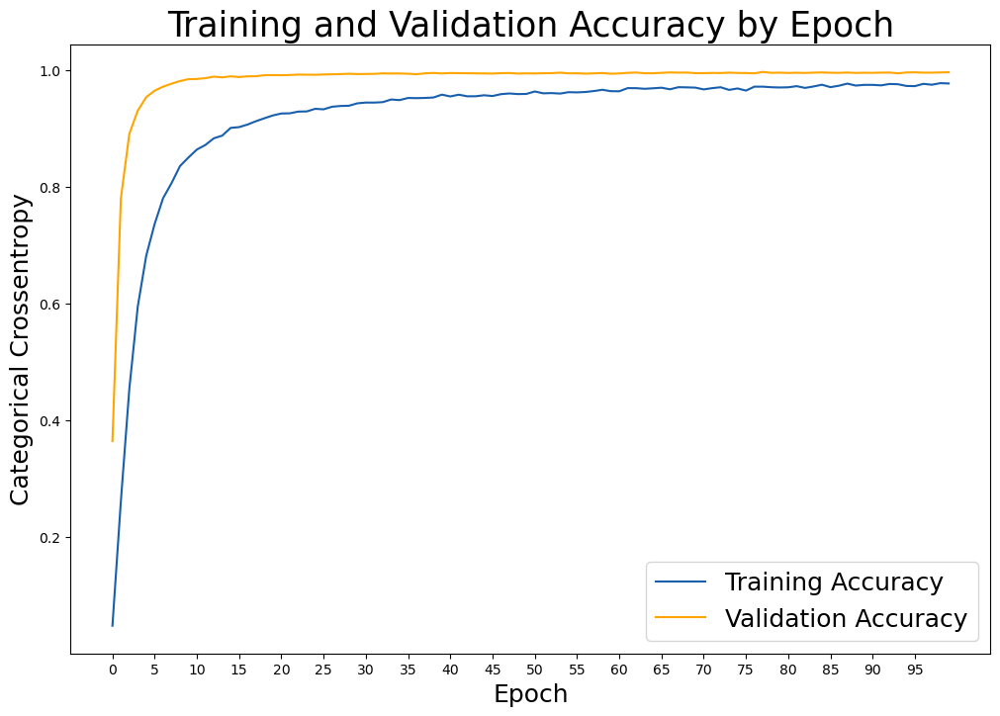

In [151]:
# Check out our train accuracy and validation accuracy over epochs.
train_accuracy = history.history['accuracy']
val_accuracy = history.history['val_accuracy']

# Set figure size.
plt.figure(figsize=(12, 8))

# Generate line plot of training, testing loss over epochs.
plt.plot(train_accuracy, label='Training Accuracy', color='#185fad')
plt.plot(val_accuracy, label='Validation Accuracy', color='orange')

# Set title
plt.title('Training and Validation Accuracy by Epoch', fontsize = 25)
plt.xlabel('Epoch', fontsize = 18)
plt.ylabel('Categorical Crossentropy', fontsize = 18)
plt.xticks(range(0,100,5), range(0,100,5))

plt.legend(fontsize = 18);

# PREDICTIONS

In [154]:
# We get our predictions from the test data
preds = model.predict(X_test)

90/90 [==============================] - 0s 2ms/step


In [159]:
# We transform back our predictions to the speakers ids
preds = lb.inverse_transform(np.argmax(preds,axis=1))

In [161]:
# We slice our dataframe to our test dataframe
df_test = df[train_pts+validate_pts:]

In [162]:
# We create a new column called preds and set it equal to our predictions
df_test['preds'] = preds

/tmp/ipykernel_20040/593711799.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_test['preds'] = preds


In [163]:
# Checking how our test dataframe looks like now with our predictions
df_test

,file,label,speaker,preds
25684,78-368-0021.flac,1,78,78
25685,8465-246947-0008.flac,0,8465,8465
25686,7067-76048-0007.flac,1,7067,7067
25687,625-132112-0041.flac,1,625,625
25688,5703-47198-0027.flac,1,5703,5703
...,...,...,...,...
28534,125-121124-0070.flac,0,125,125
28535,87-121553-0025.flac,0,87,87
28536,322-124147-0048.flac,0,322,322
28537,322-124147-0054.flac,0,322,322


In [164]:
# Checking how many speakers we got wrong
df_test[df_test['speaker'] != df_test['preds']]

,file,label,speaker,preds
25691,4441-76262-0030.flac,1,4441,2989
25736,4088-158077-0076.flac,0,4088,125
25900,1578-6379-0042.flac,0,1578,445
26202,3436-172162-0001.flac,1,3436,3879
26318,5339-14134-0071.flac,0,5339,8425
26381,7505-83618-0000.flac,1,7505,6454
26483,5789-70653-0002.flac,0,5789,8014
26721,8975-270782-0108.flac,0,8975,289
26748,7190-90542-0000.flac,1,7190,2952
26854,8324-286683-0029.flac,0,8324,1246


In [165]:
# Checking our model accuracy
1-round(len(df_test[df_test['speaker'] != df_test['preds']])/len(df_test),3)

0.993

In [166]:
model.save("train-clean-100.h5")

In [187]:
# sample for one user check (extracted features) >> Change the number to find the user up to 2855
recording = X_test[100]
SPEAKER_DF[SPEAKER_DF.ID==lb.inverse_transform(np.argmax(model.predict(np.array([recording])),axis=1))[0]]

1/1 [==============================] - 0s 25ms/step


,ID,SEX,SUBSET,MINUTES,NAME
2062,7278,M,train-clean-100,25.01,Jon Smith
